In [1]:
# load packages and functions
suppressMessages(library(data.table))
suppressMessages(library(dplyr))
suppressMessages(library(ggplot2))
suppressMessages(library(ggpointdensity))
suppressMessages(library(ggrepel))
suppressMessages(library(ggsci))
suppressMessages(library(ggthemes))
suppressMessages(library(magrittr))
suppressMessages(library(patchwork))
suppressMessages(library(RColorBrewer))
suppressMessages(library(stringr))
suppressMessages(library(tidyverse))
suppressMessages(library(viridis))
suppressMessages(library(ComplexHeatmap))

selected_markers<- c("CD45",
                     "CD172ab",
                     "CD8a",
                     "CD20",
                     "CD4",
                     "CD3",
                     "CD56",
                     "CD27",
                     "Bcl-6",
                     "SLAMF7",
                     "CD24",
                     "CD19",
                     "AICDA",
                     "CD86",
                     "CD1c",
                     "CD22",
                     "CD11c",
                     "CD5",
                     "Bcl-2",
                     "IgD",
                     "CXCR5",
                     "CD23",
                     "CD95",
                     "CD25",
                     "CD39",
                     "TLR9",
                     "CD307d",
                     "CD138",
                     "Nur77",
                     "CD83",
                     "CD79b",
                     "CD38",
                     "CD40",
                     "CD10",
                     "IgA",
                     "Pax-5",
                     "PD-L1",
                     "IgG",
                     "ISG15", 
                     "CD21",
                     "Ki67",
                     "T-bet",
                     "IgM",
                     "Blimp1",
                     "HLA-DR",
                     "CD52",
                     "IgE",
                     "CD11b")

# set parameters
prop = 1
n_min = 10000
frac = 0.90
n_neighbors=30
min_dist=0.01
resolution_list=0.5

# cluster annotation
cluster_df = read.table("/projects/jinamo@xsede.org/cytof/data/cluster_annotation.txt",sep="\t",header=TRUE) %>%
    dplyr::filter(cell=="B") %>%
    dplyr::select(-cell) %>%
    dplyr::mutate(cluster = as.character(cluster))

In [2]:
exp_ds <- readRDS(file = "/projects/jinamo@xsede.org/cytof/data/B_cells/B_downsampled_Cells.rds")

`summarise()` has grouped output by 'subject_id__time'. You can override using
the `.groups` argument.


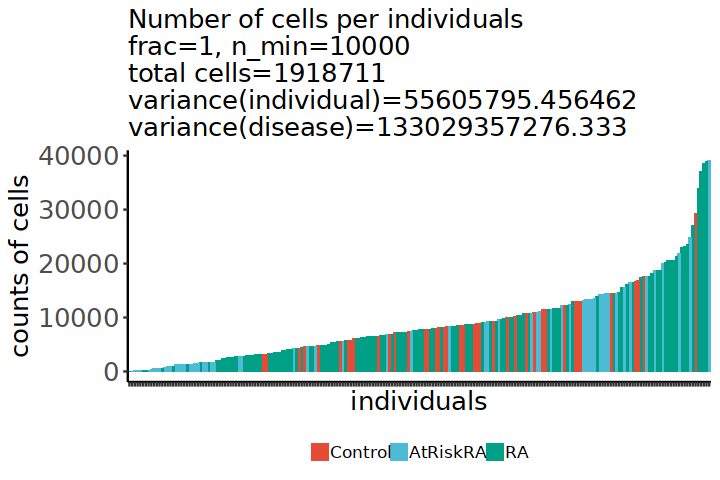

In [3]:
tmp = cbind(
  exp_ds %>%
    dplyr::group_by(subject_id__time) %>%
    dplyr::summarise(cell_counts = n()) %>%
    dplyr::summarise(Total_cell_count=sum(cell_counts), ind_variance=var(cell_counts)),
  exp_ds %>%
    dplyr::group_by(disease) %>%
    dplyr::summarise(cell_counts = n()) %>%
    dplyr::summarise(disease_variance=var(cell_counts))
)
options(repr.plot.height = 4, repr.plot.width = 6)
exp_ds %>%
       dplyr::group_by(subject_id__time, disease) %>%
       dplyr::summarise(cell_counts = n()) %>%
       dplyr::ungroup() %>%
       dplyr::arrange(desc(cell_counts)) %>%
       ggplot() + 
       geom_bar(aes(reorder(subject_id__time,cell_counts),cell_counts, fill = disease), stat = 'identity') + 
       theme_classic() +
       scale_fill_npg() +
       # facet_grid( ~ disease) + 
       theme(strip.text.x=element_text(size=15, color="black", face="bold"),
             strip.text.y=element_text(size=15, color="black", face="bold"),
             legend.position = "bottom",
             plot.title = element_text(size=15),
             axis.title.x = element_text(size=15),
             axis.title.y = element_text(size =15),
             axis.text.y = element_text(size = 15),
             axis.text.x = element_blank(),
             legend.text =  element_text(size = 10), 
             legend.key.size = grid::unit(0.8, "lines"),
             legend.title = element_text(size = 0, hjust = 0)) +
       labs(title = paste0("Number of cells per individuals\nfrac=", prop, ", n_min=",n_min, "\ntotal cells=", tmp$Total_cell_count, "\nvariance(individual)=",tmp$ind_variance,"\nvariance(disease)=",tmp$disease_variance),
            x = 'individuals',
            y = "counts of cells") 

In [4]:
exp_ds %>%
       dplyr::group_by(disease,time_point) %>%
       dplyr::summarise(cell_counts = n())

`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.


disease,time_point,cell_counts
<fct>,<chr>,<int>
Control,V0,382623
AtRiskRA,V0,479058
RA,V0,596452
RA,V1,251332
RA,V2,209246


In [5]:
pca_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/PCA_embeddings_Prop",prop,"_Nmin",n_min,"_topVar",frac,".rds"))
batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))

# check the data
print(dim(pca_res$x))
print(head(pca_res$x))
print(dim(batch_fl))
print(head(batch_fl))

[1] 1918711      20
            PC1       PC2        PC3          PC4       PC5         PC6
[1,] -1.2430858  1.411461 -0.1839083 -0.176563614 0.2256811  0.70137634
[2,] -5.6436869 -2.012866 -3.2506531  1.341466518 1.0683442  0.09723382
[3,] -0.6279192  2.892206 -1.2908797 -0.007503139 0.4828852  1.07375731
[4,] -1.8299464  2.067981  0.6681052  1.286140484 0.3493526  2.28434730
[5,] -0.1202330 -2.096735  0.3915071  1.457744601 3.7451462 -0.27247138
[6,] -5.1827693 -1.759196 -1.3296501  0.589146357 1.8967084 -0.19903817
            PC7         PC8        PC9        PC10        PC11       PC12
[1,] -0.2335702 -0.20374242  0.1142874  1.25015191  0.23941586 -0.7708934
[2,] -2.0864087  1.99861059 -0.8187914 -0.87472594  0.37516210 -0.5560739
[3,]  1.6018748  0.04005575 -0.5924917 -0.03982022  0.44102262 -0.5296378
[4,] -0.1611860 -0.14889632 -0.5784741 -0.07194620 -0.59764469 -0.5628963
[5,]  0.3899889  0.07388521 -0.1001354  0.46022527  0.46231052 -0.4923408
[6,] -3.5668987  1.71876517 -0.2

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


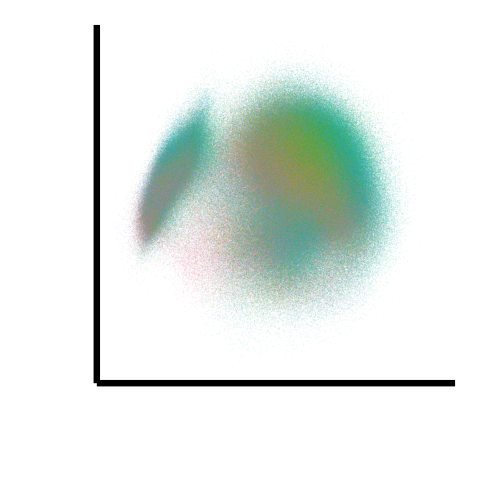

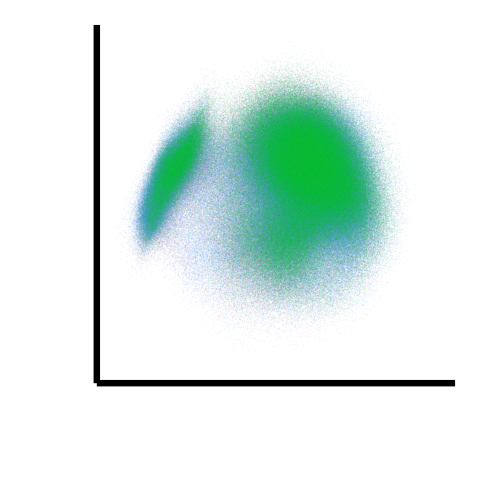

In [6]:
options(repr.plot.height = 4, repr.plot.width = 4)
ggplot() +
    geom_point(
        data = data.frame(pca_res$x[,c("PC1","PC2")],batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "batch"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

ggplot() +
    geom_point(
        data = data.frame(pca_res$x[,c("PC1","PC2")],batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "condition"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

In [7]:
harmony_embeddings_all <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/harmony_embeddings_Prop",prop,"_Nmin",n_min,"_topVar",frac,".rds"))
batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))

In [8]:
print(head(harmony_embeddings_all))
print(dim(harmony_embeddings_all))

             PC1       PC2         PC3         PC4       PC5        PC6
[1,] -0.82789324  1.195992 -0.03727337 -0.08330136 0.1792386 -0.2604374
[2,] -3.25257416 -1.811110 -2.59238565  1.39542287 0.1187887 -0.2924352
[3,] -0.06574211  2.583742 -1.10041426  0.03209783 0.3781169  0.0581862
[4,] -1.28929122  1.777376  0.77336802  1.28254158 0.2328362  1.2280303
[5,]  0.03230211 -3.196932  0.92354805  1.30546438 4.9592360 -1.4883410
[6,] -3.22049153 -1.647252 -0.78367945  0.64091113 1.1863110 -0.6811673
            PC7         PC8         PC9        PC10       PC11        PC12
[1,] -0.3048357 -0.08116100 -0.28701802  0.64853750  0.2907139 -0.22885584
[2,] -0.5206829  0.66968912 -0.31376980 -0.66473478  0.2577848  0.06688193
[3,]  1.4206732  0.21582538 -1.01366210 -0.58222611  0.5916067  0.09727947
[4,] -0.2572026 -0.06524793 -1.06472285 -0.66022196 -0.3904233  0.08560875
[5,]  0.7278112  0.30010043 -0.18465526  0.03551606  0.5017120 -0.07552935
[6,] -2.3397722  0.68065900  0.08257519 -0.498

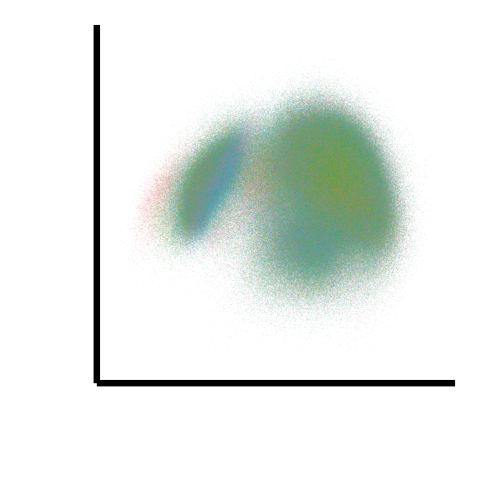

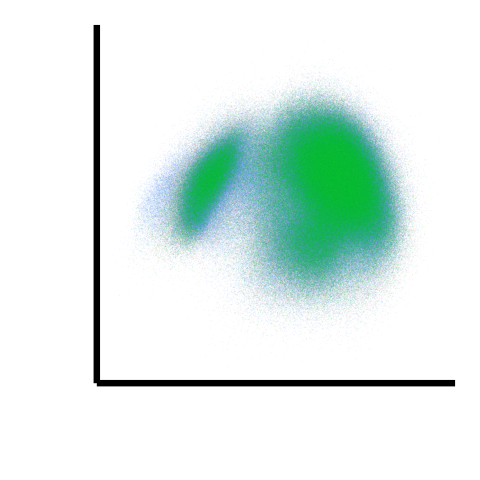

In [9]:

options(repr.plot.height = 4, repr.plot.width = 4)
ggplot() +
    geom_point(
        data = data.frame(harmony_embeddings_all,batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "batch"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

ggplot() +
    geom_point(
        data = data.frame(harmony_embeddings_all,batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "condition"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

`summarise()` has grouped output by 'key'. You can override using the `.groups`
argument.


key,group,median
<chr>,<chr>,<dbl>
Race,after,3.021109
Race,before,2.584026
Site,after,4.782305
Site,before,3.541393
batch,after,7.026499
batch,before,3.773823
condition,after,2.284609
condition,before,2.088043
individual,after,10.844156


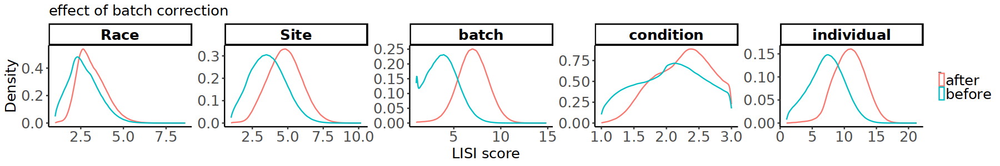

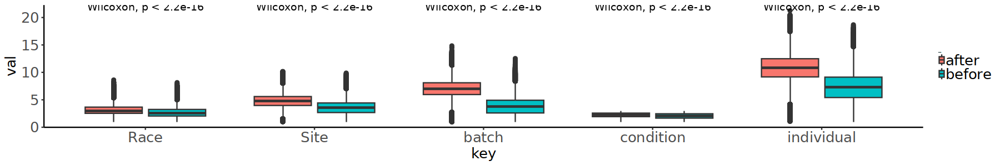

In [10]:
# using PC1-20
LISI_df = rbind(
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/LISI_harmony.rds")) %>%
        dplyr::mutate(group = "after"),
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/LISI_PCA.rds")) %>%
        dplyr::mutate(group = "before")
    ) %>%
    dplyr::mutate(key = ifelse(key=="OmiqFileIndex", "individual", key))


LISI_df %>%
    dplyr::group_by(key,group) %>%
    dplyr::summarize(median = median(val))

options(repr.plot.height = 2.5, repr.plot.width = 15)
ggplot(LISI_df) +
      geom_density(
        aes(x  = val, color = group) 
      ) +
      #   scale_x_continuous(limits = c(1, 15))+
      labs(
        title = "effect of batch correction",
        x = "LISI score",
        y = "Density"
      ) +
      facet_wrap( ~ key, scales = "free", ncol = 5) +
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

LISI_df %>% 
  ggplot(aes(x=key, y=val, fill=group)) +
  geom_boxplot() +
  ggpubr::stat_compare_means(method= "wilcox.test") +
  theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

`summarise()` has grouped output by 'key'. You can override using the `.groups`
argument.


key,group,median
<chr>,<chr>,<dbl>
Race,after,3.326888
Race,before,3.280349
Site,after,5.564365
Site,before,5.462781
batch,after,9.215119
batch,before,8.658560
condition,after,2.356186
condition,before,2.333186
individual,after,15.605002


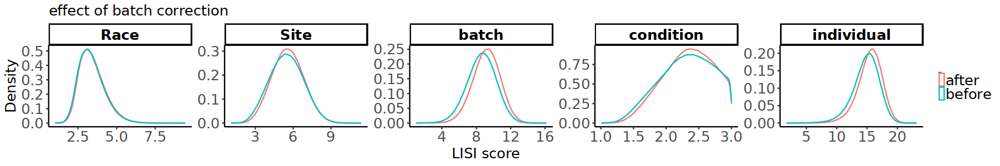

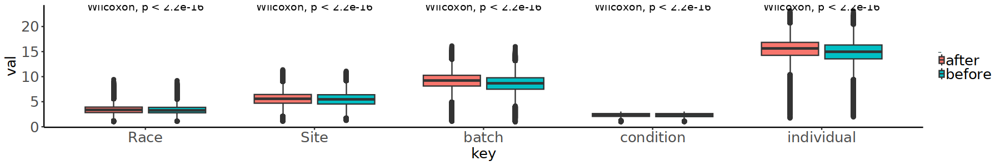

In [11]:
# using PC1-2
LISI_df = rbind(
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/LISI_harmony_PC12.rds")) %>%
        dplyr::mutate(group = "after"),
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/LISI_PCA_PC12.rds")) %>%
        dplyr::mutate(group = "before")
    ) %>%
    dplyr::mutate(key = ifelse(key=="OmiqFileIndex", "individual", key))


LISI_df %>%
    dplyr::group_by(key,group) %>%
    dplyr::summarize(median = median(val))

options(repr.plot.height = 2.5, repr.plot.width = 15)
ggplot(LISI_df) +
      geom_density(
        aes(x  = val, color = group) 
      ) +
      #   scale_x_continuous(limits = c(1, 15))+
      labs(
        title = "effect of batch correction",
        x = "LISI score",
        y = "Density"
      ) +
      facet_wrap( ~ key, scales = "free", ncol = 5) +
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

LISI_df %>% 
  ggplot(aes(x=key, y=val, fill=group)) +
  geom_boxplot() +
  ggpubr::stat_compare_means(method= "wilcox.test") +
  theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

In [12]:
# UMAP visualization
umap_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/umap_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
print(dim(umap_res))
print(head(umap_res))
print(table(umap_res$res_cell))
umap_res$res_cell = factor(umap_res$res_cell, levels=sort(as.integer(unique(umap_res$res_cell))))
umap_res$res_cell

[1] 1918711       5
       UMAP1      UMAP2 disease batch res_cell
1  0.7365184 -2.7977917 Control    15        0
2  2.4667720 -0.2356597 Control    15       12
3  0.1987944 -2.7129869 Control    15        0
4  0.1210516 -3.5780368 Control    15        0
5 -0.9618028  6.6663339 Control    15        7
6  3.5014135  0.1042377 Control    15       12

     0      1     10    100    101    102    103    104    105    106    107 
418406 347622  23069      1      1      1      1      1      1      1      1 
   108    109     11    110    111    112    113    114    115    116    117 
     1      1  10475      1      1      1      1      1      1      1      1 
   118    119     12    120    121    122    123    124    125    126    127 
     1      1   4350      1      1      1      1      1      1      1      1 
   128    129     13    130    131    132    133    134    135    136    137 
     1      1   1793      1      1      1      1      1      1      1      1 
   138    139     14    14

[1] 0  12 0  0  7  12 2  1  7  1  12 2  2  12 12 5  12 9  12 0  12 2  0  10
   [25] 3  8  4  12 12 0  12 0  12 8  12 3  2  3  0  1  5  1  12 2  3  0  1  0 
   [49] 12 12 4  3  5  2  1  4  12 3  1  0  1  3  4  8  12 0  3  4  3  2  2  12
   [73] 1  3  5  3  2  12 1  12 0  3  12 12 0  12 1  0  0  0  3  2  12 1  4  3 
   [97] 2  4  0  1  4  3  0  12 3  12 12 0  12 0  2  1  3  2  12 2  12 12 1  1 
  [121] 0  2  5  2  12 3  0  2  0  12 12 4  3  5  5  2  2  12 12 2  12 1  1  4 
  [145] 5  4  1  3  3  2  2  10 0  7  2  2  5  2  8  1  1  12 1  0  2  1  0  0 
  [169] 3  1  0  4  0  3  5  1  1  12 0  3  1  0  1  1  12 3  7  8  12 1  4  2 
  [193] 0  3  12 1  0  1  1  1  4  0  4  2  4  4  5  6  2  2  3  1  2  0  4  5 
  [217] 1  4  0  3  3  0  1  2  0  2  7  1  2  2  4  2  0  5  0  2  0  2  1  5 
  [241] 5  8  3  5  0  0  3  1  0  3  4  5  1  0  0  3  6  1  2  0  2  8  1  6 
  [265] 5  1  1  0  1  10 1  0  0  12 1  4  2  3  1  2  6  1  4  10 2  5  1  1 
  [289] 3  3  3  2  1  4  3  1  2  1  3  0  5  0  2  2  4  2  1  0  0  8  0  0 
  [313] 1  2  0  3  4  3  2  0  3  0  1  2  0  1  1  4  6  1  1  7  3  1  0  4 
  [337] 3  0  6  5  0  2  1  0  0  1  0  3  0  7  0  4  0  3  0  0  1  0  1  3 
  [361] 0  6  5  3  1  3  0  0  0  0  7  6  2  5  3  1  3  2  3  3  0  4  3  0 
  [385] 7  1  0  1  0  0  1  0  6  3  3  2  3  3  9  0  3  2  1  0  3  5  2  1 
  [409] 4  4  2  0  1  3  1  1  3  7  3  1  2  5  5  2  4  3  1  7  3  3  5  5 
  [433] 1  8  2  7  8  1  0  2  0  6  1  3  7  6  2  3  0  4  5  4  2  2  0  3 
  [457] 0  3  1  0  0  5  2  4  6  3  8  3  1  1  2  2  0  3  3  1  1  3  10 1 
  [481] 1  4  0  0  1  1  2  0  3  2  7  3  8  1  2  5  0  6  1  11 4  10 3  1 
  [505] 1  8  1  0  8  9  0  1  3  3  2  2  3  6  4  0  0  3  2  1  10 3  3  0 
  [529] 0  3  11 2  0  0  4  5  2  2  3  1  4  1  2  3  2  1  4  7  3  2  0  1 
  [553] 1  0  0  12 6  1  1  0  3  2  1  0  5  3  0  1  1  2  2  4  3  0  4  1 
  [577] 0  0  2  6  2  1  3  3  3  10 5  2  9  1  1  3  0  0  4  4  0  5  6  6 
  [601] 4  1  1  3  9  3  3  2  3  2  5  1  1  2  0  2  1  3  1  4  0  0  5  10
  [625] 0  4  2  2  2  5  3  1  1  2  3  4  2  0  6  1  2  2  1  2  6  2  3  4 
  [649] 4  2  2  2  0  2  2  0  3  4  0  0  3  5  1  3  2  2  2  10 0  5  6  3 
  [673] 1  1  5  0  3  3  3  10 4  2  5  3  0  1  3  5  1  1  6  1  2  0  0  5 
  [697] 2  3  0  3  6  2  4  1  3  5  7  4  1  11 1  1  1  5  1  10 1  1  2  0 
  [721] 5  1  0  0  3  1  3  3  0  1  6  2  6  3  6  1  1  1  3  0  6  3  5  1 
  [745] 8  6  0  5  1  1  1  2  5  3  4  8  4  2  0  0  2  0  1  4  5  3  1  0 
  [769] 4  0  11 3  2  2  1  5  1  4  5  1  3  3  3  6  2  1  0  3  0  3  4  1 
  [793] 0  1  3  4  0  3  1  9  3  1  3  3  0  3  2  0  3  7  1  1  3  4  4  3 
  [817] 0  5  1  4  6  0  10 4  1  1  8  0  10 1  2  0  1  4  0  5  6  8  0  5 
  [841] 1  1  0  0  3  2  2  3  2  4  2  3  4  1  0  3  2  3  1  3  3  4  1  3 
  [865] 0  1  0  2  3  5  0  2  9  1  10 8  1  3  2  4  0  1  3  3  6  0  3  0 
  [889] 6  0  2  4  5  3  2  1  6  10 1  6  3  0  1  10 2  9  0  0  6  1  3  6 
  [913] 2  2  4  1  9  3  2  3  3  11 5  1  1  3  6  0  2  0  4  0  0  4  3  5 
  [937] 2  1  4  5  3  1  7  0  0  4  2  3  1  2  7  2  4  6  7  2  1  3  2  5 
  [961] 3  8  4  2  1  10 0  3  0  1  0  3  0  3  6  4  0  1  2  5  0  4  0  8 
  [985] 3  2  1  2  1  10 0  0  1  2  4  1  0  3  2  5  1  3  1  1  0  0  1  0 
 [1009] 3  0  3  1  2  10 1  4  1  2  3  1  1  0  0  0  6  1  6  6  3  3  0  1 
 [1033] 3  7  6  0  0  5  5  4  5  4  4  7  3  4  7  1  4  4  0  1  3  5  5  1 
 [1057] 4  1  3  1  2  5  1  3  2  0  2  0  2  2  7  7  5  1  0  3  3  10 4  1 
 [1081] 1  5  0  1  4  5  12 1  2  1  0  0  2  3  1  0  1  3  1  1  0  1  4  3 
 [1105] 3  3  2  1  0  3  0  1  1  0  3  0  8  1  3  1  6  5  2  2  5  2  6  9 
 [1129] 8  1  2  6  1  1  2  3  3  5  2  1  2  3  10 1  1  3  1  8  3  0  3  11
 [1153] 4  5  4  1  2  5  0  1  1  1  1  7  3  3  1  3  0  0  8  3  4  3  0  6 
 [1177] 1  0  4  2  2  3  2  4  1  1  4  1  0  2  3  0  1  10 6  4  1  1  3  0 
 [12

In [13]:
# remove clusters less than cut off
min_cell_cluster = 30
clu = umap_res %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::arrange(count) %>%
    dplyr::filter(count > min_cell_cluster) %>%
    .$res_cell %>%
    unique()
clu_logi = umap_res$res_cell %in% clu
print(dim(umap_res[clu_logi,]))
print(table(umap_res[clu_logi,]$res_cell))
print(length(unique(umap_res[clu_logi,]$res_cell)))
umap_res = umap_res[clu_logi,]

[1] 1918239       5

     0      1      2      3      4      5      6      7      8      9     10 
418406 347622 285194 210384 158287 149494 143939  73727  58132  32927  23069 
    11     12     13     14     15     16     17     18     19     20     21 
 10475   4350   1793    130     92     67     64     46     41      0      0 
    22     23     24     25     26     27     28     29     30     31     32 
     0      0      0      0      0      0      0      0      0      0      0 
    33     34     35     36     37     38     39     40     41     42     43 
     0      0      0      0      0      0      0      0      0      0      0 
    44     45     46     47     48     49     50     51     52     53     54 
     0      0      0      0      0      0      0      0      0      0      0 
    55     56     57     58     59     60     61     62     63     64     65 
     0      0      0      0      0      0      0      0      0      0      0 
    66     67     68     69     70     71  

In [14]:
# Find cluster center
cluster_center <- umap_res %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1, UMAP2), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”


In [15]:
# meta data

batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))
batch_fl$subject_id <- stringr::str_split(batch_fl$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)
batch_fl = batch_fl[clu_logi,]
umap_res$subject_id = batch_fl$subject_id
umap_res$time_point = batch_fl$time_point

meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
meta = merge(umap_res,meta,by="subject_id")
meta = meta[order(match(meta$subject_id, umap_res$subject_id)),]
all(meta$subject_id == umap_res$subject_id)

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_add = dplyr::left_join(umap_res,meta_add,by="subject_id")

meta_total = read.csv("/projects/jinamo@xsede.org/cytof/data/Total_Metadata.csv") %>%
    dplyr::mutate(subject_id = gsub("-","_",Patient)) %>%
    dplyr::distinct(subject_id,Site,Race)
meta_total = meta_total[!(is.na(meta_total$Race) | meta_total$Race==""), ]
meta_total = merge(umap_res,meta_total,by="subject_id")
meta_total = meta_total[order(match(meta_total$subject_id, umap_res$subject_id)),]
all(meta_total$subject_id == umap_res$subject_id)

umap_res$AtRisk = dplyr::case_when(
  meta$AMP_Group == "FDR" & meta$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta$AMP_Group == "GP" & meta$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta$AMP_Group == "FDR" & meta$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta$AMP_Group == "GP" & meta$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  umap_res$disease == "Control" ~ "Control",
  umap_res$disease == "RA" ~ "RA")
umap_res$AtRisk = factor(umap_res$AtRisk,levels=c("Control","FDR(-)/ACPA(-)","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))
umap_res$disease = dplyr::case_when(
  umap_res$AtRisk == "FDR(+)/ACPA(+)" | umap_res$AtRisk == "FDR(-)/ACPA(+)" | umap_res$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  umap_res$AtRisk == "Control" | umap_res$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  umap_res$AtRisk == "RA" ~ "RA")
umap_res$disease = factor(umap_res$disease,levels=c("Control","AtRiskRA","RA"))
umap_res$age_at_biopsy <- as.numeric(meta$age_at_biopsy)
umap_res$sex <- as.numeric(factor(meta$sex, c('female', 'male')))
umap_res$ethnicity <- as.numeric(factor(meta$ethnicity, c('not_hispanic', 'hispanic_latino')))
umap_res$AMP_Group <- as.numeric(factor(meta$AMP_Group, c('GP', 'FDR')))
umap_res$CCP <- dplyr::case_when(
    meta$CCP == 'Negative' ~ "at-risk CCP(-)", 
    meta$CCP == 'Positive' ~ "at-risk CCP(+)",
    umap_res$AtRisk == "Control" ~ "Control")
umap_res$CCP <- factor(umap_res$CCP,levels=c("Control","at-risk CCP(-)","at-risk CCP(+)"))
umap_res$CCP30_titer <- as.numeric(meta$CCP30_titer)
umap_res$CCP31_titer <- as.numeric(meta$CCP31_titer)
umap_res$RF <- factor(meta$RF, c('Negative', 'Positive'))
umap_res$RF_IgM_titer <- as.numeric(meta$RF_IgM_titer)
umap_res$RF_IgG_titer <- as.numeric(meta$RF_IgG_titer)
umap_res$RF_IgA_titer <- as.numeric(meta$RF_IgA_titer)
umap_res$Site = meta_total$Site
umap_res$Race = meta_total$Race

head(umap_res)
table(umap_res$time_point)
table(umap_res$AtRisk)
table(umap_res$disease)

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


[1] TRUE

[1] TRUE

,UMAP1,UMAP2,disease,batch,res_cell,subject_id,time_point,AtRisk,age_at_biopsy,sex,...,AMP_Group,CCP,CCP30_titer,CCP31_titer,RF,RF_IgM_titer,RF_IgG_titer,RF_IgA_titer,Site,Race
,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<dbl>,<dbl>,...,<dbl>,<fct>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,0.7365184,-2.7977917,Control,15,0,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
2,2.4667720,-0.2356597,Control,15,12,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
3,0.1987944,-2.7129869,Control,15,0,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
4,0.1210516,-3.5780368,Control,15,0,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
5,-0.9618028,6.6663339,Control,15,7,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
6,3.5014135,0.1042377,Control,15,12,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]



     V0      V1      V2 
1457767  251276  209196 


       Control FDR(-)/ACPA(-) FDR(+)/ACPA(-) FDR(-)/ACPA(+) FDR(+)/ACPA(+) 
        382521          42993         182046         103717         150199 
            RA 
       1056763 


 Control AtRiskRA       RA 
  425514   435962  1056763 

In [16]:
get_density <- function(x, y, ...) {
  dens <- MASS::kde2d(x, y, ...)
  ix <- findInterval(x, dens$x)
  iy <- findInterval(y, dens$y)
  ii <- cbind(ix, iy)
  return(dens$z[ii])
}

umap_res %<>%
    dplyr::group_by(disease) %>%
    dplyr::mutate(density_disease = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(batch) %>%
    dplyr::mutate(density_batch = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(res_cell) %>%
    dplyr::mutate(density_cluster = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(AtRisk) %>%
    dplyr::mutate(density_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(time_point,AtRisk) %>%
    dplyr::mutate(density_time_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(CCP) %>%
    dplyr::mutate(density_AtRiskCCP = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Site,AtRisk) %>%
    dplyr::mutate(density_site_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Site,disease) %>%
    dplyr::mutate(density_site_condition = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Race,AtRisk) %>%
    dplyr::mutate(density_race_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup()

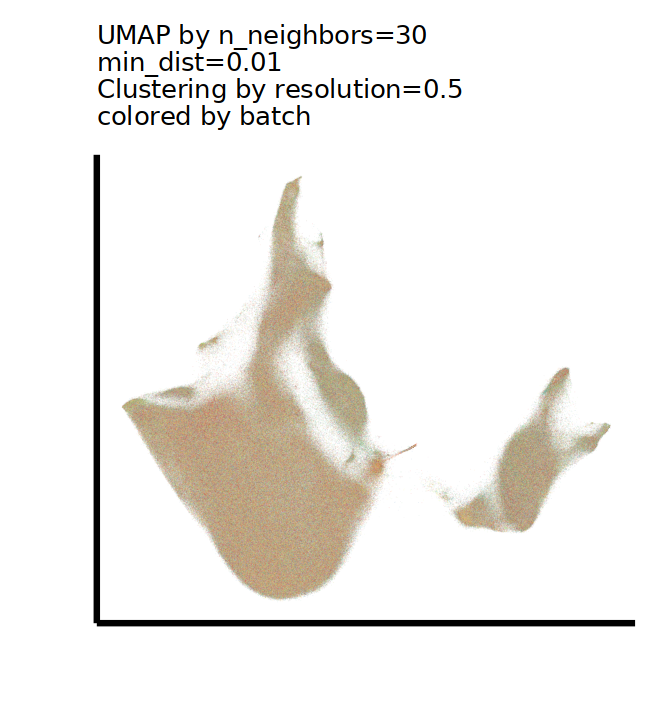

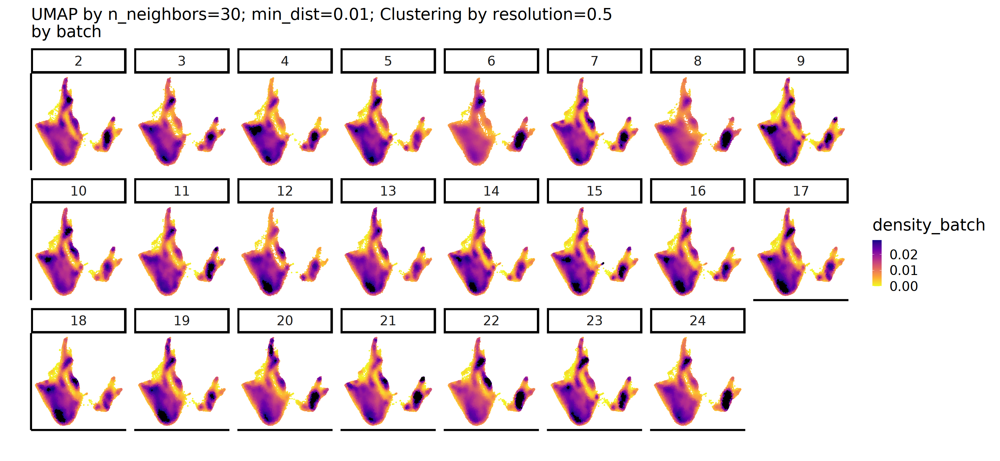

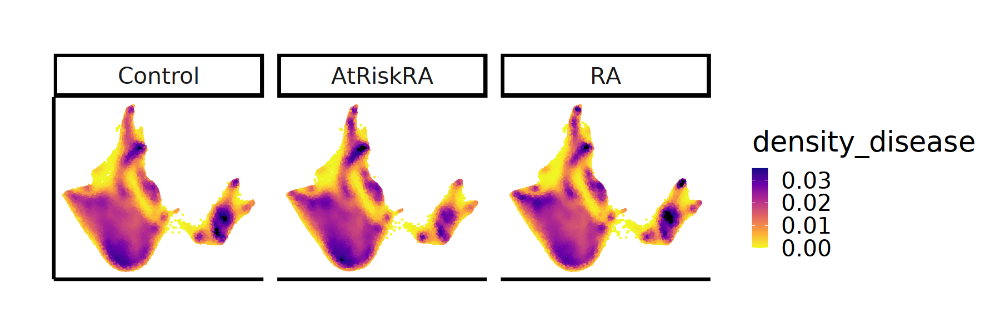

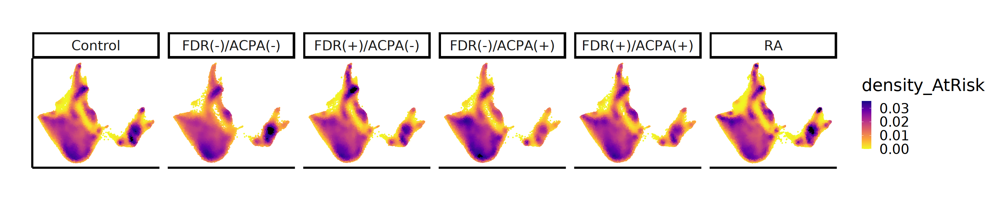

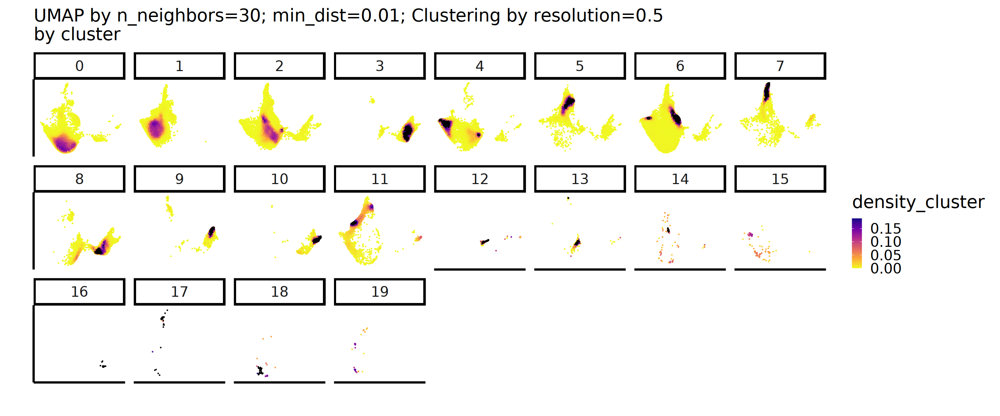

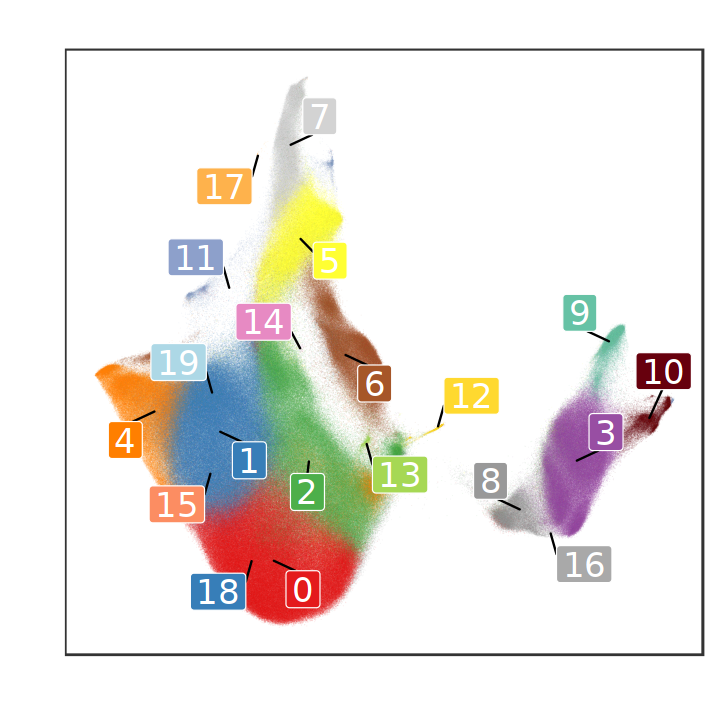

In [17]:

options(repr.plot.height = 6, repr.plot.width = 5.5)
plot(ggplot() +
       geom_point(
         data = umap_res,
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "batch"),
         size = 0.01, stroke = 0, shape = 16, alpha = 0.1
       ) +
       scale_color_manual(values = c(
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#E41A1C",
         "24" = "#377EB8")) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"\nmin_dist=",min_dist,"\nClustering by resolution=",resolution_list,"\ncolored by batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=15, face = "italic")
       )
)

options(repr.plot.height = 12, repr.plot.width = 26)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_batch),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_batch, probs = seq(0, 1, 0.1))["90%"])) +
       facet_wrap( ~ batch, ncol = 8) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"; min_dist=",min_dist,"; Clustering by resolution=",resolution_list,"\nby batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)
# dev.off()

options(repr.plot.height = 5, repr.plot.width = 15)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_disease),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_disease, probs = seq(0, 1, 0.01))["98%"])) +
       facet_wrap( ~ disease, ncol = 3) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 5, repr.plot.width = 25)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_AtRisk),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_AtRisk, probs = seq(0, 1, 0.01))["98%"])) +
       facet_wrap( ~ AtRisk, ncol = 6) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 10, repr.plot.width = 24)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_cluster),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_cluster, probs = seq(0, 1, 0.1))["70%"])) +
       facet_wrap( ~ res_cell, ncol = 8) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"; min_dist=",min_dist,"; Clustering by resolution=",resolution_list,"\nby cluster"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 6, repr.plot.width = 6)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_cluster.png"), width = 1400, height = 1400,res=360)
plot(ggplot() +
       geom_point(
         data = umap_res %>% dplyr::mutate(res_cell = factor(res_cell,levels=cluster_df$cluster)),
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "res_cell"),
         size = 0.01, stroke = 0, shape = 16, alpha = 0.1
       ) +
       geom_label_repel(
         data = cluster_center,
         aes(x = UMAP1, y = UMAP2, label = res_cell, fill = res_cell),
         color = "white",segment.color = "black",
           size = 7,
         min.segment.length = 0, seed = 42, box.padding = 0.5
       ) +
       scale_color_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       scale_fill_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       labs(
         x = "",
         y = "",
         title = ""
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=10)
       ) 
)
# dev.off()



In [19]:
exprs_norm <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/arcsinh_transformed_transposed_Prop",prop,"_Nmin",n_min,".rds"))
print(dim(exprs_norm))
exprs_norm = exprs_norm[, clu_logi]

[1]      48 1918711


In [20]:
clu_marker <- presto::wilcoxauc(exprs_norm, umap_res$res_cell)
x <- clu_marker %>%
  dplyr::group_by(group) %>%
  dplyr::top_n(9, wt = logFC) 
x
# x[order(x$cluster, decreasing = FALSE),]


## parameter	description
## feature	name of feature.
## group	name of group label.
## avgExpr	mean value of feature in group.
## logFC	log fold change between observations in group vs out.
## statistic	Wilcoxon rank sum U statistic.
## auc	area under the receiver operator curve.
## pval	nominal p value, from two-tailed Gaussian approximation of U statistic.
## padj	Benjamini-Hochberg adjusted p value.
## pct_in	Percent of observations in the group with non-zero feature value.
## pct_out	Percent of observations out of the group with non-zero feature value.

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD22,0,2.053232595,0.4192472640,417738368009,0.6656770,0.000000e+00,0.000000e+00,100,100
IgD,0,4.420517683,1.0229150392,392670394157,0.6257305,0.000000e+00,0.000000e+00,100,100
CXCR5,0,2.946588683,0.4563005460,419566625856,0.6685904,0.000000e+00,0.000000e+00,100,100
CD23,0,1.724695598,1.2614957562,551965400544,0.8795713,0.000000e+00,0.000000e+00,100,100
CD39,0,1.730841096,0.5106413952,419366045599,0.6682708,0.000000e+00,0.000000e+00,100,100
CD40,0,2.002182592,0.3987786148,424809009252,0.6769443,0.000000e+00,0.000000e+00,100,100
Pax-5,0,4.027812325,0.4752068321,421188562568,0.6711750,0.000000e+00,0.000000e+00,100,100
CD21,0,3.070962242,0.5215279864,408862254626,0.6515327,0.000000e+00,0.000000e+00,100,100
HLA-DR,0,4.391910862,0.9186610545,488174191220,0.7779183,0.000000e+00,0.000000e+00,100,100


In [21]:
## Heatmap of marker genes
# marker_plot <- unique(x$feature)
marker_plot <- unique(clu_marker$feature)

exp_heat <- exprs_norm[marker_plot,]
exp_heat <- t(exp_heat)
exp_heat <- as.data.frame(exp_heat)
exp_heat$res_cell <- as.character(umap_res$res_cell)

exp_ave <- aggregate(exp_heat[, 1:(ncol(exp_heat)-1)], list(exp_heat$res_cell), mean)
colnames(exp_ave)[1] <- "res_cell"
exp_ave <- as.data.frame(t(exp_ave))
colnames(exp_ave) <- as.character(t(exp_ave[1,]))
exp_ave <- exp_ave[-1,]
row_names <- rownames(exp_ave)
exp_ave <- mutate_all(exp_ave, function(x) as.numeric(as.character(x)))
rownames(exp_ave) <- row_names 
colnames(exp_ave) = paste0("B-",
                           cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[colnames(exp_ave),] %>%
    .$cluster,
                           ":",
                           cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[colnames(exp_ave),] %>%
    .$clu_name)                
head(exp_ave)
dim(exp_ave)     
                      
# Overwrite default draw_colnames in the pheatmap package.
# Thanks to Josh O'Brien at http://stackoverflow.com/questions/15505607
draw_colnames_45 <- function (coln, gaps, ...) {
  coord <- pheatmap:::find_coordinates(length(coln), gaps)
  x     <- coord$coord - 0.5 * coord$size
  res   <- grid::textGrob(
    coln, x = x, y = unit(1, "npc") - unit(3,"bigpts"),
    vjust = 0.75, hjust = 1, rot = 45, gp = grid::gpar(...)
  )
  return(res)
}
assignInNamespace(
  x = "draw_colnames",
  value = "draw_colnames_45",
  ns = asNamespace("pheatmap")
)
exp_ave <- as.matrix(exp_ave)
mat_breaks <- seq(min(exp_ave), max(exp_ave), length.out = 10)
quantile_breaks <- function(xs, n = 10) {
  breaks <- quantile(xs, probs = seq(0, 1, length.out = n))
  breaks[!duplicated(breaks)]
}

mat_breaks <- quantile_breaks(exp_ave, n = 20)
scale_rows <- function(x) t(scale(t(x)))
exp_ave_scale <- scale_rows(exp_ave) # Z-score
exp_ave_scale<- na.omit(exp_ave_scale)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 10)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 6)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
exp_ave_scale[exp_ave_scale > 2] <- 2
exp_ave_scale[exp_ave_scale < -2] <- -2
head(exp_ave_scale)
dim(exp_ave_scale)

,B-0:Naive,B-1:CD23(FCER2)- Naive,B-10:PB,B-11:CD1c+TLR9+ proliferating Naive,B-12:CXCR5+SLAMF7+IgE+ DN2,B-13:USM,B-14:BCL2high Naive,B-15:CD79bhigh Naive,B-16:CD10+ DN1,B-17:TLR9highCD307d(FCRL4)+ Naive,B-18:CD40highCD10+ Naive,B-19:AICDA+CD1c+ Naive,B-2:CD38low aNaive,B-3:SM,B-4:T1+T2,B-5:CD38-TLR9+ Naive,B-6:PAX5dim Naive,B-7:aNaive,B-8:IgDlowIgMlow Naive,B-9:CD11c+Tbet+ DN2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD45,2.30915000,2.34867000,2.49067500,2.45565500,1.87058600,2.38284400,2.30097200,2.37752000,3.16309000,2.14159100,2.212794000,2.11824100,2.05260900,2.20451600,2.18722200,2.30316900,2.28621500,2.34558000,1.91261800,2.09676100
CD172ab,0.12637848,0.12817294,0.16123922,0.16594030,0.14251636,0.12677021,0.09354605,0.12663551,0.07507098,0.19129281,0.092947120,0.12738916,0.12215298,0.12639973,0.13422978,0.13517571,0.12764308,0.13484939,0.13885788,0.13572901
CD8a,0.06293250,0.06336272,0.08723743,0.08804990,0.07670016,0.08371854,0.07416191,0.06232173,0.08511142,0.08525649,0.073063410,0.08399330,0.06248373,0.07099190,0.07896331,0.06468886,0.06572637,0.09500514,0.06583465,0.10172351
CD20,2.45729800,2.49151600,2.66066400,2.95312700,2.55571900,3.18063700,2.46791200,2.70331100,2.90899100,2.38647400,2.549077000,2.42470000,2.41910600,2.77629300,2.96180700,2.49309100,2.53310300,3.42632700,2.42998700,3.80169200
CD4,0.04294651,0.04159116,0.05063258,0.05695897,0.06121673,0.05956248,0.04628353,0.03531161,0.08643562,0.05211989,0.028406310,0.06934694,0.04095289,0.04819197,0.05460615,0.04106249,0.04442239,0.07085164,0.04161263,0.07939835
CD3,0.01798973,0.01773084,0.02278581,0.02197186,0.02875588,0.01975501,0.02526031,0.01809118,0.02966365,0.02216161,0.007757865,0.01891202,0.01728428,0.01874406,0.01852825,0.01768099,0.01761431,0.02073009,0.01746834,0.02248486


[1] 48 20

,B-0:Naive,B-1:CD23(FCER2)- Naive,B-10:PB,B-11:CD1c+TLR9+ proliferating Naive,B-12:CXCR5+SLAMF7+IgE+ DN2,B-13:USM,B-14:BCL2high Naive,B-15:CD79bhigh Naive,B-16:CD10+ DN1,B-17:TLR9highCD307d(FCRL4)+ Naive,B-18:CD40highCD10+ Naive,B-19:AICDA+CD1c+ Naive,B-2:CD38low aNaive,B-3:SM,B-4:T1+T2,B-5:CD38-TLR9+ Naive,B-6:PAX5dim Naive,B-7:aNaive,B-8:IgDlowIgMlow Naive,B-9:CD11c+Tbet+ DN2
CD45,0.1172936,0.26621824,0.8013408,0.6693737,-1.53536290,0.39499735,0.08647615,0.37493473,2.0000000,-0.51412501,-0.2458082,-0.6021157,-0.8494391,-0.2770025,-0.3421721,0.09475518,0.03086682,0.2545741,-1.3769722,-0.6830595
CD172ab,-0.1684703,-0.09764369,1.2074697,1.3930196,0.46848561,-0.15300890,-1.46435378,-0.15832546,-2.0000000,2.00000000,-1.4879933,-0.1285792,-0.3352492,-0.1676316,0.1414175,0.17875296,-0.11855706,0.1658732,0.3240868,0.2005915
CD8a,-1.1515020,-1.11516604,0.9012694,0.9698899,0.01130155,0.60406730,-0.20307665,-1.20308707,0.7217086,0.73396110,-0.2958549,0.6272733,-1.1894047,-0.4708127,0.2024451,-1.00316151,-0.91553439,1.5573229,-0.9063892,2.0000000
CD20,-0.7161747,-0.62599388,-0.1802078,0.5905725,-0.45678818,1.19017047,-0.68820174,-0.06781247,0.4742530,-0.90282993,-0.4742930,-0.8020861,-0.8168290,0.1245301,0.6134485,-0.62184300,-0.51639219,1.8376815,-0.7881523,2.0000000
CD4,-0.6458624,-0.73658340,-0.1313918,0.2920681,0.57706321,0.46633522,-0.42249744,-1.15690798,2.0000000,-0.03183799,-1.6191174,1.1212626,-0.7793063,-0.2947551,0.1345810,-0.77197017,-0.54707371,1.2219804,-0.7351463,1.7940584
CD3,-0.4457703,-0.50128688,0.5826760,0.4081368,1.86286677,-0.06723232,1.11329575,-0.42401742,2.0000000,0.44882599,-2.0000000,-0.2479996,-0.5970449,-0.2840157,-0.3302935,-0.51197474,-0.52627498,0.1418573,-0.5575760,0.5181416


[1] 48 20

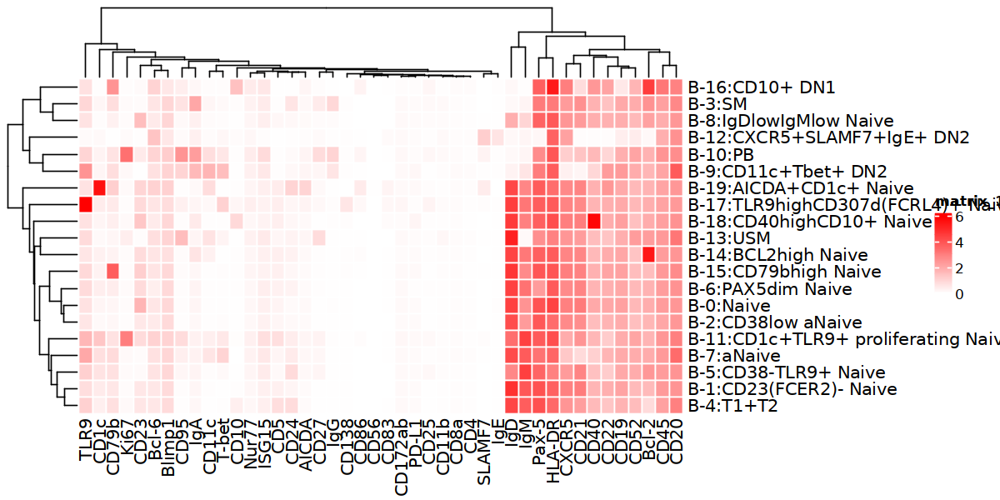

In [22]:

options(repr.plot.height = 5, repr.plot.width = 10)
plot(
    pheatmap(
      mat = t(exp_ave[!grepl("CD3",rownames(exp_ave)),]),
      border_color = "white",
      #breaks  = mat_breaks,
      #color  =inferno(length(mat_breaks) - 1),
      color= colorRampPalette(c("white", "red"))(length(mat_breaks)),
      show_rownames = TRUE,
      show_colnames = TRUE,
      cluster_rows = TRUE,
      cluster_cols = TRUE,
      # cutree_rows = 5,
      # cutree_cols = 3,
      #   annotation_col = annotation_col,
      #   annotation_colors = meta_colors,
      fontsize = 12,
      fontsize_row = 12,
      scale = "none"
    )
)


In [23]:
ph_markers_data_arcsinh = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/arcsinh_transformed_Prop",prop,"_Nmin",n_min,".rds"))
ph_markers_data_arcsinh = ph_markers_data_arcsinh[clu_logi,]
dim(ph_markers_data_arcsinh)
head(ph_markers_data_arcsinh)
dim(umap_res)
head(umap_res)

[1] 1918239      48

CD45,CD172ab,CD8a,CD20,CD4,CD3,CD56,CD27,Bcl-6,SLAMF7,...,ISG15,CD21,Ki67,T-bet,IgM,Blimp1,HLA-DR,CD52,IgE,CD11b
1.5262849,0.1462608871,5.334859e-05,1.842786,0.0015749987,1.938676e-03,-3.129574e-03,-0.0017429095,0.47843532,-0.0024915791,...,0.002665638,2.758364749,-0.0038266637,-0.001280954,1.293453526,0.3196182,4.966562,2.242661e+00,-0.0008729272,0.0013951004
0.7712006,-0.0024141292,1.247195e-03,2.724227,-0.0021779847,1.267231e-03,-9.521586e-04,0.0001304611,-0.00148897,0.8743969485,...,0.002292670,-0.001285936,0.0017015782,0.001954027,-0.001263385,0.5302003,3.397739,7.688933e-01,0.5929144835,0.0018603091
1.2129986,0.1583368710,-1.977344e-03,2.871013,0.4424320134,1.888206e-03,2.493974e-05,-0.0011162965,0.79081783,-0.0027560083,...,0.002848658,3.252625620,0.1999610587,-0.001122370,0.167173269,0.8746458,5.340327,2.477587e+00,0.1255165075,0.0006455903
1.8948662,0.2372176774,1.668368e-03,1.900382,-0.0004713520,8.848139e-05,-1.499603e-03,-0.0019861377,0.27584725,0.0003664948,...,-0.001758981,2.905585525,0.0001892499,-0.000955254,1.215647751,1.7923584,5.753950,2.377347e+00,-0.0015244549,-0.0028432362
2.5111940,0.0005548585,3.634246e-02,3.253837,0.2097216451,-5.813820e-06,1.020463e-03,0.0013953131,-0.00392410,0.0001027927,...,0.326977544,0.000433875,-0.0023422311,0.167630625,3.063547883,0.7690081,4.754995,1.659223e+00,0.0020929585,-0.0015061180
1.7227566,0.0586995047,1.242803e+00,2.948410,0.0004518516,-1.861073e-03,5.489979e-04,0.0526141019,2.21562204,1.3737637694,...,0.003703985,0.001216378,1.0111413820,-0.001119798,0.777230306,0.6055431,4.266220,3.473255e-05,0.5010510635,-0.0009694622


[1] 1918239      30

UMAP1,UMAP2,disease,batch,res_cell,subject_id,time_point,AtRisk,age_at_biopsy,sex,...,Race,density_disease,density_batch,density_cluster,density_AtRisk,density_time_AtRisk,density_AtRiskCCP,density_site_AtRisk,density_site_condition,density_race_AtRisk
<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<dbl>,<dbl>,...,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.7365184,-2.7977917,Control,15,0,200_0272,V0,Control,28,1,...,[American Indian_Alaska tive],0.026303590,0.02421425,0.11596703,0.026115626,0.026115626,0.026115626,0.025851780,0.025851780,0.021447273
2.4667720,-0.2356597,Control,15,12,200_0272,V0,Control,28,1,...,[American Indian_Alaska tive],0.017380792,0.01036431,0.23996819,0.018029301,0.018029301,0.018029301,0.017544920,0.017544920,0.014876913
0.1987944,-2.7129869,Control,15,0,200_0272,V0,Control,28,1,...,[American Indian_Alaska tive],0.022725269,0.02139589,0.09458079,0.022305522,0.022305522,0.022305522,0.022861511,0.022861511,0.021943465
0.1210516,-3.5780368,Control,15,0,200_0272,V0,Control,28,1,...,[American Indian_Alaska tive],0.013626312,0.01298598,0.08532341,0.013693597,0.013693597,0.013693597,0.014280642,0.014280642,0.012691687
-0.9618028,6.6663339,Control,15,7,200_0272,V0,Control,28,1,...,[American Indian_Alaska tive],0.014829231,0.01322692,0.57824010,0.014688221,0.014688221,0.014688221,0.012750462,0.012750462,0.007716382
3.5014135,0.1042377,Control,15,12,200_0272,V0,Control,28,1,...,[American Indian_Alaska tive],0.007238595,0.02648750,50.70129888,0.007292504,0.007292504,0.007292504,0.006306369,0.006306369,0.003741699


In [24]:
markers = c('AICDA','Bcl-2','Bcl-6','Blimp1','CD10','CD11b','CD11c','CD138','CD172ab','CD19','CD1c','CD20','CD21','CD22','CD23','CD24','CD25','CD27','CD3','CD307d','CD38','CD39','CD4','CD40','CD45','CD5','CD52','CD56','CD79b','CD83','CD86','CD8a','CD95','CXCR5','HLA-DR','ISG15','IgA','IgD','IgE','IgG','IgM','Ki67','Nur77','PD-L1','Pax-5','SLAMF7','T-bet','TLR9')


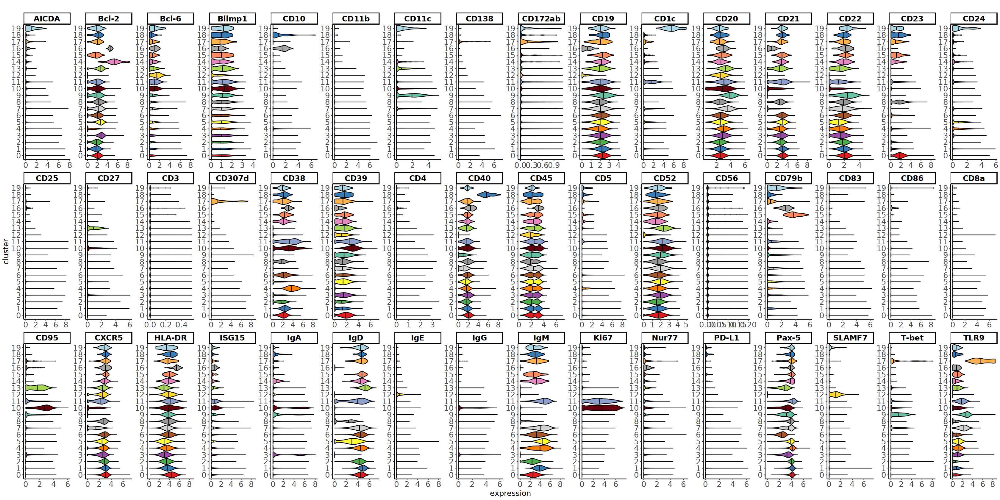

In [25]:
# Expression of markers representing clusters
options(repr.plot.height = 14, repr.plot.width = 28)
suppressWarnings({
  as.data.frame(ph_markers_data_arcsinh[,markers]) %>%
    dplyr::mutate(cluster = umap_res$res_cell) %>%
    dplyr::mutate(cluster = factor(cluster,levels=unique(umap_res$res_cell)[order(as.numeric(unique(umap_res$res_cell)))])) %>%
    tidyr::pivot_longer(!cluster) %>%
    magrittr::set_colnames(c("cluster","protein","expression")) %>%
    dplyr::mutate(protein = gsub("\\.","-",protein)) %>% 
    ggplot(.,aes(x=cluster, y=expression, fill = cluster)) + 
    geom_violin(color = "black", aes(fill = cluster), scale = "width", draw_quantiles = c(0.5)) +
    facet_wrap(protein ~ ., scales = "free" , nrow = 3) +
    theme_classic() +
    coord_flip() +
    scale_fill_manual(values = c(
    "0" = "#E41A1C",
    "1" = "#377EB8",
    "2" = "#4DAF4A",
    "3" = "#984EA3",
    "4" = "#FF7F00",
    "5" = "#FFFF33",
    "6" = "#A65628",
    "7" = "lightgrey",
    "8" = "#999999",
    "9" = "#66C2A5",
    "10" = "#67000D",
    "11" = "#8DA0CB",
    "12" = "#FFD92F",
    "13" = "#A6D854",
    "14" = "#E78AC3",
    "15" = "#FC8D62",
    "16" = "darkgrey",
    "17" = "#FEB24C",
    "18" = "#377EB8",
    "19" = "lightblue",
    "20" = "#FDE0EF",
    "21" = "#B8E186",
    "22" = "#66C2A5",
    "23" = "#A6D855",
    "24" = "#E78AC4",
    "25" = "#FC8D63",
    "26" = "brown",
    "27" = "#FEB25C",
    "28" = "#377EB9",
    "29" = "lightgreen",
    "30" = "#FDE1EF"
  )) +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "",
         x = "cluster",
         y = "expression") 
})

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


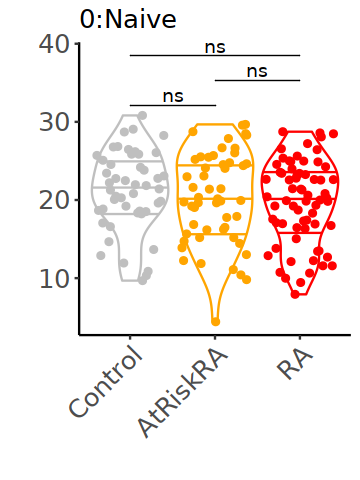

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


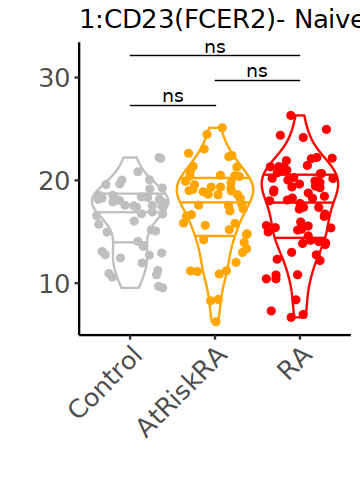

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


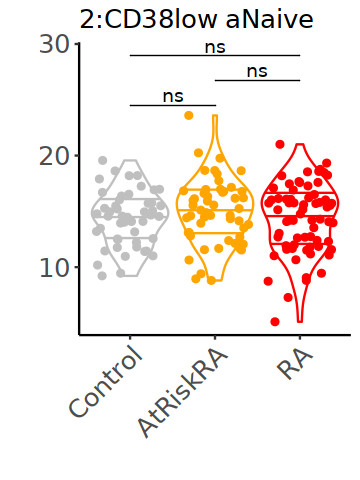

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


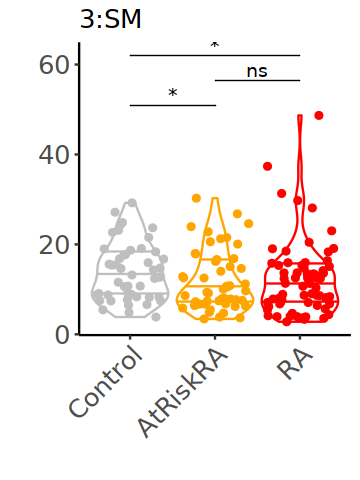

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


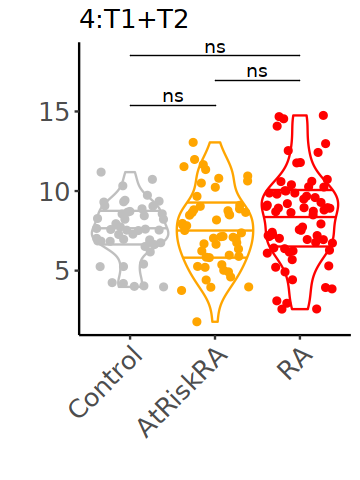

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


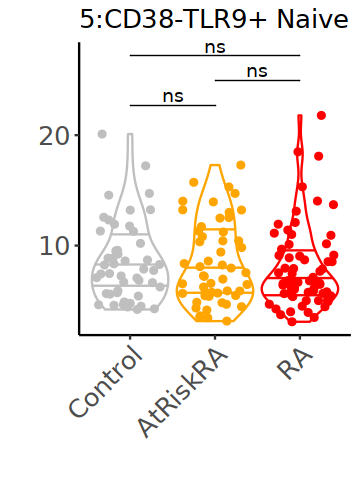

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


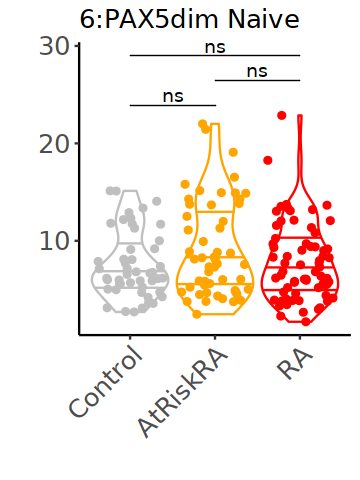

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


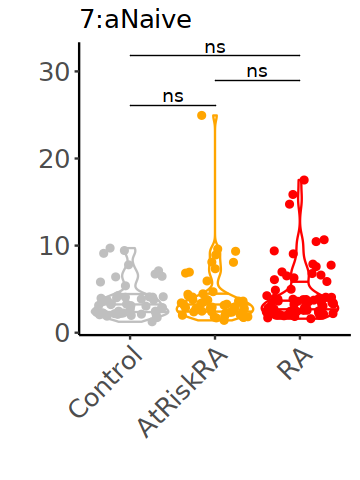

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


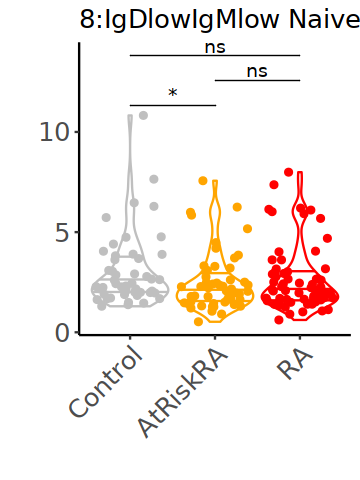

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


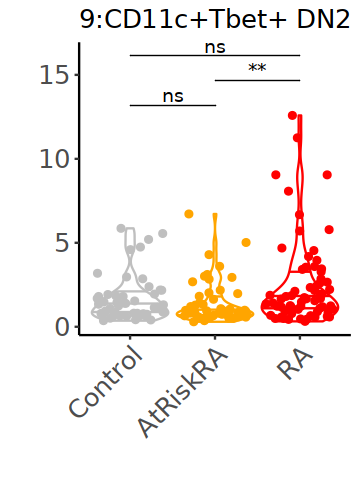

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


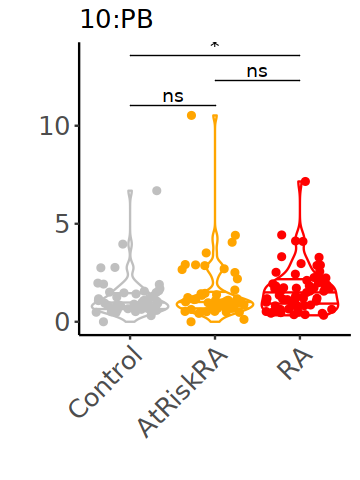

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


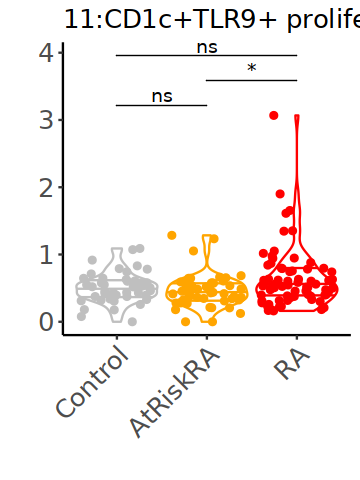

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


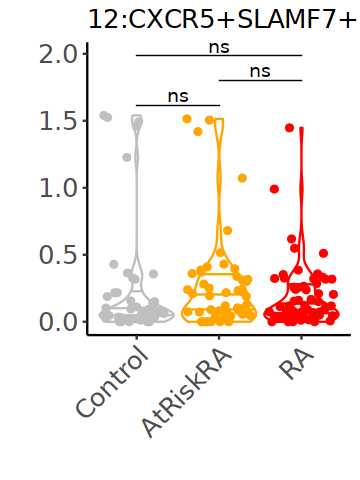

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


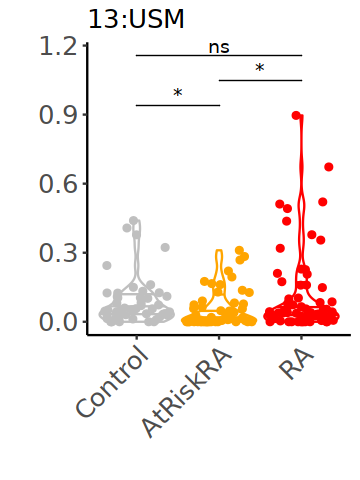

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


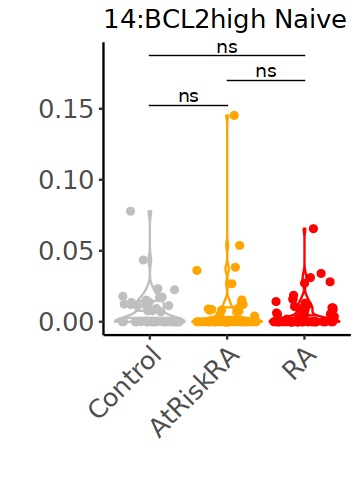

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


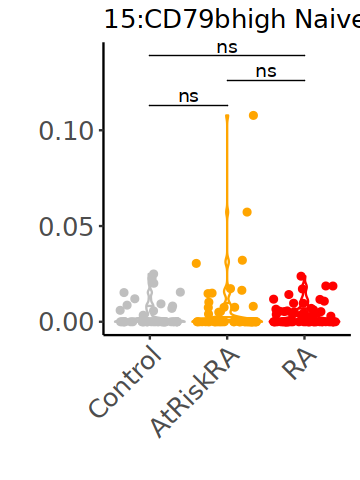

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


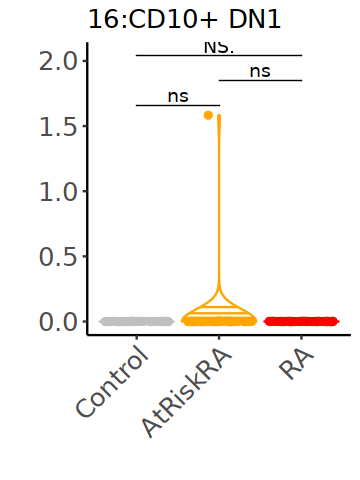

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


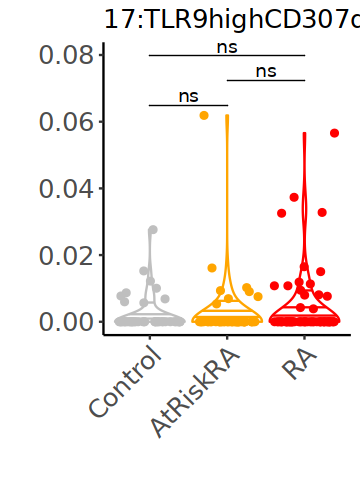

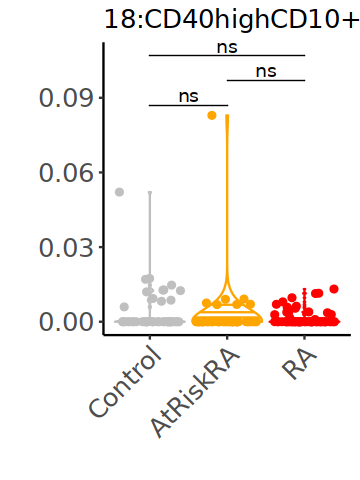

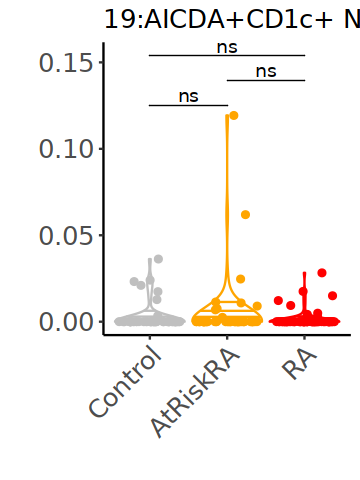

In [26]:


options(repr.plot.height = 4, repr.plot.width = 3)

for (clu in unique(umap_res$res_cell)[order(as.integer(unique(umap_res$res_cell)))]){
    
    # For each subject, make rows that says 0 if the cells belonging to each cluster are 0
    tmp = data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
          dplyr::group_by(subject_id,disease,cluster) %>%
          dplyr::summarize(count = dplyr::n()) %>%
          dplyr::ungroup() %>%
          dplyr::group_by(subject_id) %>%
          dplyr::mutate(proportion = 100*count/sum(count)) %>%
          dplyr::filter(cluster==clu) %>%
        dplyr::group_by(disease,cluster) %>%
        dplyr::summarize(count = dplyr::n()) %>%
        dplyr::ungroup()
    for (dis in c("Control","AtRiskRA","RA")){
        if(!(dis %in% tmp$disease)){
            tmp = tmp %>%
                dplyr::add_row(disease = dis, cluster = clu, count = 0)
        }
    }
    tmp = cbind(
        tmp,
        all_count = umap_res %>%
            dplyr::distinct(disease,subject_id) %>%
            dplyr::group_by(disease) %>%
            dplyr::summarize(all_count = dplyr::n()) %>%
            .$all_count
        ) %>%
        dplyr::mutate(diff = all_count-count)
    tmp = rbind(
        data.frame(subject_id = rep("Control",tmp[tmp$disease == "Control",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "Control",]$diff), 
                   count = rep(0,tmp[tmp$disease == "Control",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "Control",]$diff), 
                   disease = rep("Control",tmp[tmp$disease == "Control",]$diff)
                   ),
        data.frame(subject_id = rep("AtRiskRA",tmp[tmp$disease == "AtRiskRA",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   count = rep(0,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   disease = rep("AtRiskRA",tmp[tmp$disease == "AtRiskRA",]$diff)
                   ),
        data.frame(subject_id = rep("RA",tmp[tmp$disease == "RA",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "RA",]$diff), 
                   count = rep(0,tmp[tmp$disease == "RA",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "RA",]$diff), 
                   disease = rep("RA",tmp[tmp$disease == "RA",]$diff)
                   )
        )
    
    plot(
       data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
          dplyr::group_by(subject_id,disease,cluster) %>%
          dplyr::summarize(count = dplyr::n()) %>%
          dplyr::ungroup() %>%
          dplyr::group_by(subject_id) %>%
          dplyr::mutate(proportion = 100*count/sum(count)) %>%
          dplyr::filter(cluster==clu) %>%
          rbind(.,tmp) %>%
          dplyr::mutate(disease = factor(disease,levels = c("Control", "AtRiskRA", "RA"))) %>%
          ggplot(., aes(x = disease, y=proportion, fill = cluster)) + 
          geom_violin(aes(color = disease), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
          geom_jitter(aes(fill = disease, color = disease)) +
          ggpubr::stat_compare_means(
            comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
            label = "p.signif",
            tip.length = 0
            ) +
          scale_fill_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
          scale_color_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
          theme_classic() +
          theme(strip.text.x=element_text(size=15, color="black", face="bold"),
                strip.text.y=element_text(size=15, color="black", face="bold"),
                legend.position = "none",
                plot.title = element_text(size=15),
                axis.title.x = element_text(size=15),
                axis.title.y = element_text(size =15),
                axis.text.y = element_text(size = 15),
                axis.text.x = element_text(size = 15, angle = 45, hjust=1),
                legend.text =  element_text(size = 15),
                legend.key.size = grid::unit(0.5, "lines"),
                legend.title = element_text(size = 0.8, hjust = 0)) +
          labs(title = paste(clu,unique(cluster_df[cluster_df$cluster==clu,]$clu_name),sep=":"),
               x = "",
               y = "") 

            )
}





`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


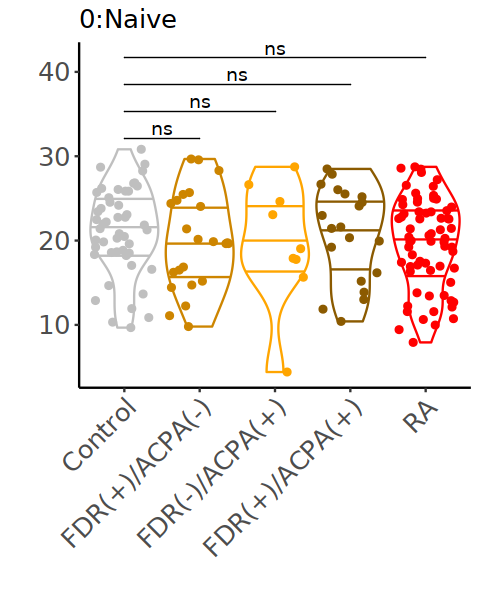

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


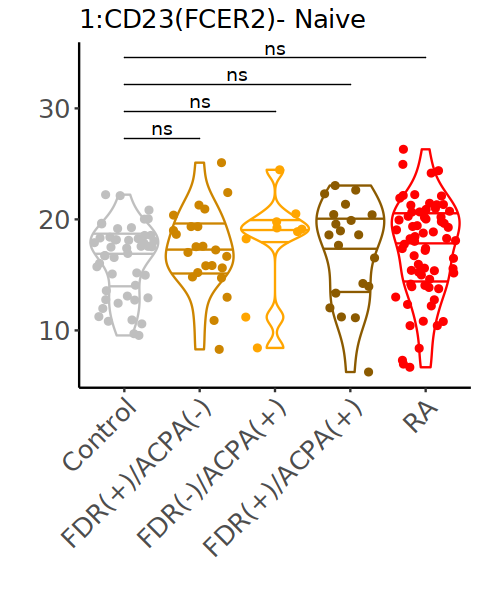

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


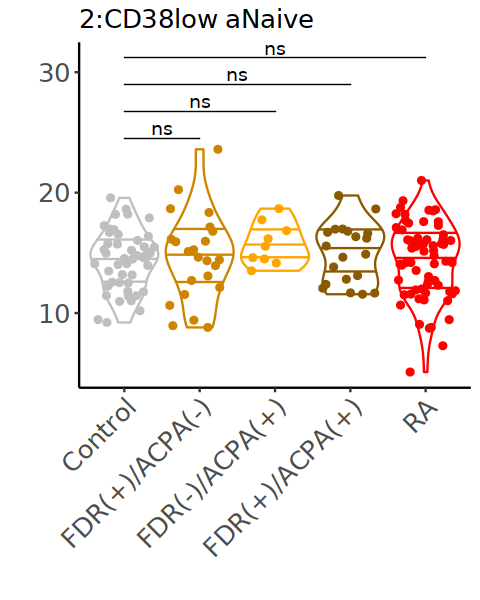

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


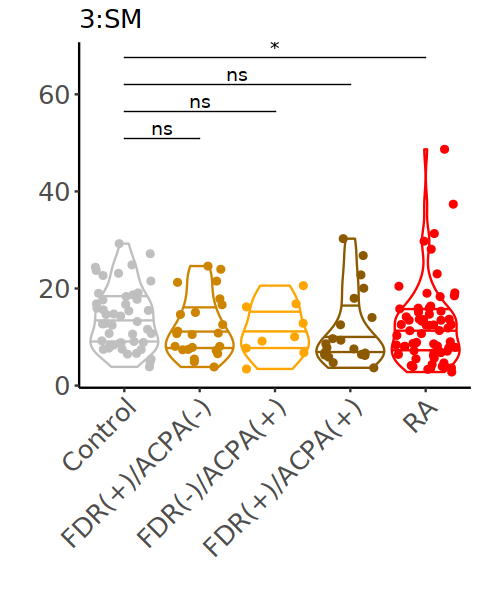

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


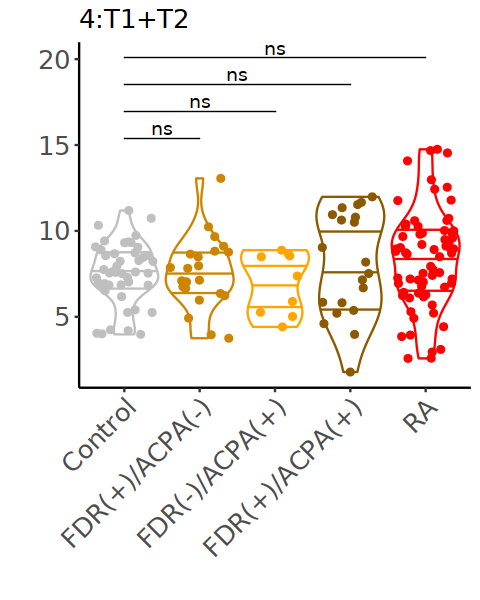

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


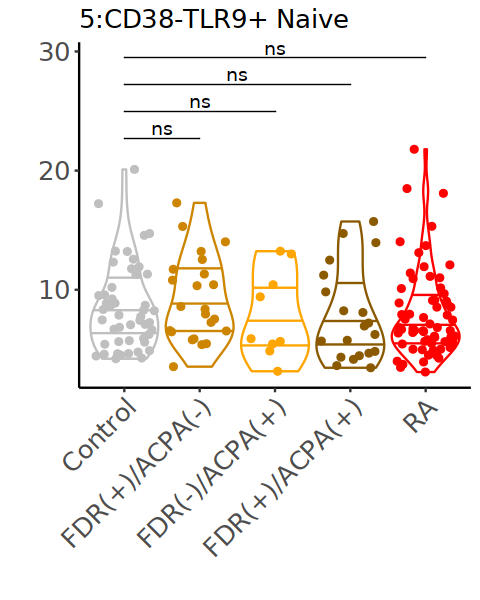

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


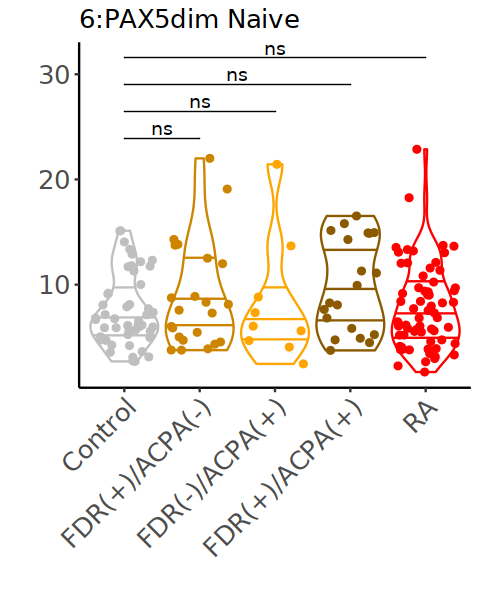

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


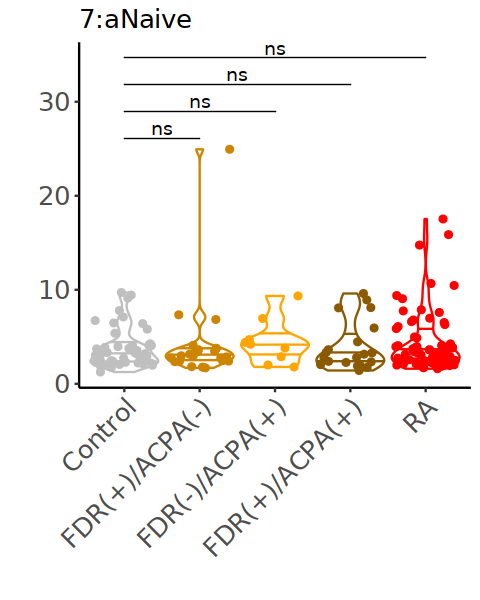

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


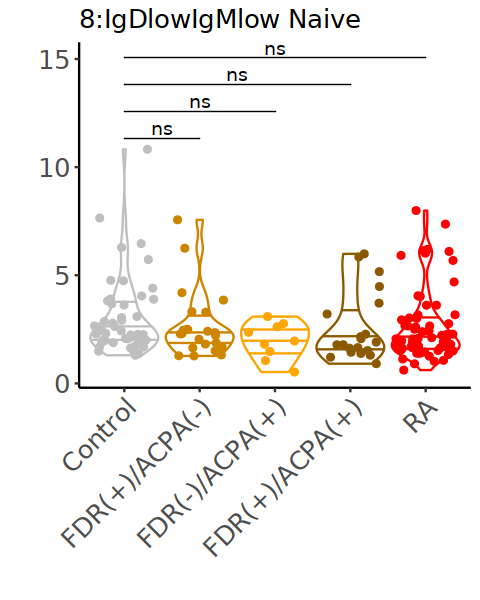

Warning message in wilcox.test.default(c(1.90577831986583, 0.312672429648703, 1.49161449880207, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


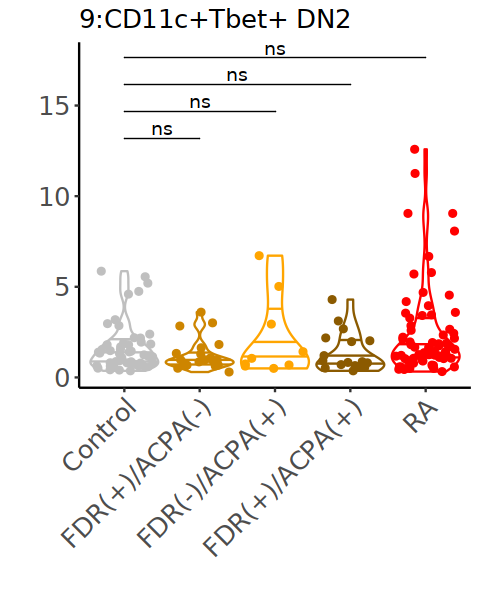

Warning message in wilcox.test.default(c(0.32017075773746, 0.781681074121758, 0.548728649818379, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.32017075773746, 0.781681074121758, 0.548728649818379, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


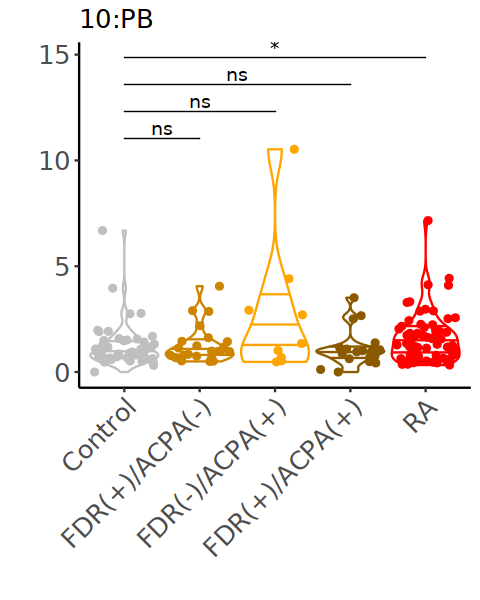

Warning message in wilcox.test.default(c(1.53986888245159, 0.0618285802612258, 0.150424411733104, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.53986888245159, 0.0618285802612258, 0.150424411733104, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.53986888245159, 0.0618285802612258, 0.150424411733104, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


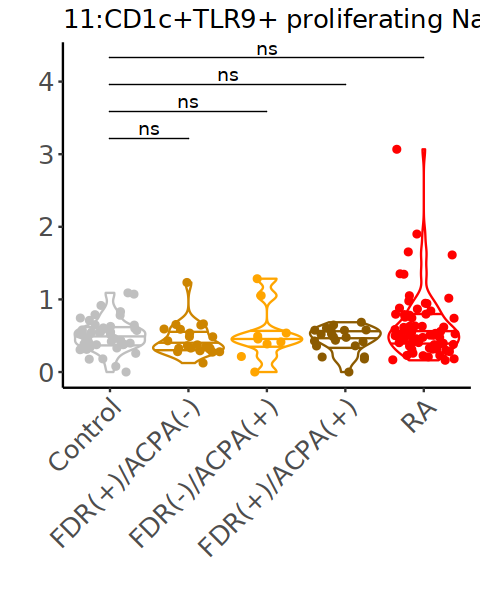

Warning message in wilcox.test.default(c(0.0304924531178533, 0.0463714351959193, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0304924531178533, 0.0463714351959193, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0304924531178533, 0.0463714351959193, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


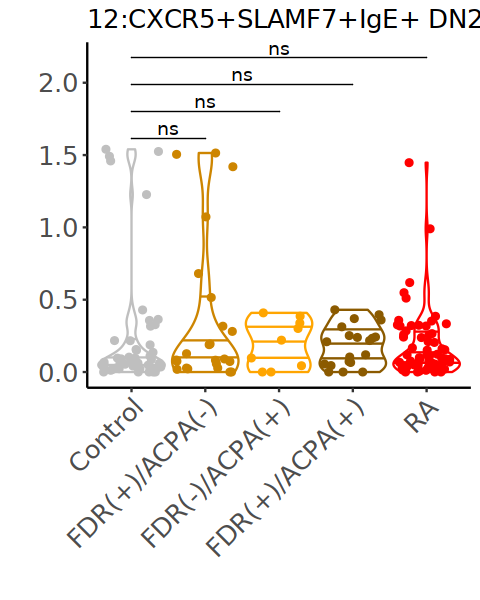

Warning message in wilcox.test.default(c(0.0152462265589267, 0.00772857253265322, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0152462265589267, 0.00772857253265322, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0152462265589267, 0.00772857253265322, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


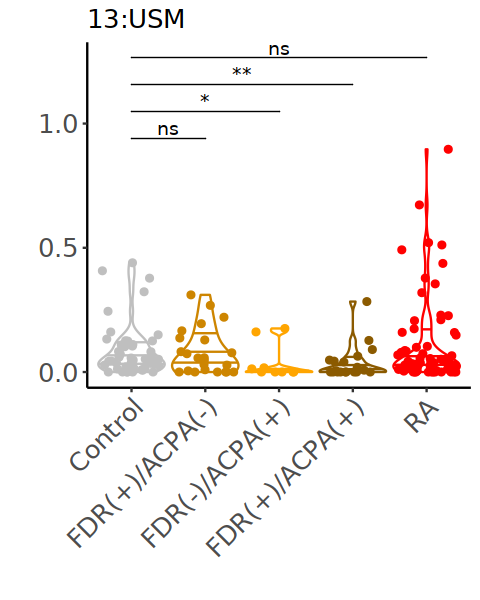

Warning message in wilcox.test.default(c(0.0152462265589267, 0.00868055555555556, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0152462265589267, 0.00868055555555556, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0152462265589267, 0.00868055555555556, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


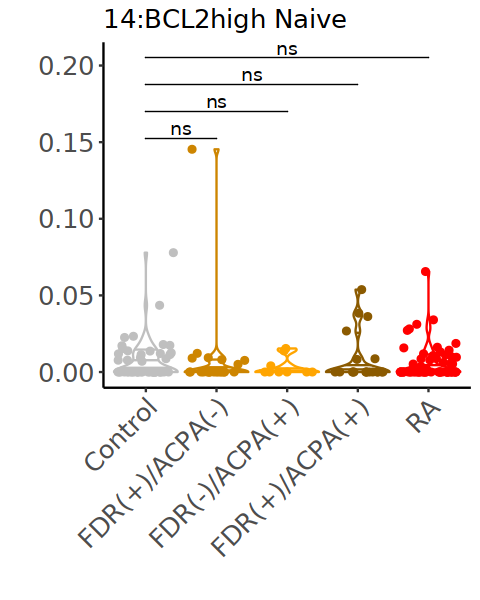

Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


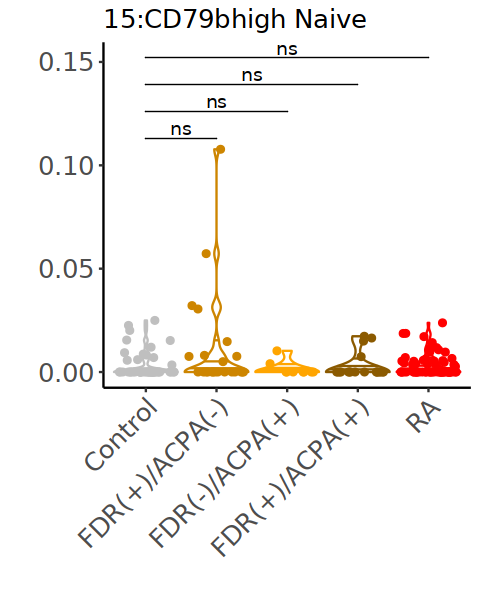

Warning message in wilcox.test.default(c(0.0152462265589267, 0.00772857253265322, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0152462265589267, 0.00772857253265322, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0152462265589267, 0.00772857253265322, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


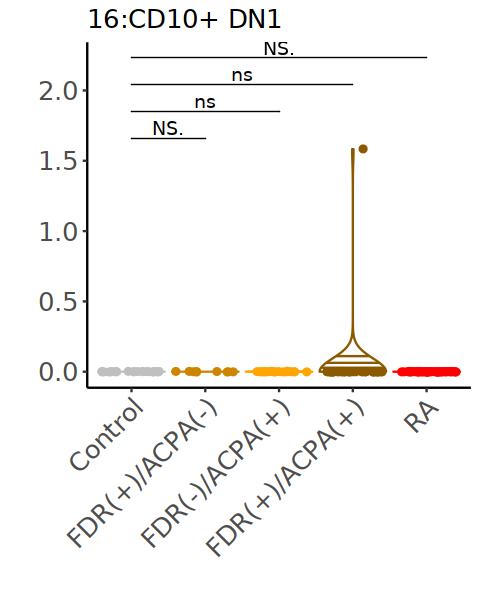

Warning message in wilcox.test.default(c(0.0128008192524322, 0.00868055555555556, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0128008192524322, 0.00868055555555556, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0128008192524322, 0.00868055555555556, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


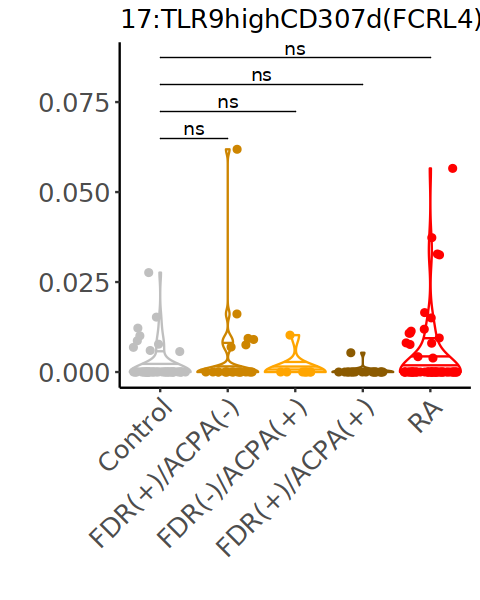

Warning message in wilcox.test.default(c(0.0128008192524322, 0.0362231345085728, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0128008192524322, 0.0362231345085728, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0128008192524322, 0.0362231345085728, :
“cannot compute exact p-value with ties”


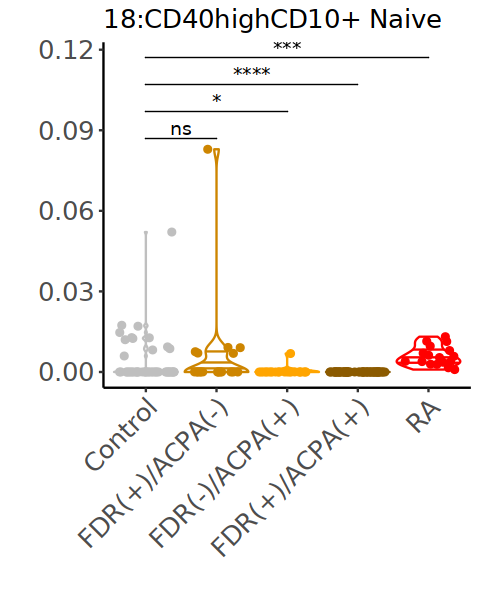

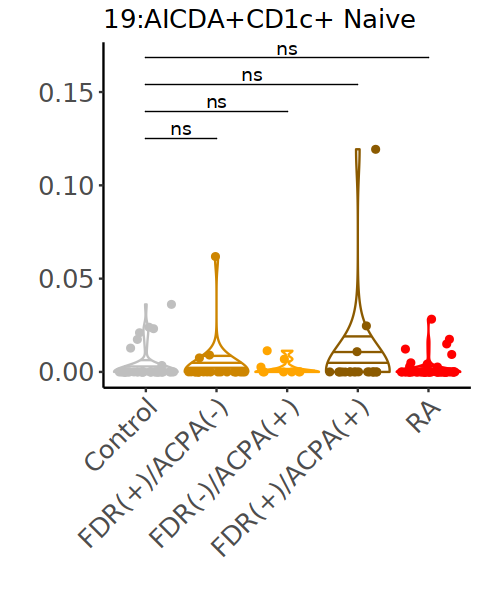

In [27]:

options(repr.plot.height = 5, repr.plot.width = 4)

for (clu in unique(umap_res$res_cell)[order(as.integer(unique(umap_res$res_cell)))]){
    
    # For each subject, make rows that says 0 if the cells belonging to each cluster are 0
  tmp = data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, AtRisk = umap_res$AtRisk) %>%
    dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
    dplyr::group_by(subject_id,AtRisk,cluster) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(subject_id) %>%
    dplyr::mutate(proportion = 100*count/sum(count)) %>%
    dplyr::filter(cluster==clu) %>%
    dplyr::group_by(AtRisk,cluster) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::ungroup() %>%
    dplyr::arrange(AtRisk)
  for (dis in c("Control","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA")){
    if(!(dis %in% tmp$AtRisk)){
      tmp = tmp %>%
        dplyr::add_row(AtRisk = dis, cluster = clu, count = 0)
    }
  }
  tmp = cbind(
    tmp,
    all_count = umap_res %>%
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::distinct(AtRisk,subject_id) %>%
      dplyr::group_by(AtRisk) %>%
      dplyr::summarize(all_count = dplyr::n()) %>%
      .$all_count
  ) %>%
    dplyr::mutate(diff = all_count-count)
  
  tmp = rbind(
    data.frame(subject_id = rep("Control",tmp[tmp$AtRisk == "Control",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "Control",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "Control",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "Control",]$diff), 
               AtRisk = rep("Control",tmp[tmp$AtRisk == "Control",]$diff)
    ),
    data.frame(subject_id = rep("FDR(+)/ACPA(-)",tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               AtRisk = rep("FDR(+)/ACPA(-)",tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff)
    ),
    data.frame(subject_id = rep("FDR(-)/ACPA(+)",tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               AtRisk = rep("FDR(-)/ACPA(+)",tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff)
    ),
    data.frame(subject_id = rep("FDR(+)/ACPA(+)",tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               AtRisk = rep("FDR(+)/ACPA(+)",tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff)
    ),
    data.frame(subject_id = rep("RA",ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               cluster = rep(clu,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               count = rep(0,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               proportion = rep(0,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)),  
               AtRisk = rep("RA",ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0))
    )
  )
  
  plot(
    data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, AtRisk = umap_res$AtRisk) %>%
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::group_by(subject_id,AtRisk,cluster) %>%
      dplyr::summarize(count = dplyr::n()) %>%
      dplyr::ungroup() %>%
      dplyr::group_by(subject_id) %>%
      dplyr::mutate(proportion = 100*count/sum(count)) %>%
      dplyr::filter(cluster==clu) %>%
      rbind(.,tmp) %>%
      dplyr::mutate(AtRisk = factor(AtRisk,levels=c("Control","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))) %>%
      ggplot(., aes(x = AtRisk, y=proportion, fill = cluster)) + 
      geom_violin(aes(color = AtRisk), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
      geom_jitter(aes(fill = AtRisk, color = AtRisk)) +
      ggpubr::stat_compare_means(
        comparisons = list(c("Control", "FDR(+)/ACPA(-)"), c("Control", "FDR(-)/ACPA(+)"), c("Control", "FDR(+)/ACPA(+)"), c("Control", "RA")), 
        label = "p.signif",
        tip.length = 0
      ) +
      scale_fill_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) +
      scale_color_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) + 
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
            strip.text.y=element_text(size=15, color="black", face="bold"),
            legend.position = "none",
            plot.title = element_text(size=15),
            axis.title.x = element_text(size=15),
            axis.title.y = element_text(size =15),
            axis.text.y = element_text(size = 15),
            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
            legend.text =  element_text(size = 15),
            legend.key.size = grid::unit(0.5, "lines"),
            legend.title = element_text(size = 0.8, hjust = 0)) +
      labs(title = paste(clu,unique(cluster_df[cluster_df$cluster==clu,]$clu_name),sep=":"),,
           x = "",
           y = "") 
    
  )
}



[1] "AICDA"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00282
2 AtRiskRA  0.00317
3 RA        0.00372


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "Bcl-2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.36
2 AtRiskRA   1.33
3 RA         1.33


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "Bcl-6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.356
2 AtRiskRA  0.530
3 RA        0.598


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


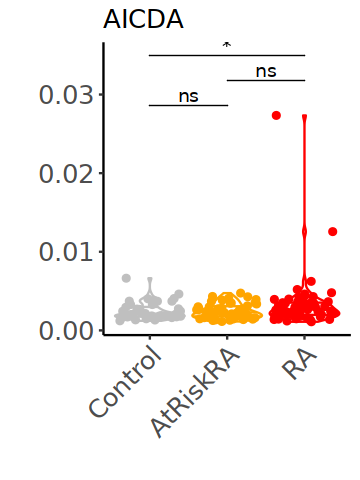

[1] "Blimp1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.998
2 AtRiskRA  0.980
3 RA        0.942


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


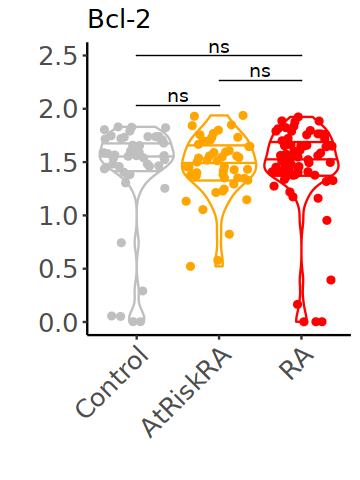

[1] "CD10"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000959
2 AtRiskRA  0.00104 
3 RA        0.000946


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


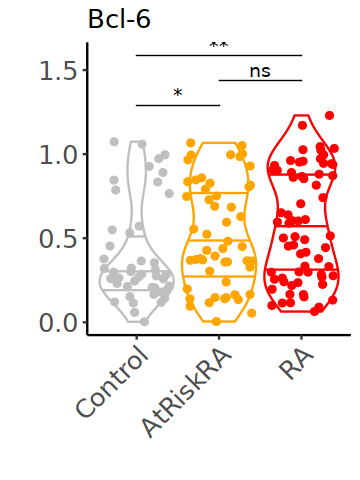

[1] "CD11b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000994
2 AtRiskRA  0.00105 
3 RA        0.00121 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


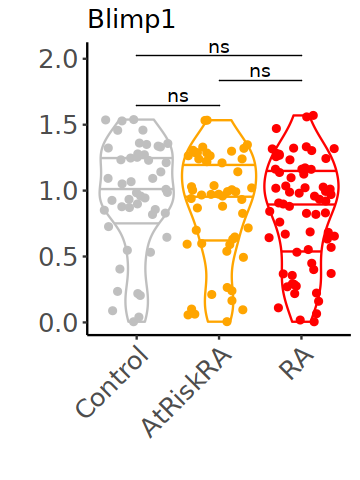

[1] "CD11c"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00157
2 AtRiskRA  0.00146
3 RA        0.00173


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


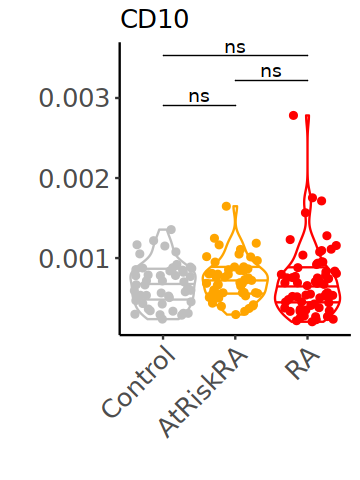

[1] "CD138"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000656
2 AtRiskRA  0.000818
3 RA        0.000763


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


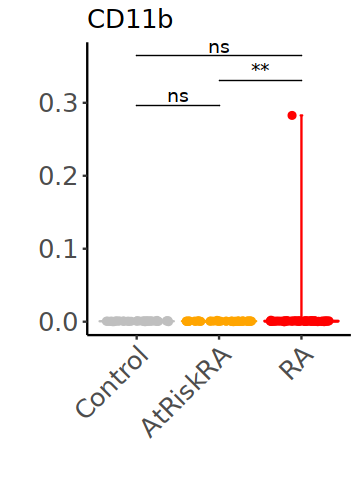

[1] "CD172ab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00215
2 AtRiskRA  0.00436
3 RA        0.00152


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


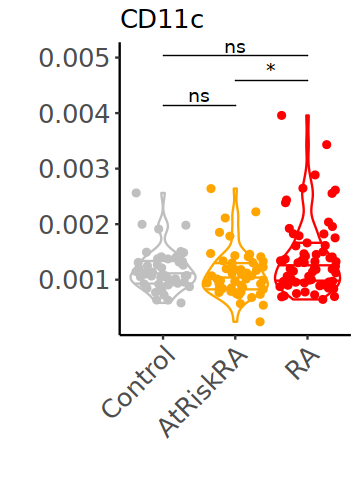

[1] "CD19"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.37
2 AtRiskRA   1.40
3 RA         1.40


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


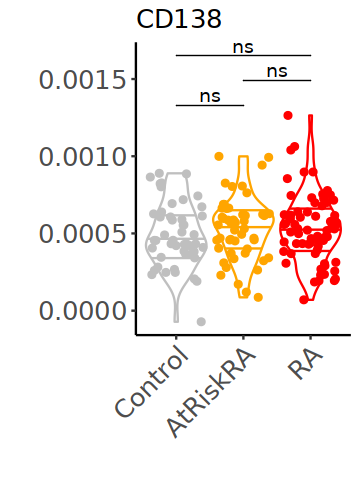

[1] "CD1c"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00374
2 AtRiskRA  0.00470
3 RA        0.00546


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


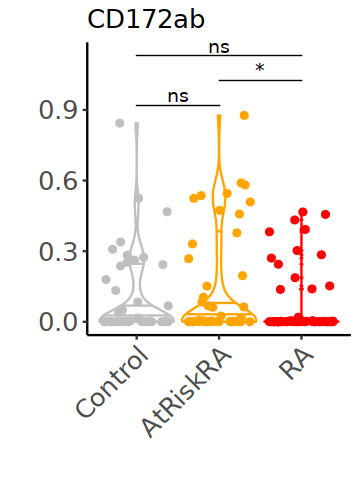

[1] "CD20"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.51
2 AtRiskRA   1.49
3 RA         1.54


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


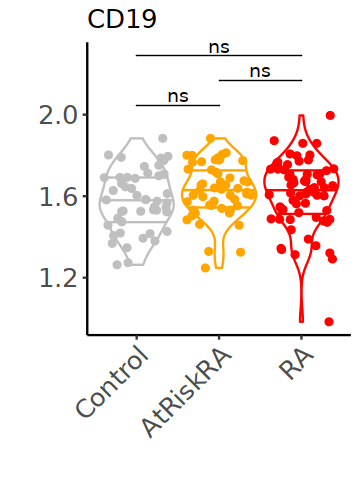

[1] "CD21"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.55
2 AtRiskRA   1.57
3 RA         1.54


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


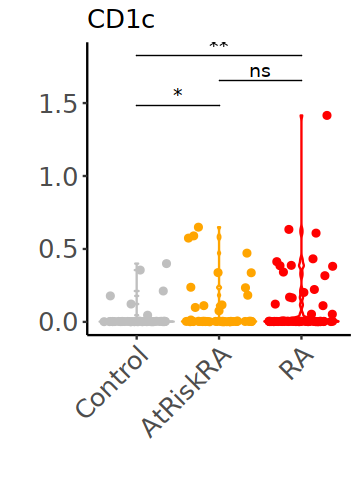

[1] "CD22"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.23
2 AtRiskRA   1.30
3 RA         1.33


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


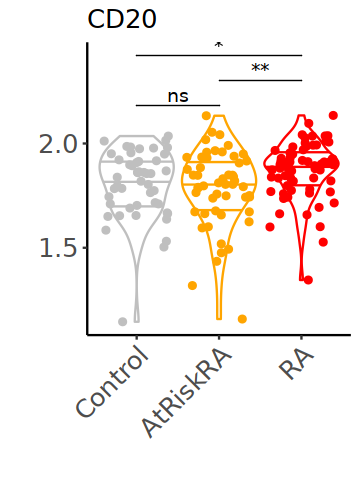

[1] "CD23"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.454
2 AtRiskRA  0.438
3 RA        0.335


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


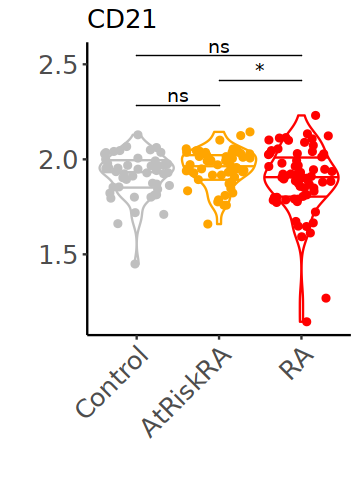

[1] "CD24"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.0305 
2 AtRiskRA  0.00615
3 RA        0.00837


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


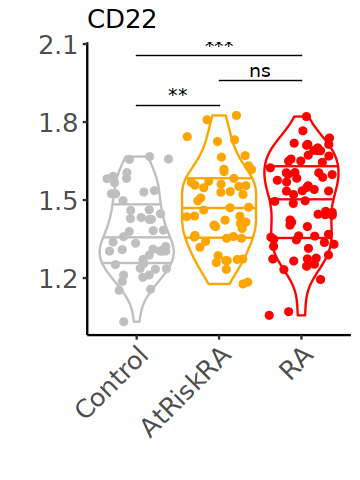

[1] "CD25"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000942
2 AtRiskRA  0.000898
3 RA        0.000896


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


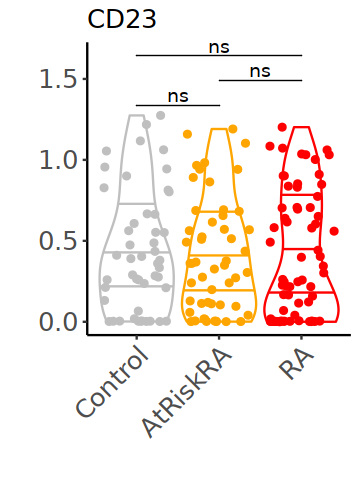

[1] "CD27"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00135
2 AtRiskRA  0.00122
3 RA        0.00119


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


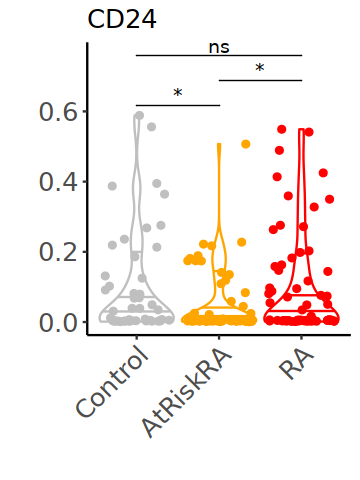

[1] "CD3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000641
2 AtRiskRA  0.000671
3 RA        0.000607


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


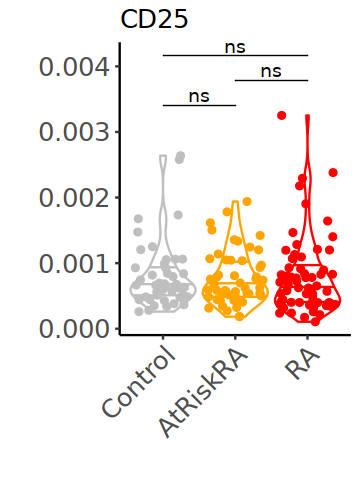

[1] "CD307d"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000326
2 AtRiskRA  0.000327
3 RA        0.000372


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


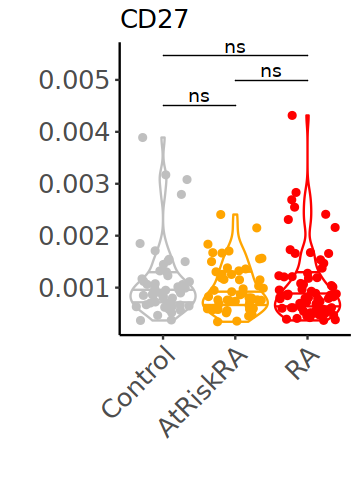

[1] "CD38"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.32
2 AtRiskRA   1.36
3 RA         1.28


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


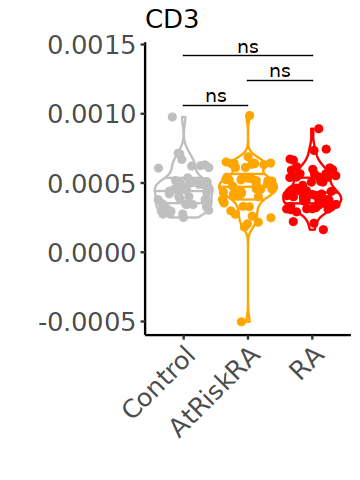

[1] "CD39"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.07
2 AtRiskRA   1.16
3 RA         1.14


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


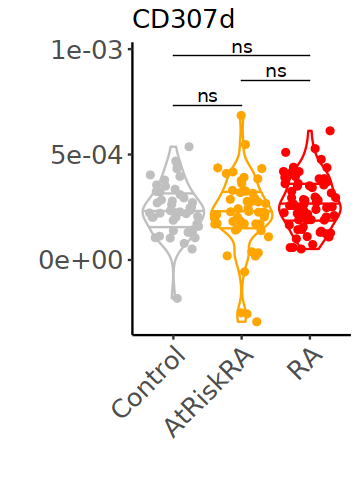

[1] "CD4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00112
2 AtRiskRA  0.00115
3 RA        0.00123


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


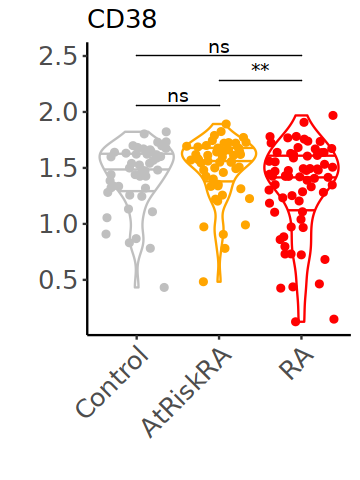

[1] "CD40"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.26
2 AtRiskRA   1.30
3 RA         1.30


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


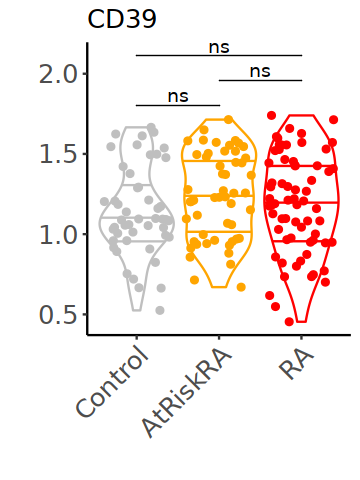

[1] "CD45"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.33
2 AtRiskRA   1.39
3 RA         1.50


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


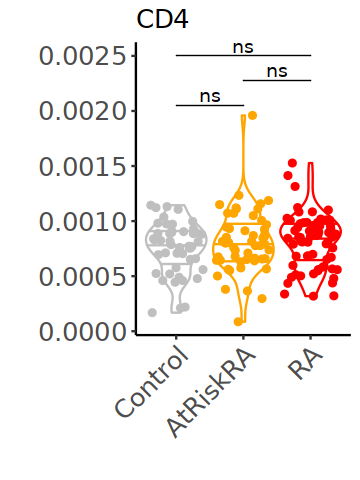

[1] "CD5"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00407
2 AtRiskRA  0.00376
3 RA        0.00408


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


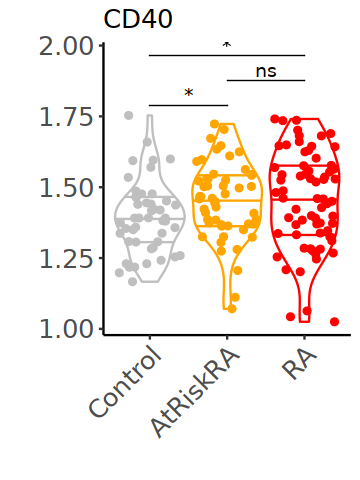

[1] "CD52"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.32
2 AtRiskRA   1.30
3 RA         1.29


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


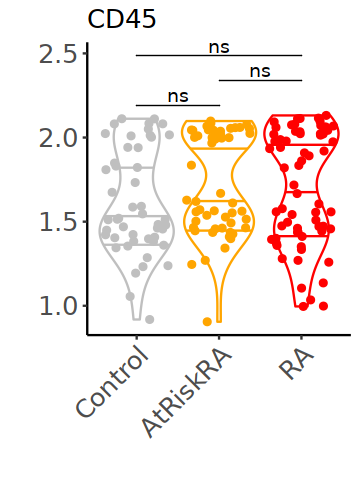

[1] "CD56"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000557
2 AtRiskRA  0.000581
3 RA        0.000551


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


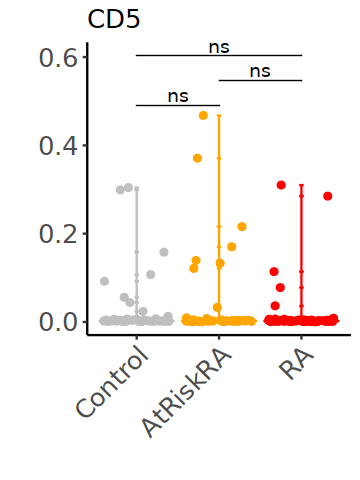

[1] "CD79b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.240
2 AtRiskRA  0.237
3 RA        0.395


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


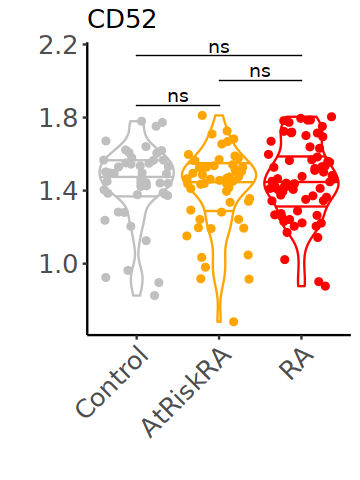

[1] "CD83"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000222
2 AtRiskRA  0.000270
3 RA        0.000277


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


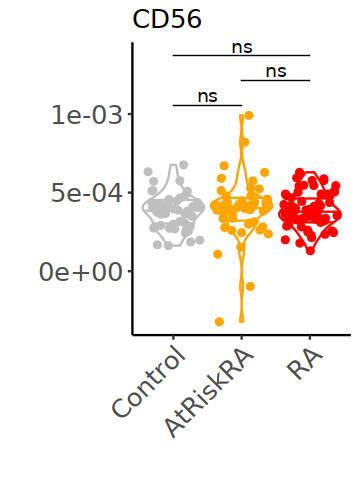

[1] "CD86"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000255
2 AtRiskRA  0.000319
3 RA        0.000322


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


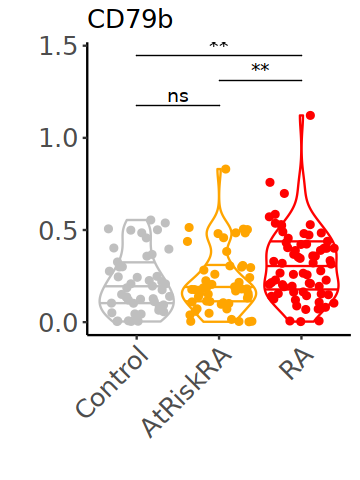

[1] "CD8a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00165
2 AtRiskRA  0.00195
3 RA        0.00134


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


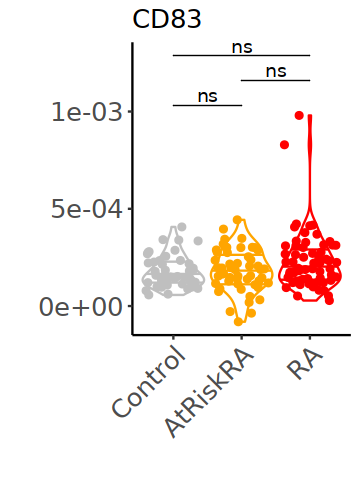

[1] "CD95"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00215
2 AtRiskRA  0.00218
3 RA        0.00280


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


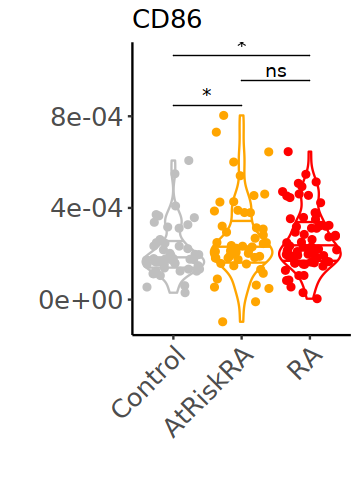

[1] "CXCR5"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.52
2 AtRiskRA   1.55
3 RA         1.53


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


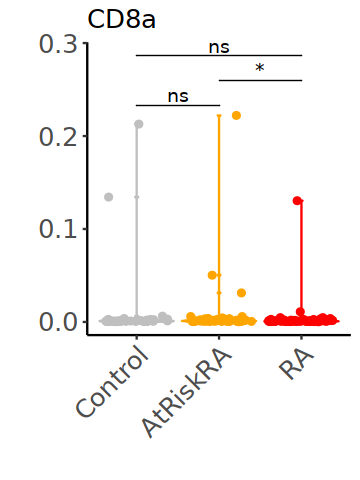

[1] "HLA-DR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.68
2 AtRiskRA   1.68
3 RA         1.69


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


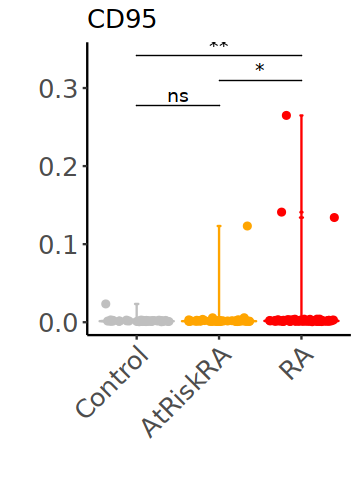

[1] "ISG15"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.320
2 AtRiskRA  0.385
3 RA        0.480


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


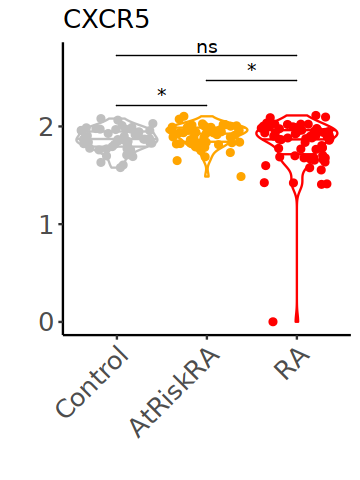

[1] "IgA"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00523
2 AtRiskRA  0.00407
3 RA        0.156  


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


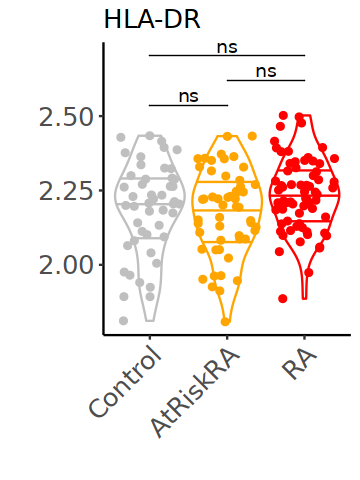

[1] "IgD"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.73
2 AtRiskRA   1.75
3 RA         1.76


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


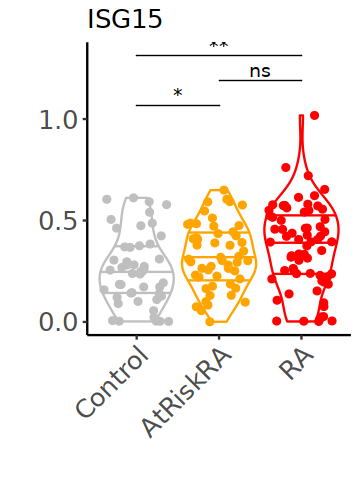

[1] "IgE"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000833
2 AtRiskRA  0.000844
3 RA        0.000861


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


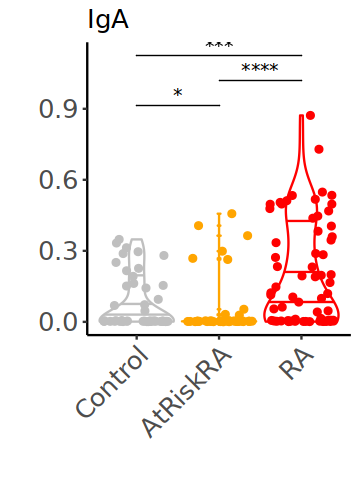

[1] "IgG"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00115
2 AtRiskRA  0.00115
3 RA        0.00137


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


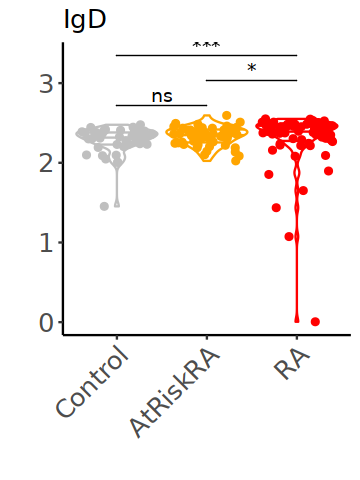

[1] "IgM"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.53
2 AtRiskRA   1.55
3 RA         1.59


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


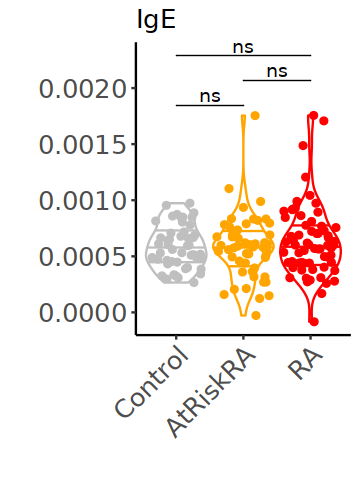

[1] "Ki67"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00228
2 AtRiskRA  0.00230
3 RA        0.00229


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


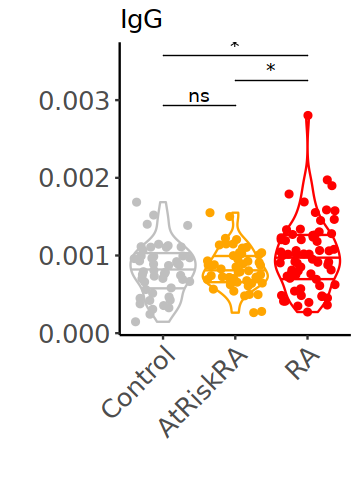

[1] "Nur77"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00470
2 AtRiskRA  0.00572
3 RA        0.0520 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


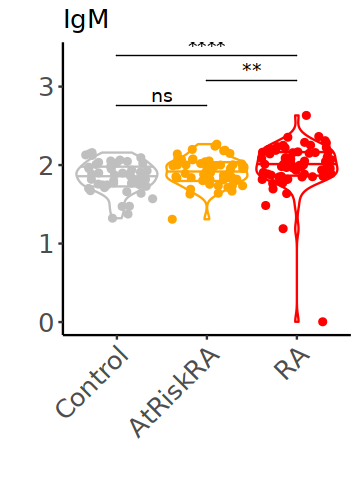

[1] "PD-L1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00344
2 AtRiskRA  0.00280
3 RA        0.00291


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


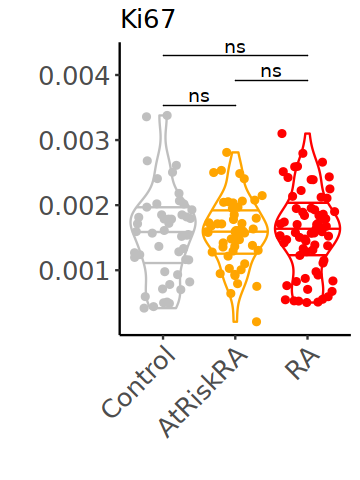

[1] "Pax-5"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.70
2 AtRiskRA   1.72
3 RA         1.72


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


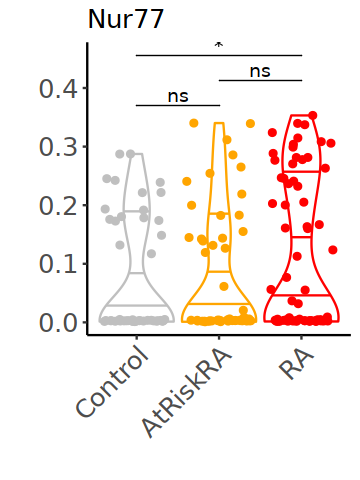

[1] "SLAMF7"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000290
2 AtRiskRA  0.000334
3 RA        0.000342


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


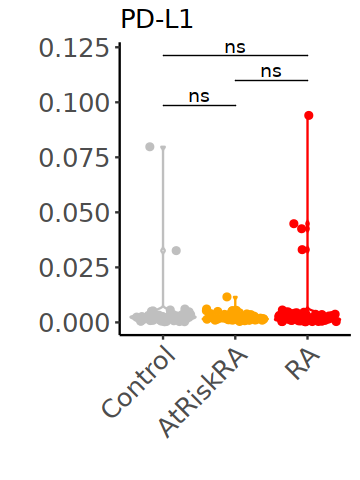

[1] "T-bet"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00153
2 AtRiskRA  0.00171
3 RA        0.00181


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


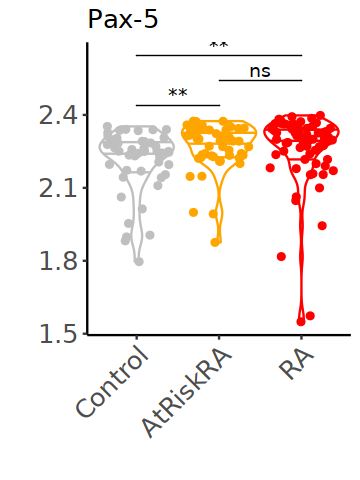

[1] "TLR9"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.837
2 AtRiskRA  0.869
3 RA        0.885


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


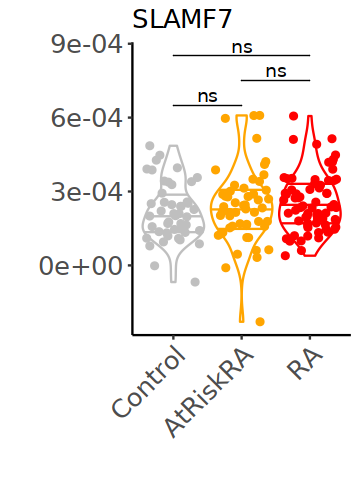

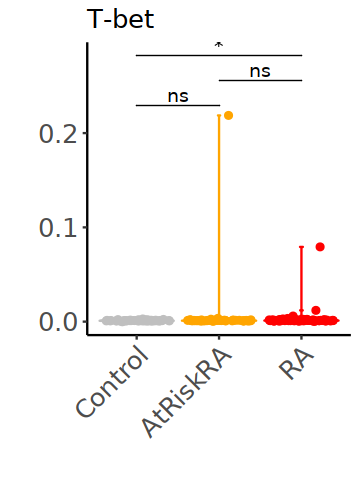

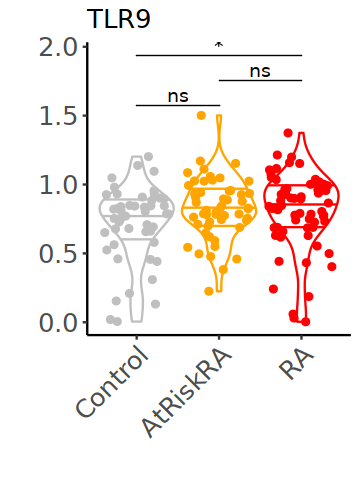

In [28]:
ph_markers_data_arcsinh = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/arcsinh_transformed_Prop",prop,"_Nmin",n_min,".rds"))
ph_markers_data_arcsinh = ph_markers_data_arcsinh[clu_logi,]
ph_markers_data_arcsinh = as.data.frame(ph_markers_data_arcsinh)

markers = c('AICDA','Bcl-2','Bcl-6','Blimp1','CD10','CD11b','CD11c','CD138','CD172ab','CD19','CD1c','CD20','CD21','CD22','CD23','CD24','CD25','CD27','CD3','CD307d','CD38','CD39','CD4','CD40','CD45','CD5','CD52','CD56','CD79b','CD83','CD86','CD8a','CD95','CXCR5','HLA-DR','ISG15','IgA','IgD','IgE','IgG','IgM','Ki67','Nur77','PD-L1','Pax-5','SLAMF7','T-bet','TLR9')
options(repr.plot.height = 4, repr.plot.width = 3)
for (gene in markers){
    print(gene)
    
    data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, condition = umap_res$disease) %>% 
        dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
        dplyr::group_by(subject_id, condition) %>%
        dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
        dplyr::ungroup() %>%
        dplyr::group_by(condition) %>%
        dplyr::summarize(med = quantile(log2(med+1), probs = c(0.5))) %>% print()
    plot(
        data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, condition = umap_res$disease) %>% 
            dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
            dplyr::group_by(subject_id, condition) %>%
            dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
            ggplot(., aes(x = condition, y=med, fill = condition, color = condition)) + 
                      geom_violin(aes(color = condition), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
                      geom_jitter(aes(fill = condition, color = condition)) +
                      ggpubr::stat_compare_means(
                        comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
                        label = "p.signif",
                        tip.length = 0
                        ) +
                      scale_fill_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
                      scale_color_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
                      theme_classic() +
                      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
                            strip.text.y=element_text(size=15, color="black", face="bold"),
                            legend.position = "none",
                            plot.title = element_text(size=15),
                            axis.title.x = element_text(size=15),
                            axis.title.y = element_text(size =15),
                            axis.text.y = element_text(size = 15),
                            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
                            legend.text =  element_text(size = 15),
                            legend.key.size = grid::unit(0.5, "lines"),
                            legend.title = element_text(size = 0.8, hjust = 0)) +
                      labs(title = gene,
                           x = "",
                           y = "") 
         )

}



[1] "AICDA"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00282
2 FDR(+)/ACPA(+) 0.00322
3 FDR(+)/ACPA(-) 0.00289
4 FDR(-)/ACPA(+) 0.00347
5 RA             0.00372


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "Bcl-2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.36
2 FDR(+)/ACPA(+)  1.27
3 FDR(+)/ACPA(-)  1.35
4 FDR(-)/ACPA(+)  1.30
5 RA              1.33


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "Bcl-6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.356
2 FDR(+)/ACPA(+) 0.552
3 FDR(+)/ACPA(-) 0.453
4 FDR(-)/ACPA(+) 0.808
5 RA             0.598


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


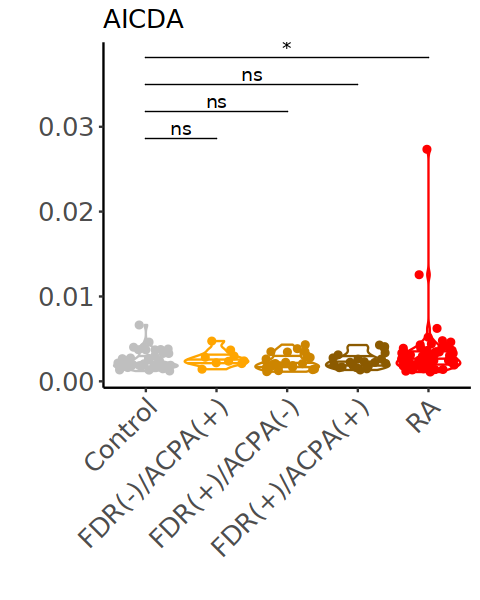

[1] "Blimp1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.998
2 FDR(+)/ACPA(+) 0.967
3 FDR(+)/ACPA(-) 0.994
4 FDR(-)/ACPA(+) 0.976
5 RA             0.942


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


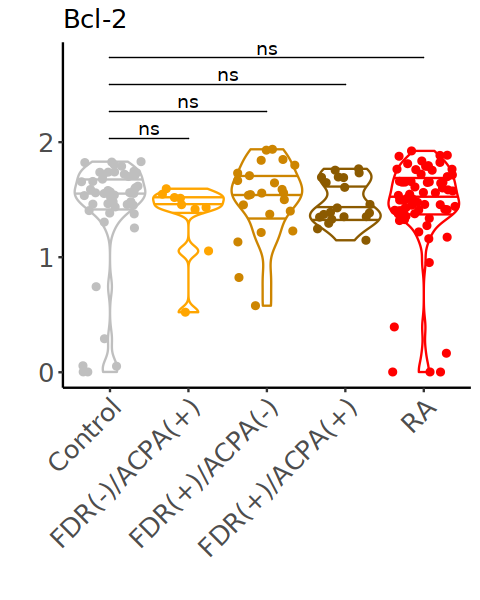

[1] "CD10"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000959
2 FDR(+)/ACPA(+) 0.00109 
3 FDR(+)/ACPA(-) 0.000988
4 FDR(-)/ACPA(+) 0.000955
5 RA             0.000946


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


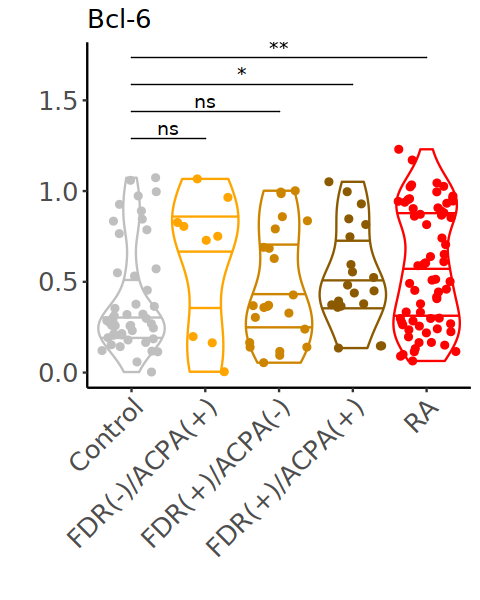

[1] "CD11b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000994
2 FDR(+)/ACPA(+) 0.000946
3 FDR(+)/ACPA(-) 0.00107 
4 FDR(-)/ACPA(+) 0.00106 
5 RA             0.00121 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


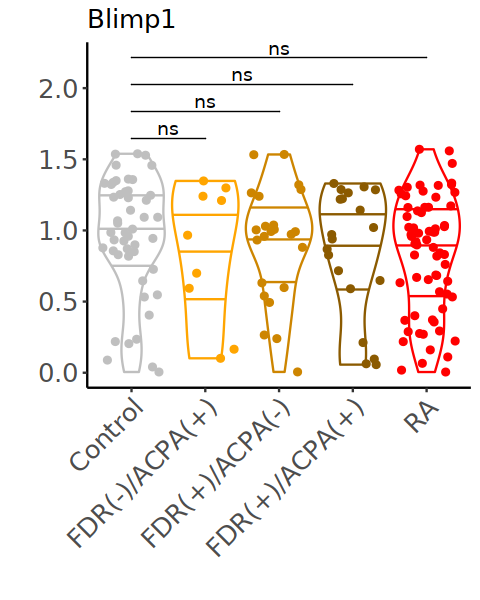

[1] "CD11c"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00157
2 FDR(+)/ACPA(+) 0.00158
3 FDR(+)/ACPA(-) 0.00143
4 FDR(-)/ACPA(+) 0.00161
5 RA             0.00173


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


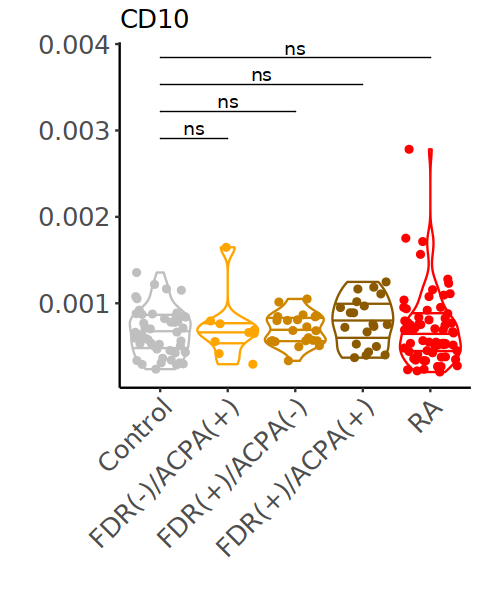

[1] "CD138"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000656
2 FDR(+)/ACPA(+) 0.000818
3 FDR(+)/ACPA(-) 0.000752
4 FDR(-)/ACPA(+) 0.000824
5 RA             0.000763


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


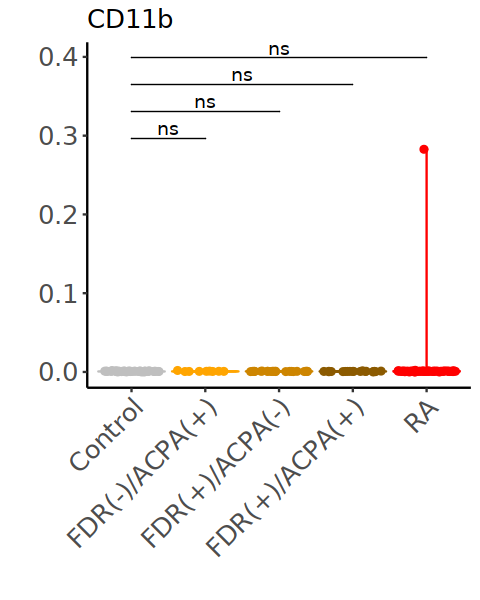

[1] "CD172ab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00215
2 FDR(+)/ACPA(+) 0.00436
3 FDR(+)/ACPA(-) 0.00141
4 FDR(-)/ACPA(+) 0.258  
5 RA             0.00152


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


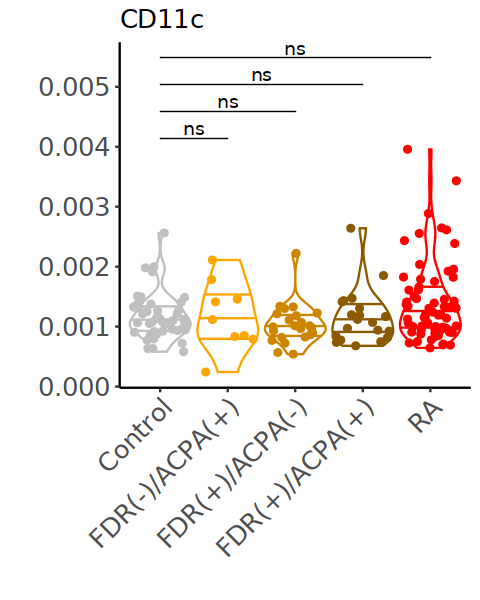

[1] "CD19"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.37
2 FDR(+)/ACPA(+)  1.39
3 FDR(+)/ACPA(-)  1.38
4 FDR(-)/ACPA(+)  1.41
5 RA              1.40


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


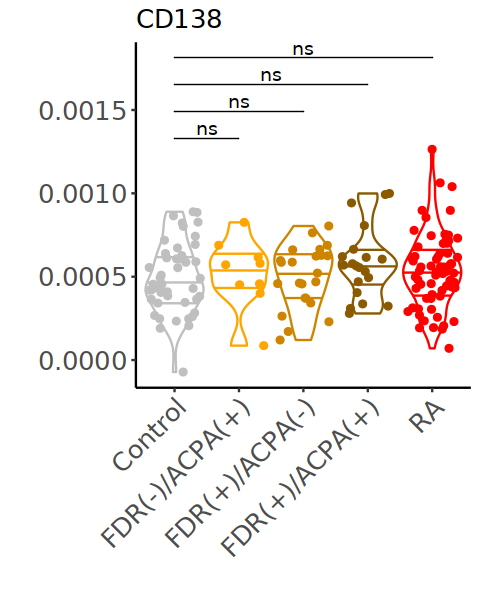

[1] "CD1c"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00374
2 FDR(+)/ACPA(+) 0.00470
3 FDR(+)/ACPA(-) 0.00457
4 FDR(-)/ACPA(+) 0.00789
5 RA             0.00546


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


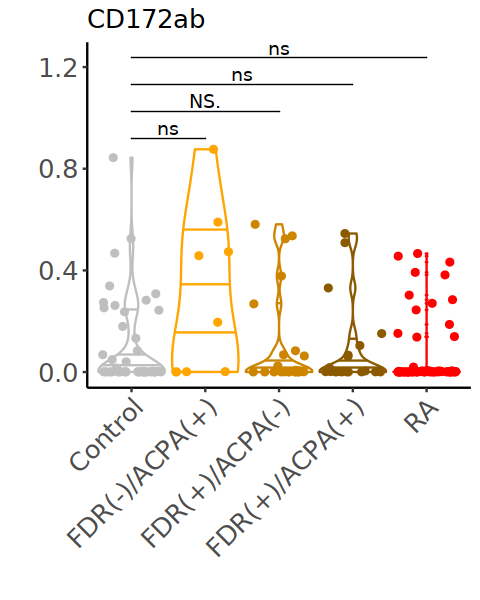

[1] "CD20"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.51
2 FDR(+)/ACPA(+)  1.48
3 FDR(+)/ACPA(-)  1.49
4 FDR(-)/ACPA(+)  1.51
5 RA              1.54


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


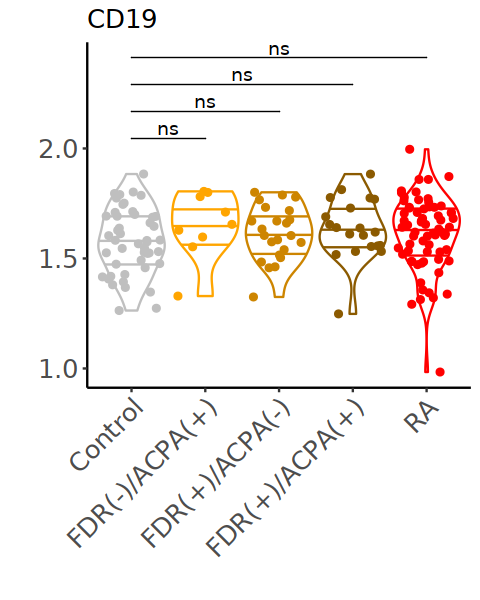

[1] "CD21"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.55
2 FDR(+)/ACPA(+)  1.57
3 FDR(+)/ACPA(-)  1.56
4 FDR(-)/ACPA(+)  1.59
5 RA              1.54


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


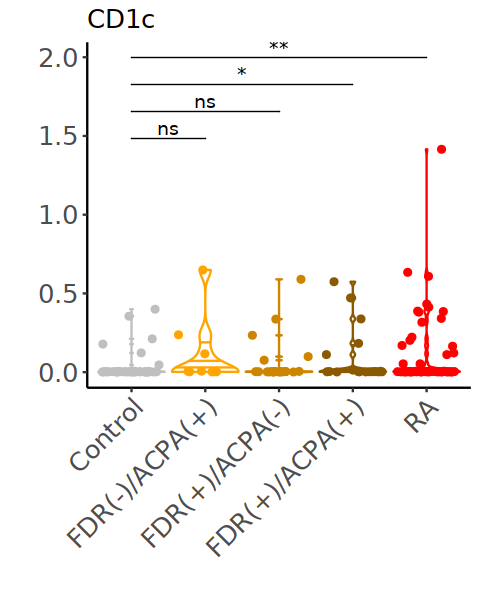

[1] "CD22"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.23
2 FDR(+)/ACPA(+)  1.29
3 FDR(+)/ACPA(-)  1.30
4 FDR(-)/ACPA(+)  1.32
5 RA              1.33


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


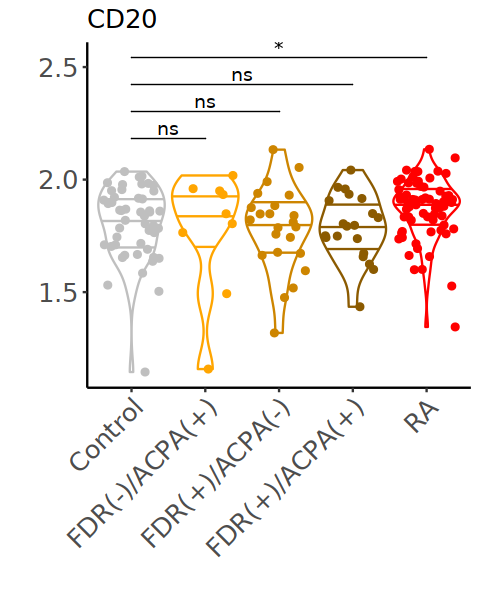

[1] "CD23"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.454
2 FDR(+)/ACPA(+) 0.492
3 FDR(+)/ACPA(-) 0.347
4 FDR(-)/ACPA(+) 0.407
5 RA             0.335


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


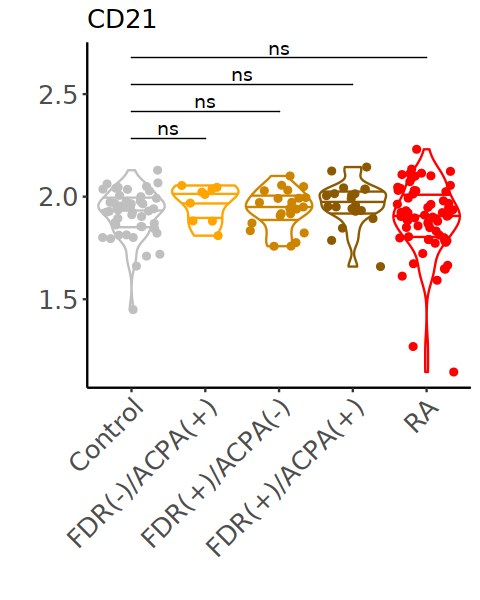

[1] "CD24"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.0305 
2 FDR(+)/ACPA(+) 0.0488 
3 FDR(+)/ACPA(-) 0.00488
4 FDR(-)/ACPA(+) 0.00407
5 RA             0.00837


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


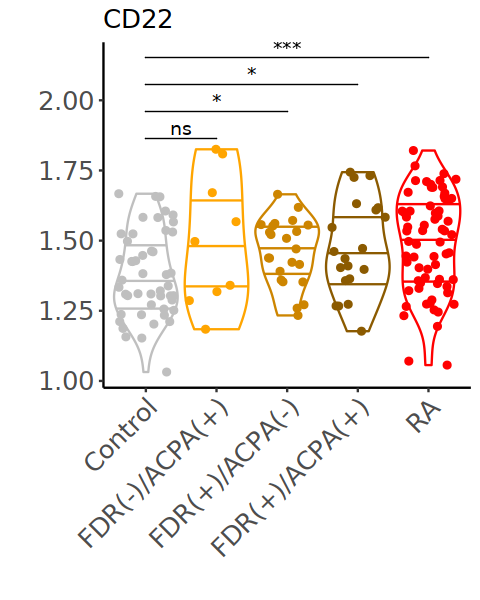

[1] "CD25"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000942
2 FDR(+)/ACPA(+) 0.000942
3 FDR(+)/ACPA(-) 0.000824
4 FDR(-)/ACPA(+) 0.00101 
5 RA             0.000896


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


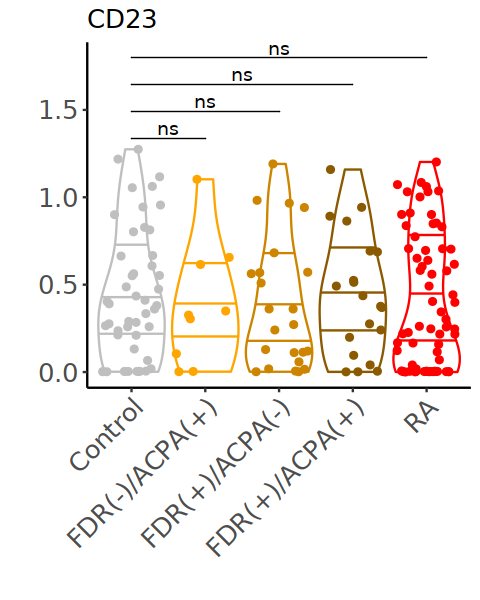

[1] "CD27"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00135
2 FDR(+)/ACPA(+) 0.00108
3 FDR(+)/ACPA(-) 0.00133
4 FDR(-)/ACPA(+) 0.00137
5 RA             0.00119


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


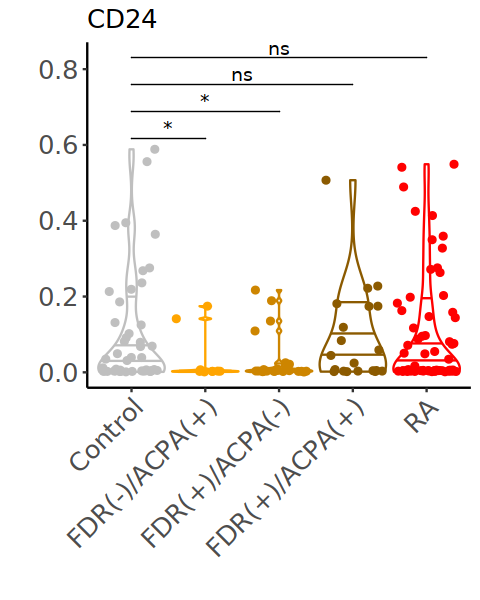

[1] "CD3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000641
2 FDR(+)/ACPA(+) 0.000655
3 FDR(+)/ACPA(-) 0.000747
4 FDR(-)/ACPA(+) 0.000635
5 RA             0.000607


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


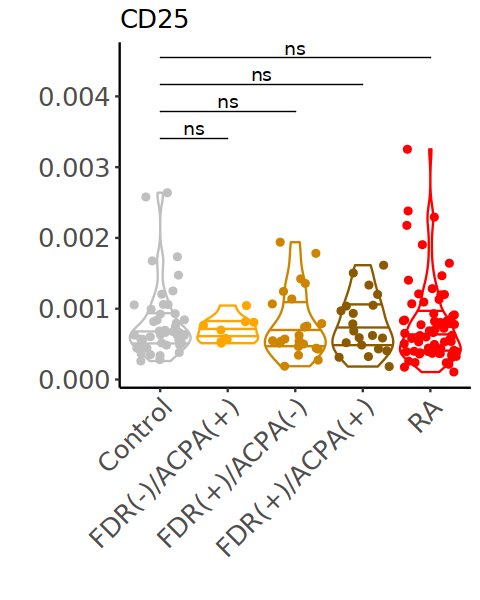

[1] "CD307d"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000326
2 FDR(+)/ACPA(+) 0.000341
3 FDR(+)/ACPA(-) 0.000327
4 FDR(-)/ACPA(+) 0.000248
5 RA             0.000372


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


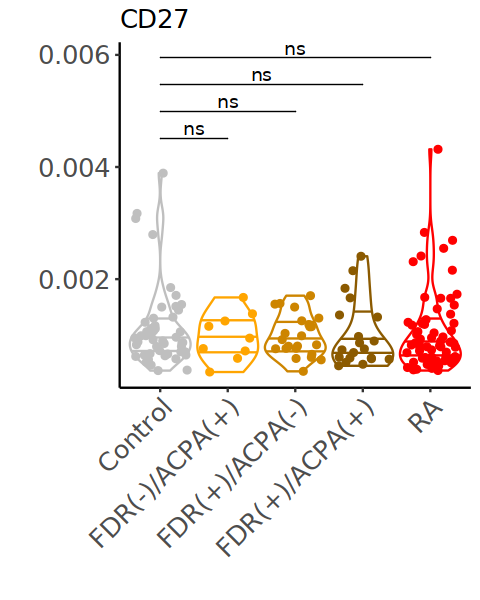

[1] "CD38"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.32
2 FDR(+)/ACPA(+)  1.40
3 FDR(+)/ACPA(-)  1.32
4 FDR(-)/ACPA(+)  1.42
5 RA              1.28


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


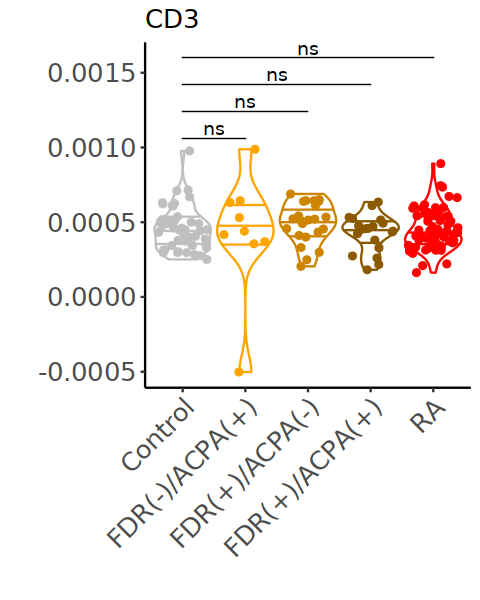

[1] "CD39"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.07
2 FDR(+)/ACPA(+)  1.17
3 FDR(+)/ACPA(-)  1.14
4 FDR(-)/ACPA(+)  1.29
5 RA              1.14


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


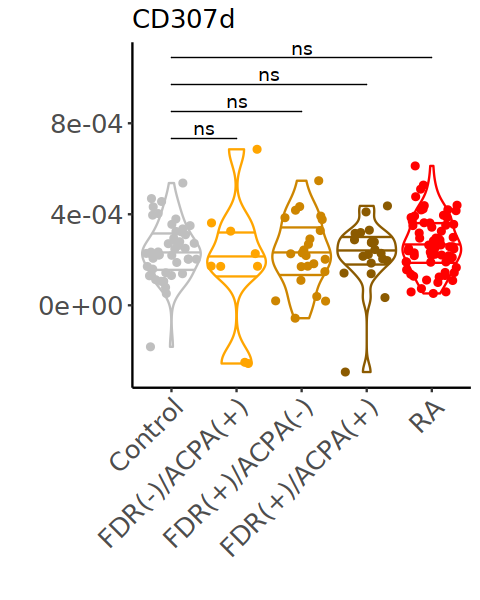

[1] "CD4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00112
2 FDR(+)/ACPA(+) 0.00111
3 FDR(+)/ACPA(-) 0.00116
4 FDR(-)/ACPA(+) 0.00122
5 RA             0.00123


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


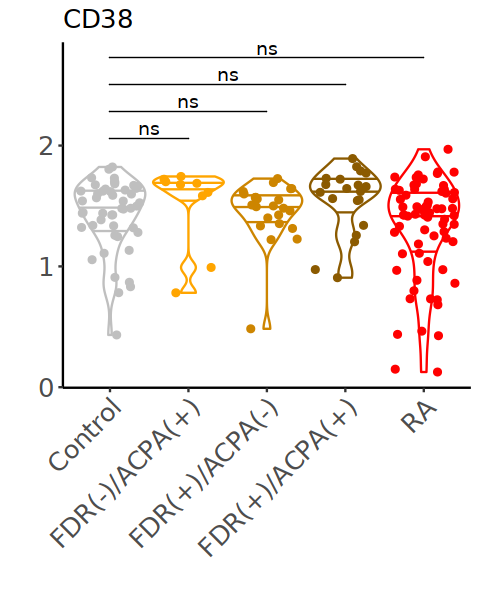

[1] "CD40"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.26
2 FDR(+)/ACPA(+)  1.30
3 FDR(+)/ACPA(-)  1.28
4 FDR(-)/ACPA(+)  1.32
5 RA              1.30


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


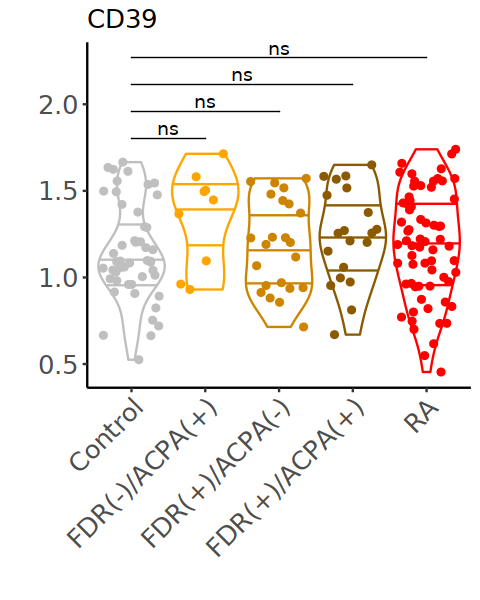

[1] "CD45"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.33
2 FDR(+)/ACPA(+)  1.36
3 FDR(+)/ACPA(-)  1.38
4 FDR(-)/ACPA(+)  1.58
5 RA              1.50


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


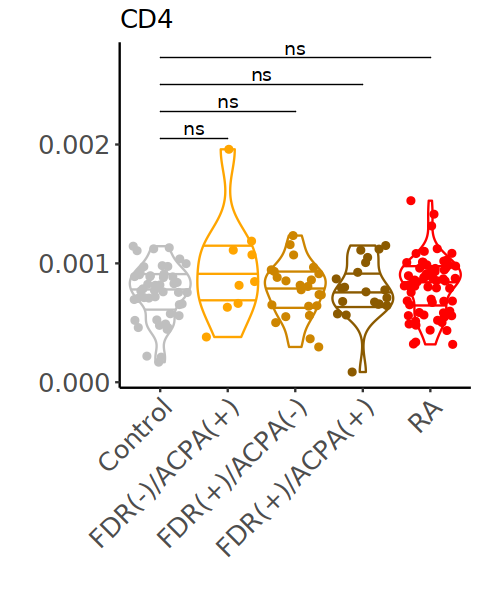

[1] "CD5"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00407
2 FDR(+)/ACPA(+) 0.00424
3 FDR(+)/ACPA(-) 0.00348
4 FDR(-)/ACPA(+) 0.00434
5 RA             0.00408


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


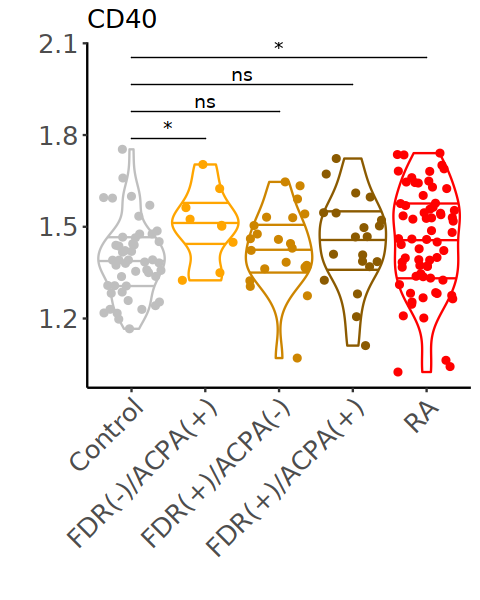

[1] "CD52"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.32
2 FDR(+)/ACPA(+)  1.31
3 FDR(+)/ACPA(-)  1.29
4 FDR(-)/ACPA(+)  1.29
5 RA              1.29


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


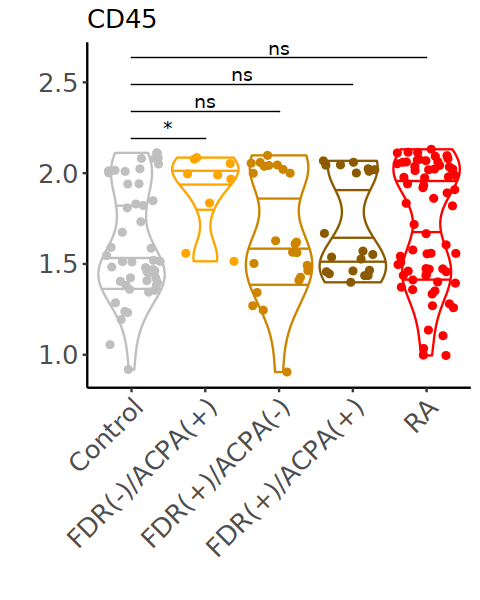

[1] "CD56"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000557
2 FDR(+)/ACPA(+) 0.000611
3 FDR(+)/ACPA(-) 0.000580
4 FDR(-)/ACPA(+) 0.000561
5 RA             0.000551


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


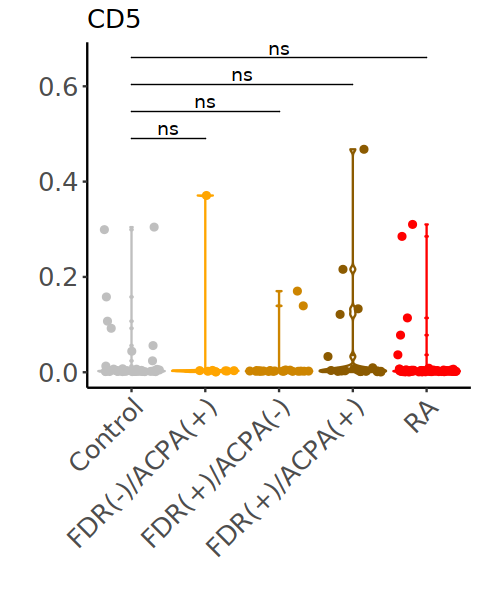

[1] "CD79b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.240
2 FDR(+)/ACPA(+) 0.251
3 FDR(+)/ACPA(-) 0.209
4 FDR(-)/ACPA(+) 0.313
5 RA             0.395


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


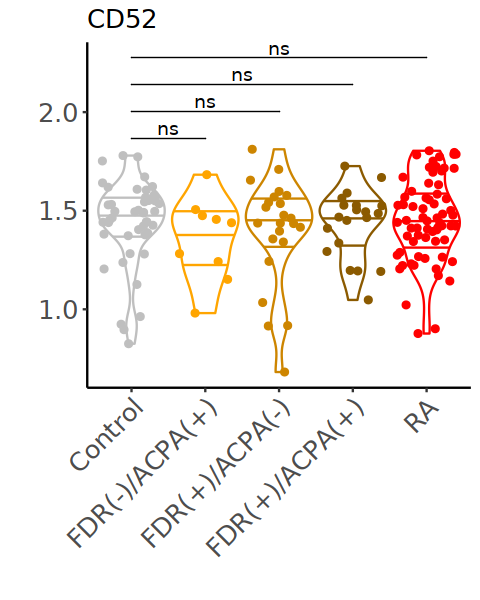

[1] "CD83"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000222
2 FDR(+)/ACPA(+) 0.000278
3 FDR(+)/ACPA(-) 0.000241
4 FDR(-)/ACPA(+) 0.000311
5 RA             0.000277


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


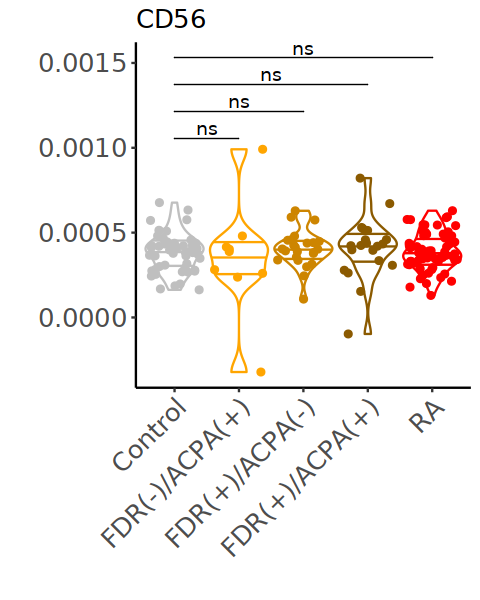

[1] "CD86"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000255
2 FDR(+)/ACPA(+) 0.000308
3 FDR(+)/ACPA(-) 0.000306
4 FDR(-)/ACPA(+) 0.000406
5 RA             0.000322


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


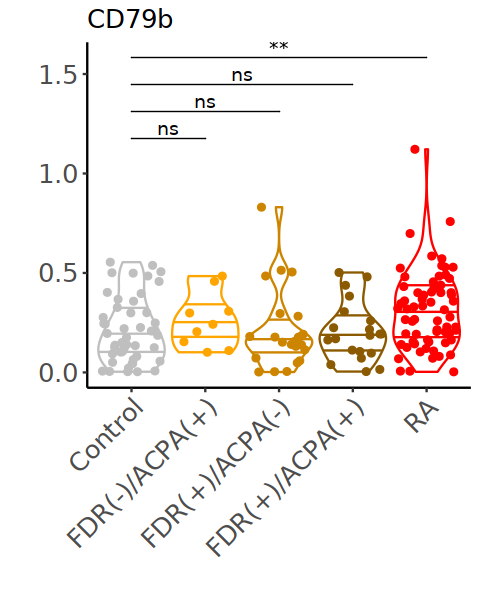

[1] "CD8a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00165
2 FDR(+)/ACPA(+) 0.00193
3 FDR(+)/ACPA(-) 0.00167
4 FDR(-)/ACPA(+) 0.00348
5 RA             0.00134


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


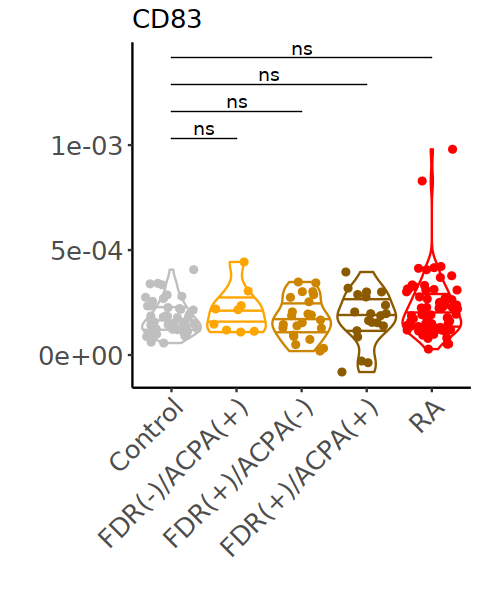

[1] "CD95"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00215
2 FDR(+)/ACPA(+) 0.00221
3 FDR(+)/ACPA(-) 0.00211
4 FDR(-)/ACPA(+) 0.00251
5 RA             0.00280


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


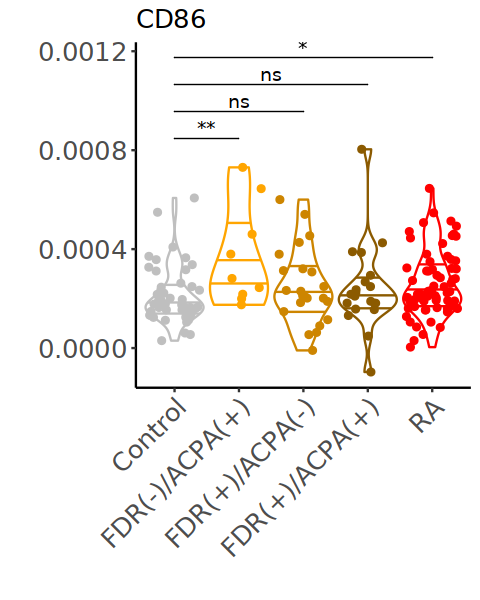

[1] "CXCR5"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.52
2 FDR(+)/ACPA(+)  1.55
3 FDR(+)/ACPA(-)  1.55
4 FDR(-)/ACPA(+)  1.55
5 RA              1.53


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


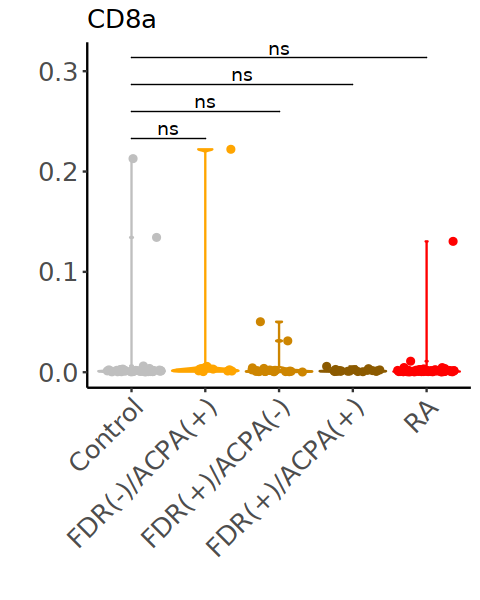

[1] "HLA-DR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.68
2 FDR(+)/ACPA(+)  1.68
3 FDR(+)/ACPA(-)  1.65
4 FDR(-)/ACPA(+)  1.69
5 RA              1.69


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


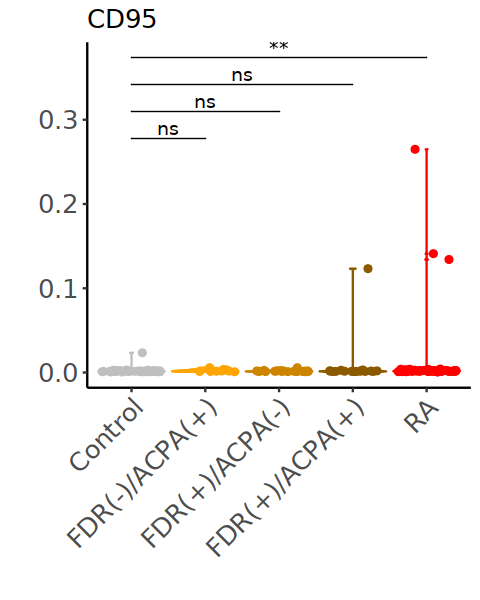

[1] "ISG15"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.320
2 FDR(+)/ACPA(+) 0.431
3 FDR(+)/ACPA(-) 0.357
4 FDR(-)/ACPA(+) 0.477
5 RA             0.480


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


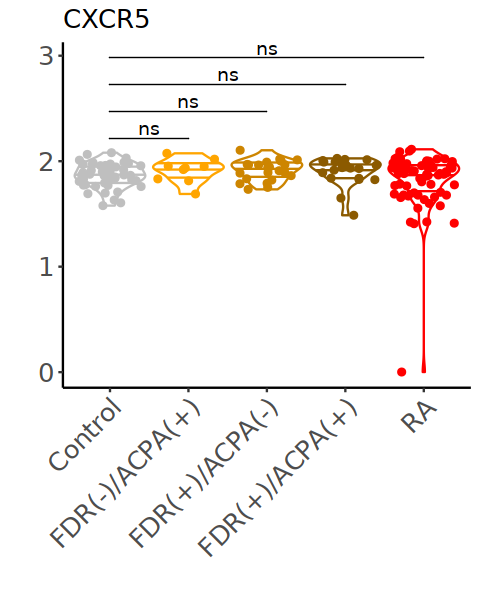

[1] "IgA"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00523
2 FDR(+)/ACPA(+) 0.00472
3 FDR(+)/ACPA(-) 0.00309
4 FDR(-)/ACPA(+) 0.00421
5 RA             0.156  


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


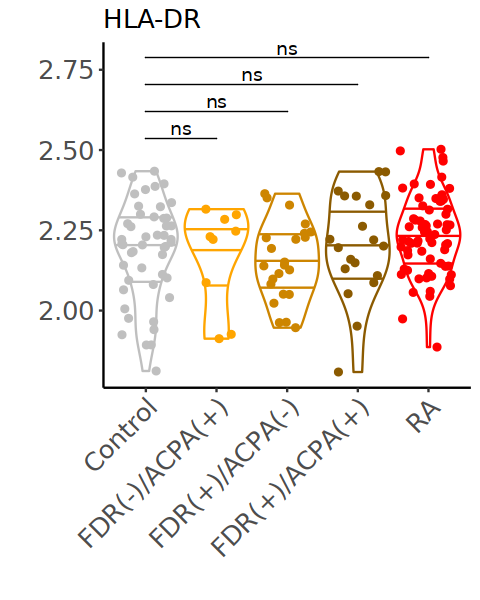

[1] "IgD"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.73
2 FDR(+)/ACPA(+)  1.76
3 FDR(+)/ACPA(-)  1.74
4 FDR(-)/ACPA(+)  1.74
5 RA              1.76


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


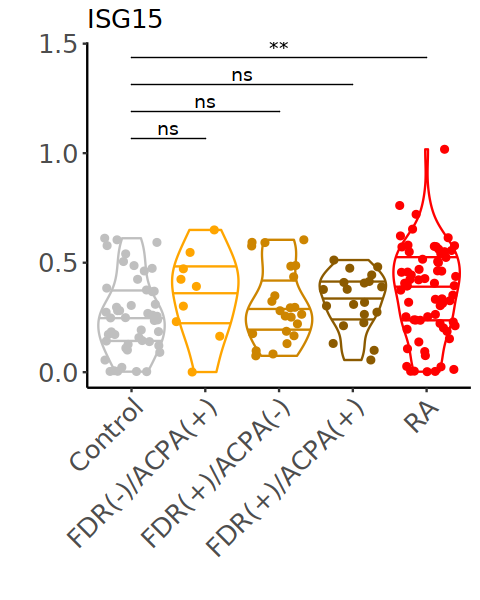

[1] "IgE"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000833
2 FDR(+)/ACPA(+) 0.000844
3 FDR(+)/ACPA(-) 0.000807
4 FDR(-)/ACPA(+) 0.000872
5 RA             0.000861


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


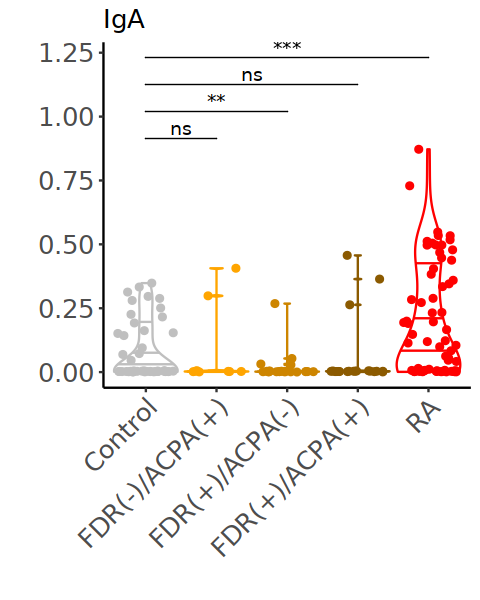

[1] "IgG"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00115
2 FDR(+)/ACPA(+) 0.00106
3 FDR(+)/ACPA(-) 0.00123
4 FDR(-)/ACPA(+) 0.00134
5 RA             0.00137


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


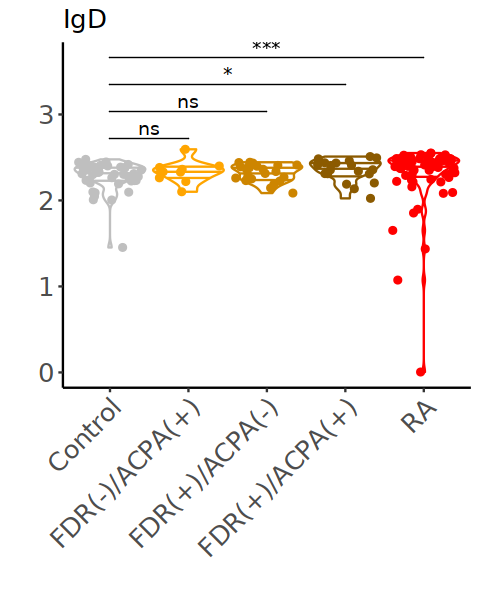

[1] "IgM"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.53
2 FDR(+)/ACPA(+)  1.56
3 FDR(+)/ACPA(-)  1.54
4 FDR(-)/ACPA(+)  1.54
5 RA              1.59


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


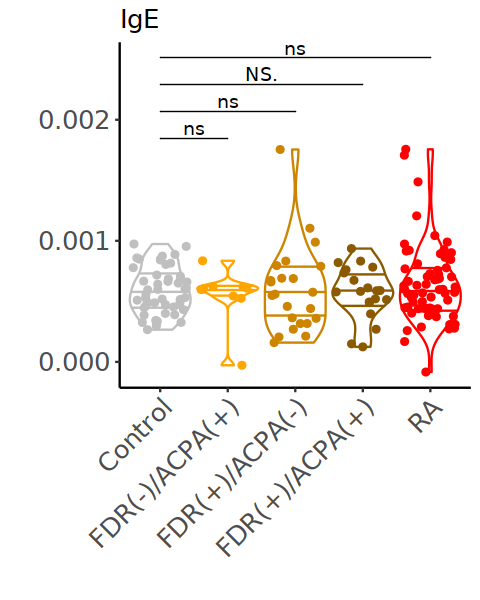

[1] "Ki67"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00228
2 FDR(+)/ACPA(+) 0.00228
3 FDR(+)/ACPA(-) 0.00230
4 FDR(-)/ACPA(+) 0.00293
5 RA             0.00229


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


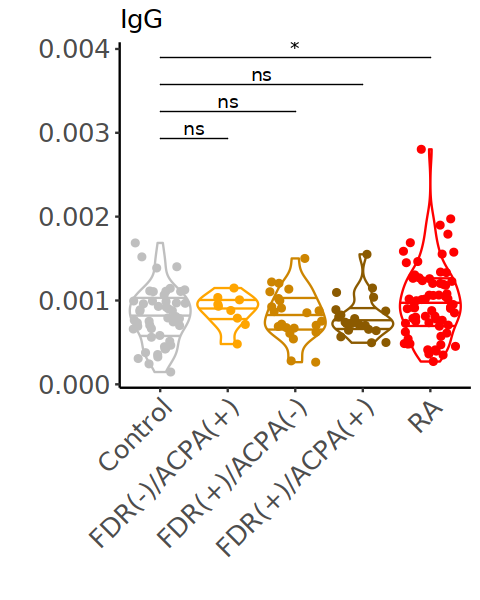

[1] "Nur77"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00470
2 FDR(+)/ACPA(+) 0.00549
3 FDR(+)/ACPA(-) 0.00520
4 FDR(-)/ACPA(+) 0.188  
5 RA             0.0520 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


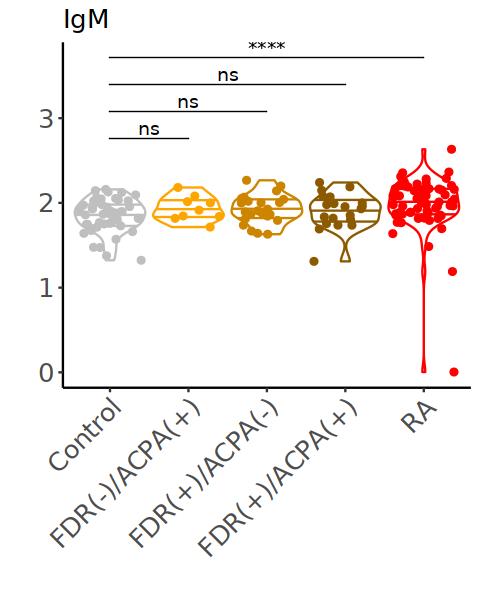

[1] "PD-L1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00344
2 FDR(+)/ACPA(+) 0.00286
3 FDR(+)/ACPA(-) 0.00281
4 FDR(-)/ACPA(+) 0.00240
5 RA             0.00291


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


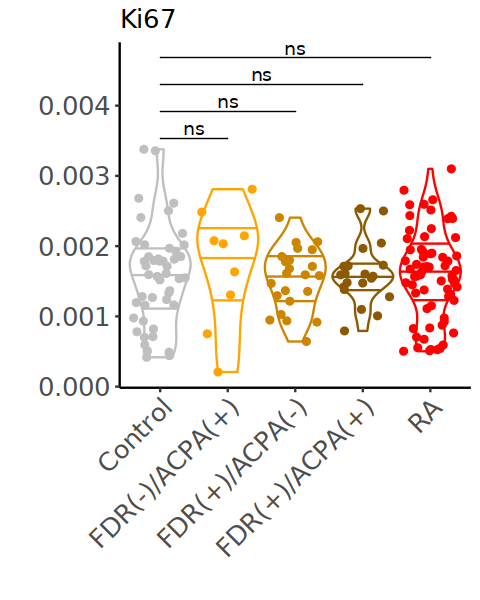

[1] "Pax-5"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.70
2 FDR(+)/ACPA(+)  1.73
3 FDR(+)/ACPA(-)  1.72
4 FDR(-)/ACPA(+)  1.72
5 RA              1.72


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


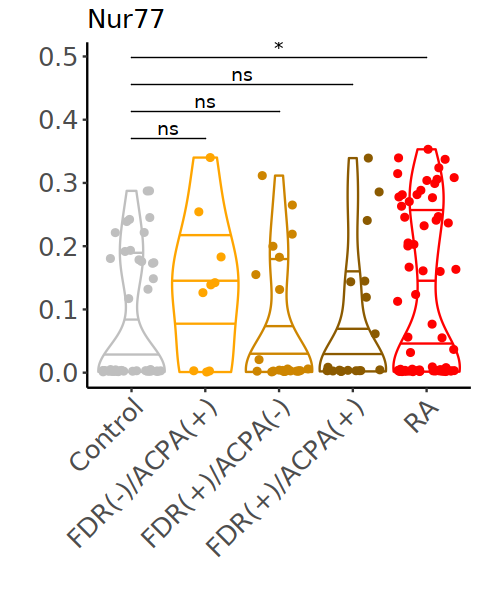

[1] "SLAMF7"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000290
2 FDR(+)/ACPA(+) 0.000324
3 FDR(+)/ACPA(-) 0.000344
4 FDR(-)/ACPA(+) 0.000331
5 RA             0.000342


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


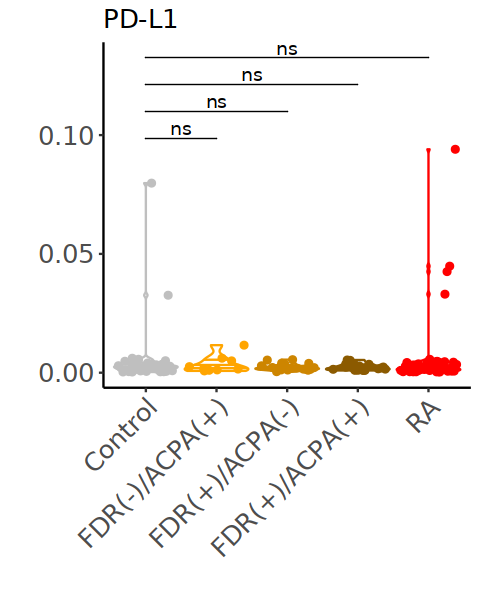

[1] "T-bet"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00153
2 FDR(+)/ACPA(+) 0.00179
3 FDR(+)/ACPA(-) 0.00172
4 FDR(-)/ACPA(+) 0.00155
5 RA             0.00181


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


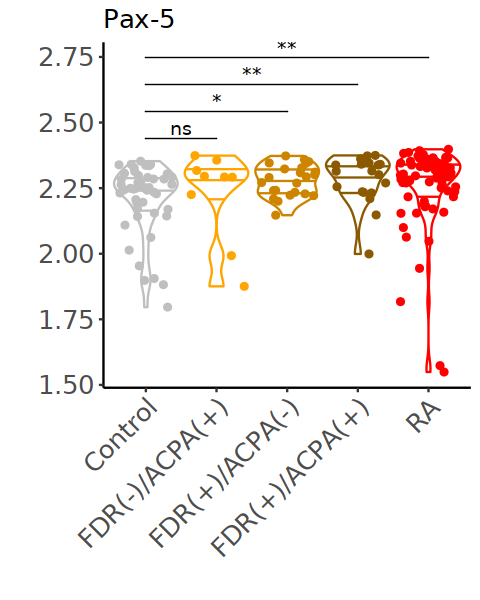

[1] "TLR9"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.837
2 FDR(+)/ACPA(+) 0.887
3 FDR(+)/ACPA(-) 0.847
4 FDR(-)/ACPA(+) 0.917
5 RA             0.885


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


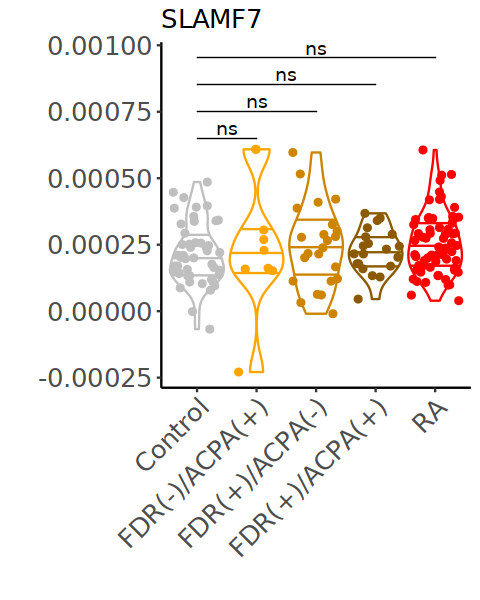

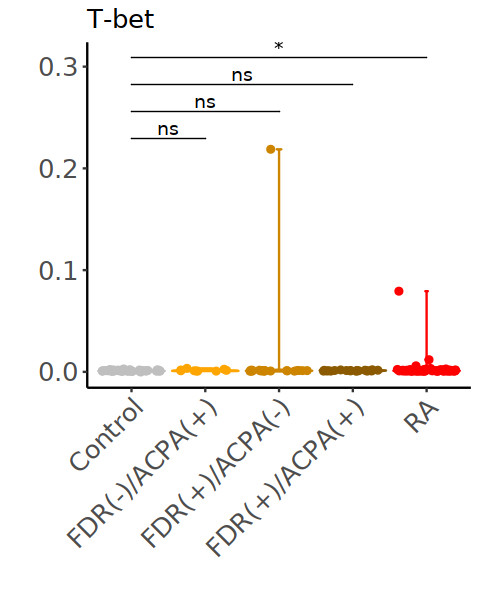

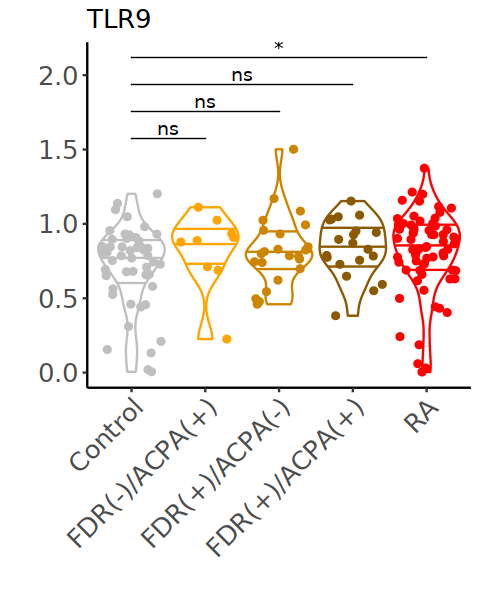

In [29]:

options(repr.plot.height = 5, repr.plot.width = 4)
for (gene in markers){
  print(gene)
  
  data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, AtRisk = umap_res$AtRisk) %>% 
    dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
    dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
    dplyr::group_by(subject_id, AtRisk) %>%
    dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
    dplyr::group_by(AtRisk) %>%
    dplyr::summarize(med = quantile(log2(med+1), probs = c(0.5))) %>% print()
  plot(
    data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, AtRisk = umap_res$AtRisk) %>% 
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
      dplyr::group_by(subject_id, AtRisk) %>%
      dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
      as.data.frame() %>%
      dplyr::mutate(AtRisk = factor(AtRisk,levels = c("Control","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)","FDR(+)/ACPA(+)","RA"))) %>%
      ggplot(., aes(x = AtRisk, y=med, fill = AtRisk, color = AtRisk)) + 
      geom_violin(aes(color = AtRisk), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
      geom_jitter(aes(fill = AtRisk, color = AtRisk)) +
      ggpubr::stat_compare_means(
        comparisons = list(c("Control", "FDR(-)/ACPA(+)"), c("Control", "FDR(+)/ACPA(-)"), c("Control", "FDR(+)/ACPA(+)"), c("Control", "RA")),
        label = "p.signif",
        tip.length = 0
      ) +
      scale_fill_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) +
      scale_color_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) + 
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
            strip.text.y=element_text(size=15, color="black", face="bold"),
            legend.position = "none",
            plot.title = element_text(size=15),
            axis.title.x = element_text(size=15),
            axis.title.y = element_text(size =15),
            axis.text.y = element_text(size = 15),
            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
            legend.text =  element_text(size = 15),
            legend.key.size = grid::unit(0.5, "lines"),
            legend.title = element_text(size = 0.8, hjust = 0)) +
      labs(title = gene,
           x = "",
           y = "") 
  )
  
}


In [30]:
# CNA; covarying neighborhood analysis

In [31]:
obj = readRDS(paste0("/pl/active/fanzhanglab/jinamo/cytof/data/B_cells/SeuratObj_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
obj@meta.data$subject_id <- stringr::str_split(obj@meta.data$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)

umap_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/umap_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# remove clusters less than cut off
min_cell_cluster = 30
clu = umap_res %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::arrange(count) %>%
    dplyr::filter(count > min_cell_cluster) %>%
    .$res_cell %>%
    unique()
clu_logi = umap_res$res_cell %in% clu
umap_res = umap_res[clu_logi,]

# Find cluster center
cluster_center <- umap_res %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1, UMAP2), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

Loading required package: SeuratObject

Attaching sp



In [32]:
# meta data

batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))
batch_fl$subject_id <- stringr::str_split(batch_fl$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)
batch_fl = batch_fl[clu_logi,]
umap_res$subject_id = batch_fl$subject_id
umap_res$time_point = batch_fl$time_point
all(umap_res$subject_id == obj@meta.data$subject_id)

meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
meta = merge(meta,obj@meta.data,by="subject_id")
meta = meta[order(match(meta$subject_id, obj@meta.data$subject_id)),]
print(head(meta))
print(dim(meta))
table(meta$sex)
table(meta$ethnicity)
table(meta$sex)
table(meta$AMP_Group)
table(meta$CCP)
table(meta$RF)
all(meta$subject_id == obj@meta.data$subject_id)

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_add = dplyr::left_join(obj@meta.data[,!grepl("CDAI",colnames(obj@meta.data))],meta_add,by="subject_id")
all(meta_add$subject_id == obj@meta.data$subject_id)

meta_add2 = read.table("/projects/jinamo@xsede.org/cytof/data/clinical_data_for_FAN_from_Kat.txt", header = TRUE, sep = "\t") %>%
  dplyr::select(-c(sex))
meta_add2 = dplyr::left_join(obj@meta.data[,!grepl("CDAI",colnames(obj@meta.data))],meta_add2,by="subject_id")
all(meta_add2$subject_id == obj@meta.data$subject_id)

meta_add3 = read.table("/projects/jinamo@xsede.org/cytof/data/RA_Cleaned_aggregate_vars.txt", header = TRUE, sep = "\t") %>%
  dplyr::select(c(subject_id,HAQ,das28_crp3,bmi,ra_group,pathotype_str,sdai,ccp_type,ccp_range,rf_range,mdtjc28_sum,mdsjc28_sum,diabetes,Race_white,Race_black,Race_multiple,Race_other,MTX,SSZ,HCQ,LEF,TNFi))
meta_add3 = dplyr::left_join(obj@meta.data,meta_add3,by="subject_id")
all(meta_add3$subject_id == obj@meta.data$subject_id)

[1] TRUE

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


  subject_id age_at_biopsy    sex    ethnicity diagnosis collection_method ctap
1   200_0272            28 female not_hispanic   Control              <NA> <NA>
2   200_0272            28 female not_hispanic   Control              <NA> <NA>
3   200_0272            28 female not_hispanic   Control              <NA> <NA>
4   200_0272            28 female not_hispanic   Control              <NA> <NA>
5   200_0272            28 female not_hispanic   Control              <NA> <NA>
6   200_0272            28 female not_hispanic   Control              <NA> <NA>
  AMP_Group  CCP   RF CCP30_titer CCP31_titer RF_IgM_titer RF_IgG_titer
1      <NA> <NA> <NA>          NA          NA           NA           NA
2      <NA> <NA> <NA>          NA          NA           NA           NA
3      <NA> <NA> <NA>          NA          NA           NA           NA
4      <NA> <NA> <NA>          NA          NA           NA           NA
5      <NA> <NA> <NA>          NA          NA           NA           NA
6      <


 female    male 
1327428  590811 


hispanic_latino    not_hispanic 
         329020         1560027 


 female    male 
1327428  590811 


   FDR     GP 
332245 146710 


Negative Positive 
  225039   253916 


Negative Positive 
  364285   114670 

[1] TRUE

[1] TRUE

[1] TRUE

[1] TRUE

In [33]:
# merge meta data to Seurat object
obj@meta.data$AtRisk = dplyr::case_when(
  meta$AMP_Group == "FDR" & meta$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta$AMP_Group == "GP" & meta$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta$AMP_Group == "FDR" & meta$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta$AMP_Group == "GP" & meta$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  obj@meta.data$disease == "Control" ~ "Control",
  obj@meta.data$disease == "RA" ~ "RA")
obj@meta.data$age_at_biopsy <- as.numeric(meta$age_at_biopsy)
obj@meta.data$sex <- as.numeric(factor(meta$sex, c('female', 'male')))
obj@meta.data$ethnicity <- as.numeric(factor(meta$ethnicity, c('not_hispanic', 'hispanic_latino')))
obj@meta.data$AMP_Group <- as.numeric(factor(meta$AMP_Group, c('GP', 'FDR')))
obj@meta.data$CCP <- as.numeric(factor(meta$CCP, c('Negative', 'Positive')))
obj@meta.data$CCP30_titer <- as.numeric(meta$CCP30_titer)
obj@meta.data$CCP31_titer <- as.numeric(meta$CCP31_titer)
obj@meta.data$RF <- as.numeric(factor(meta$RF, c('Negative', 'Positive')))
obj@meta.data$RF_IgM_titer <- as.numeric(meta$RF_IgM_titer)
obj@meta.data$RF_IgG_titer <- as.numeric(meta$RF_IgG_titer)
obj@meta.data$RF_IgA_titer <- as.numeric(meta$RF_IgA_titer)
obj@meta.data$batch <- as.numeric(factor(meta$batch))
obj@meta.data$AtRisk = factor(obj@meta.data$AtRisk,levels=c("Control","FDR(+)/ACPA(+)","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)","FDR(-)/ACPA(-)","RA"))
obj@meta.data$alt_AtRisk = dplyr::case_when(
  obj@meta.data$AtRisk == "FDR(-)/ACPA(-)" ~ "FDR(-)/ACPA(-)",
  obj@meta.data$AtRisk == "FDR(+)/ACPA(-)" | obj@meta.data$AtRisk == "FDR(-)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(+)/ACPA(+)" ~ "AtRiskRA",
  TRUE ~ "others")
obj@meta.data$ctap <- dplyr::case_when(
  meta$diagnosis == "AtRiskRA" ~ "AtRiskRA",
  meta$diagnosis == "Control" ~ "Control")
obj@meta.data$ctap <- ifelse(is.na(obj@meta.data$ctap),meta$ctap,obj@meta.data$ctap)
obj@meta.data$CDAI <- as.numeric(meta_add$CDAI)
obj@meta.data$krenn_lining <- as.numeric(meta_add$krenn_lining)
obj@meta.data$krenn_inflammation <- as.numeric(meta_add$krenn_inflammation)
obj@meta.data$treatment <- dplyr::case_when(
  meta$diagnosis == "AtRiskRA" ~ "AtRiskRA",
  meta$diagnosis == "Control" ~ "Control")
obj@meta.data$treatment <- ifelse(is.na(obj@meta.data$treatment),meta_add$treatment,obj@meta.data$treatment)
obj@meta.data$disease = dplyr::case_when(
  obj@meta.data$AtRisk == "FDR(+)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(-)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  obj@meta.data$AtRisk == "Control" | obj@meta.data$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  obj@meta.data$AtRisk == "RA" ~ "RA")
obj@meta.data$condition = obj@meta.data$disease
obj@meta.data$condition = factor(obj@meta.data$condition, levels = c('Control', 'AtRiskRA', "RA"))

obj@meta.data$CRP <- as.numeric(meta_add2$crp_result)
obj@meta.data$ESR <- as.numeric(meta_add2$esr_result)
obj@meta.data$RA_duration_years <- as.numeric(meta_add2$RA_duration_years)
obj@meta.data$CDAI <- ifelse(is.na(obj@meta.data$CDAI), as.numeric(meta_add2$cdai), obj@meta.data$CDAI)
obj@meta.data$SDAI <- as.numeric(meta_add3$sdai)
obj@meta.data$DAS28_ESR <- as.numeric(meta_add2$das28_esr3)
obj@meta.data$DAS28_CRP <- as.numeric(meta_add3$das28_crp3)
obj@meta.data$CCP31_titer <- ifelse(obj@meta.data$condition == "RA", as.numeric(meta_add2$ccp_result), obj@meta.data$CCP31_titer)
obj@meta.data$CCP31_cutoff <- as.numeric(meta_add3$ccp_range)
obj@meta.data$RF_IgM_titer <- ifelse(obj@meta.data$condition == "RA", as.numeric(meta_add2$rf_result), obj@meta.data$RF_IgM_titer)
obj@meta.data$RF_IgM_cutoff <- as.numeric(meta_add3$rf_range)
obj@meta.data$smoke_hx <- as.factor(meta_add2$smoke_hx)
obj@meta.data$smoke_current <- as.factor(meta_add2$smoke_current)
obj@meta.data$Methotrexate_only <- meta_add2$Methotrexate_only
obj@meta.data$TNFi_possible_nbDMARD <- meta_add2$TNFi_possible_nbDMARD
obj@meta.data$other_bDMARD <- meta_add2$other_bDMARD
obj@meta.data$other_nbDMARD_no_bDMARD <- meta_add2$other_nbDMARD_no_bDMARD
obj@meta.data$no_DMARD <- meta_add2$no_DMARD
obj@meta.data$bDMARD <- meta_add2$bDMARD
obj@meta.data$nbDMARD <- meta_add2$nbDMARD
obj@meta.data$Prednisone <- meta_add2$Prednisone
obj@meta.data$Prednisone_GE_7.5 <- ifelse(obj@meta.data$Prednisone, meta_add2$Prednisone_GE_7.5, FALSE)

obj@meta.data$time_point <- batch_fl$time_point

In [34]:
# Control vs AtRiskRA 
logi = obj$condition %in% c("Control","AtRiskRA")
obj_sub = readRDS(paste0("/pl/active/fanzhanglab/jinamo/cytof/data/B_cells/SeuratObj_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))


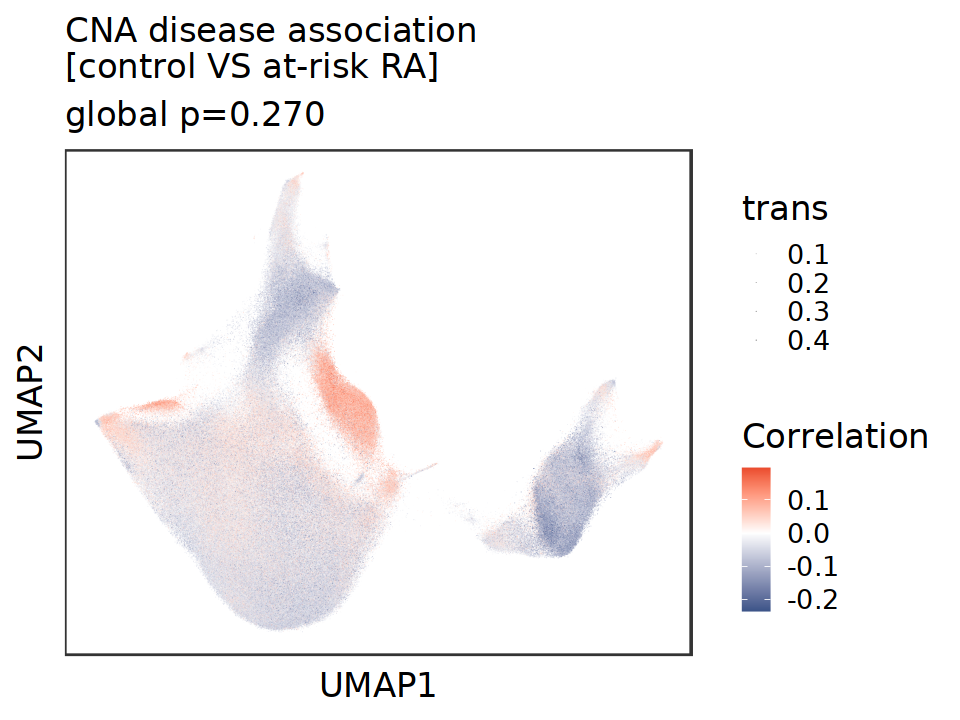

In [35]:
# positive correlation means association with at-risk RA
options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab" ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS at-risk RA]', 
         color = 'Correlation',
         subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


,cluster,size,model.pvalue,conditionAtRiskRA.OR,conditionAtRiskRA.OR.95pct.ci.lower,conditionAtRiskRA.OR.95pct.ci.upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cluster0,cluster0,198883,0.46603796,9.477989e-01,0.8456818,1.062247e+00
cluster1,cluster1,154129,0.08693608,1.107686e+00,1.0212051,1.201491e+00
cluster10,cluster10,8917,0.63602688,1.067747e+00,0.8823840,1.292050e+00
cluster11,cluster11,4387,0.31902385,9.175489e-01,0.7815902,1.077158e+00
cluster12,cluster12,2223,0.18978945,1.475131e+00,0.9293917,2.341329e+00
cluster13,cluster13,764,0.30890489,7.428223e-01,0.4420411,1.248266e+00
cluster14,cluster14,66,0.96610675,9.844368e-01,0.4921842,1.969011e+00
cluster15,cluster15,49,0.37817721,1.430986e+00,0.6512435,3.144326e+00
cluster16,cluster16,67,0.78329469,4.461500e+04,1021.3624323,1.948866e+06


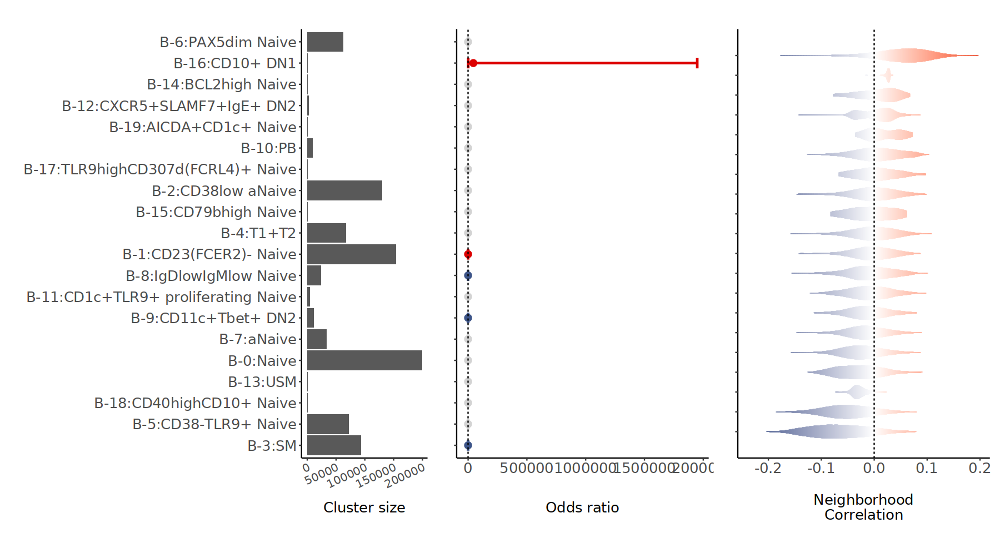

In [36]:
cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
cor_pos = cor_pos[cor_pos > 0]
# summary(cor_pos)
cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
cor_neg = cor_neg[cor_neg < 0]
# summary(cor_neg)

ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")

mywidth <- .35 # bit of trial and error
# This is all you need for the fill: 
vl_fill <- data.frame(ggplot_build(p)$data) %>%
  mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 

# Bit convoluted for the outline, need to be rearranged: the order matters
vl_poly <- 
  vl_fill %>% 
  select(xnew, xend, y, group) %>%
  pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
  arrange(y) %>%
  split(., .$oldx) %>%
  map(., function(x) {
    if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
    x
    }) %>%
  bind_rows()

if (length(cor_pos)!=0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +   
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)!=0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  }

# MASC: Mixed-effects association testing for single cells
## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.

masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/MASC_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
masc
g2 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 # CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 # CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 # OR = ifelse(CIupper==1|CIlower==1,1,OR)
                 ) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=OR, colour=col)) + 
  geom_point(position=position_dodge(width=0.3), size=3) +
  geom_errorbarh(aes(xmin=CIlower, xmax=CIupper), position = position_dodge(0.3), height=0.5, linewidth = 1) +
  scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
  scale_y_discrete(labels=cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[ord,] %>% .$clu_name) +
  geom_vline(xintercept=1, linetype='dashed', color='black') +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_blank(),
        axis.text.x = element_text(size = 15),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       y = "",
       x = "Odds ratio")

g3 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=size)) + 
  geom_bar(stat = "identity", position=position_dodge()) + 
  scale_y_discrete(labels=paste0("B-",
                                 cluster_df %>%
                                   magrittr::set_rownames(cluster_df$cluster) %>%
                                   .[ord,] %>% .$cluster,
                                 ":",
                                 cluster_df %>%
                                   magrittr::set_rownames(cluster_df$cluster) %>%
                                   .[ord,] %>% .$clu_name)
  ) +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 12, angle = 25, hjust = 1),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       y = "",
       x = "Cluster size")
options(repr.plot.height = 8, repr.plot.width = 15)
(g3+g2+g1)+plot_layout(widths = c(1,2,2))

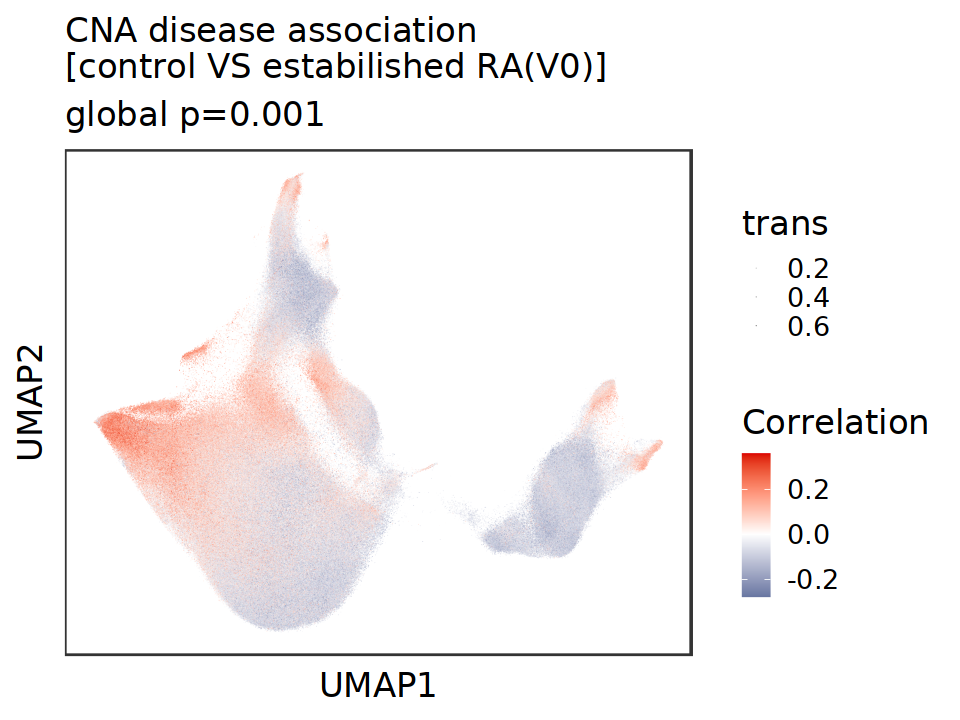

In [37]:
# Control vs RA(baseline)

logi = (obj$condition %in% c("RA","Control")) & (obj$time_point == "V0")
obj_sub = readRDS(paste0("/pl/active/fanzhanglab/jinamo/cytof/data/B_cells/SeuratObj_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# positive correlation means association with estabilished RA
options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab"  ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS estabilished RA(V0)]', 
         color = 'Correlation',
         subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )


,cluster,size,model.pvalue,conditionRA.OR,conditionRA.OR.95pct.ci.lower,conditionRA.OR.95pct.ci.upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cluster0,cluster0,223069,0.40398725,0.9446495,0.86902392,1.0268563
cluster1,cluster1,182348,0.08528180,1.1062886,1.03164610,1.1863318
cluster10,cluster10,12503,0.11758682,1.2370823,1.02398087,1.4945325
cluster11,cluster11,6074,0.16381426,1.1557568,0.94917127,1.4073054
cluster12,cluster12,2238,0.92956553,1.0234623,0.76755386,1.3646927
cluster13,cluster13,1016,0.51858682,1.1940666,0.74235727,1.9206318
cluster14,cluster14,72,0.94722176,0.9771583,0.50917757,1.8752562
cluster15,cluster15,40,0.62535170,0.8336143,0.41230141,1.6854484
cluster17,cluster17,36,0.49224678,1.3655256,0.57561288,3.2394345


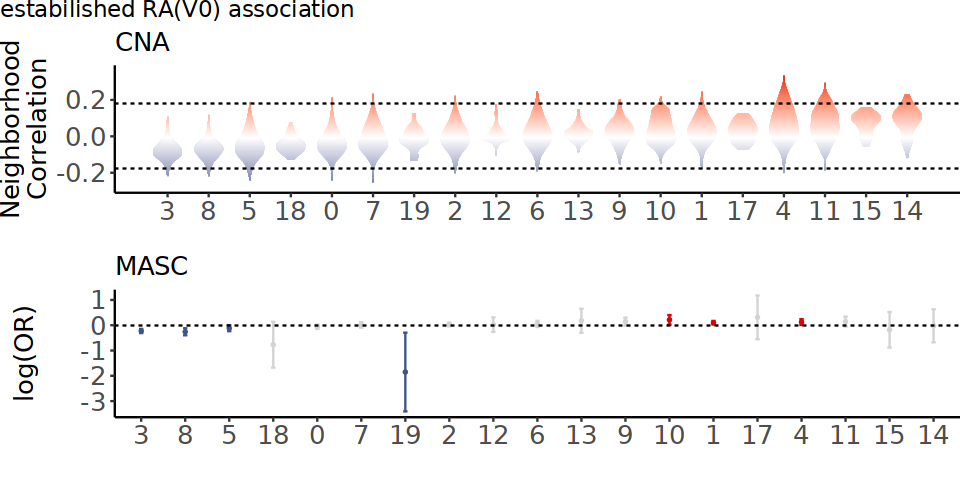

In [38]:
cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
cor_pos = cor_pos[cor_pos > 0]
# summary(cor_pos)
cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
cor_neg = cor_neg[cor_neg < 0]
# summary(cor_neg)

ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")

mywidth <- .35 # bit of trial and error
# This is all you need for the fill: 
vl_fill <- data.frame(ggplot_build(p)$data) %>%
  mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 

# Bit convoluted for the outline, need to be rearranged: the order matters
vl_poly <- 
  vl_fill %>% 
  select(xnew, xend, y, group) %>%
  pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
  arrange(y) %>%
  split(., .$oldx) %>%
  map(., function(x) {
    if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
    x
    }) %>%
  bind_rows()

if (length(cor_pos)!=0 & length(cor_neg)!=0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)!=0 & length(cor_neg)==0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)==0 & length(cor_neg)!=0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)==0 & length(cor_neg)==0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
}

# MASC: Mixed-effects association testing for single cells
## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.

masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/MASC_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
masc
g2 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=log(OR), colour=col)) + 
  geom_point(position=position_dodge(width=0.3), size=0.5) +
  geom_errorbarh(aes(xmin=log(CIlower), xmax=log(CIupper)), position = position_dodge(0.3), height=0.1) +
  scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
  geom_vline(xintercept=0, linetype='dashed', color='black') +
  theme_classic() +
  coord_flip() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 15),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "MASC",
       y = "",
       x = "log(OR)")

options(repr.plot.height = 4, repr.plot.width = 8)
(g1/guide_area()/g2) + 
    plot_layout(heights = c(3,0,3),guides = "collect") +
    plot_annotation(title = 'estabilished RA(V0) association')& theme(plot.margin = unit(c(0,0,0,0), "cm"))

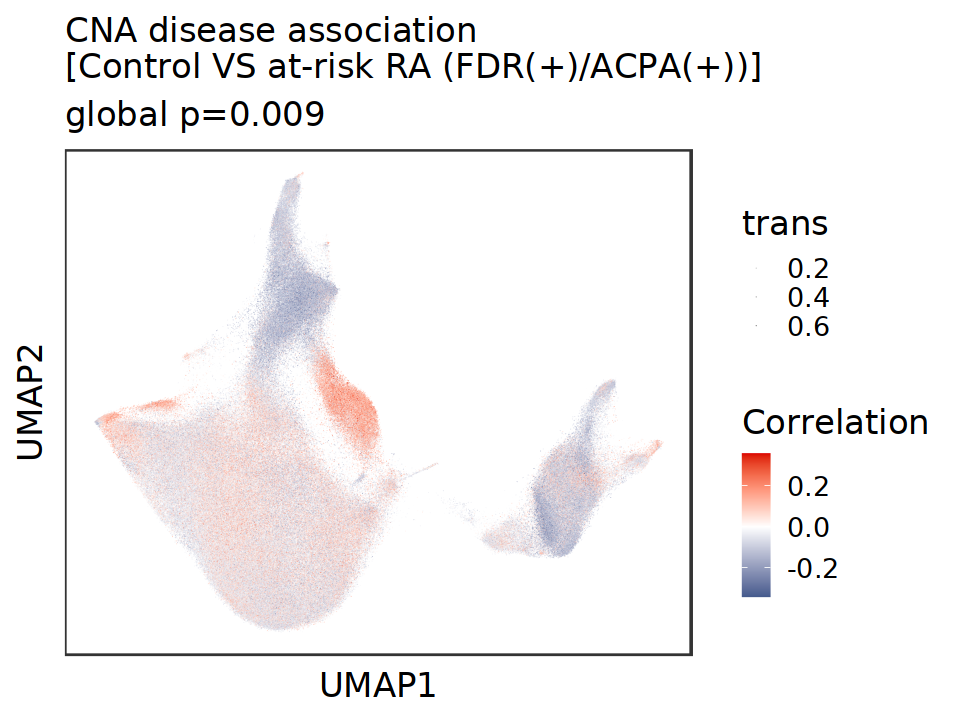

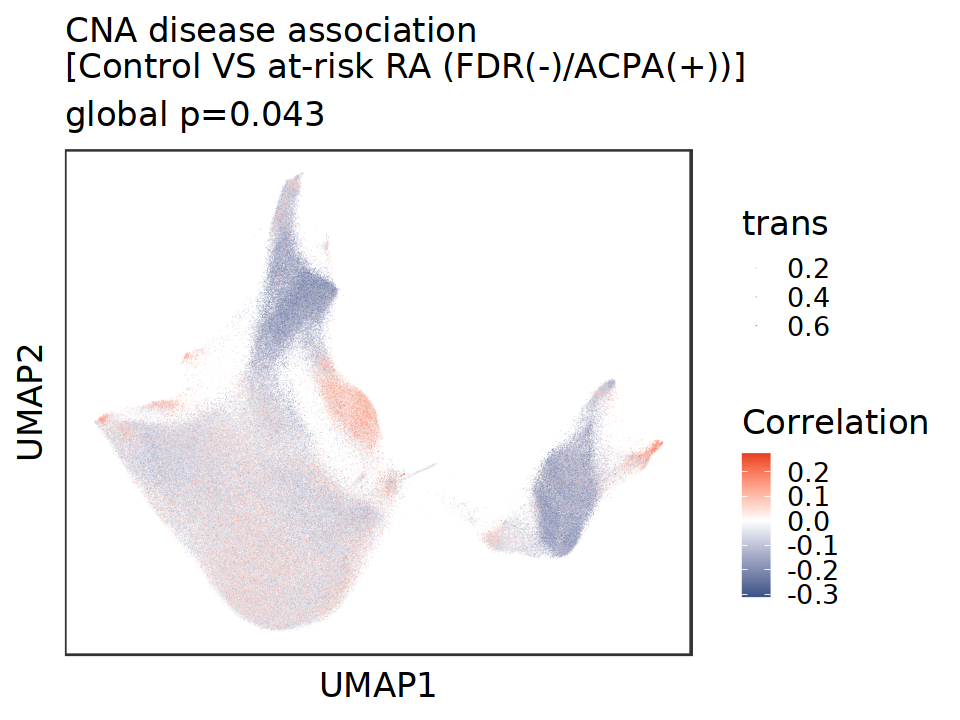

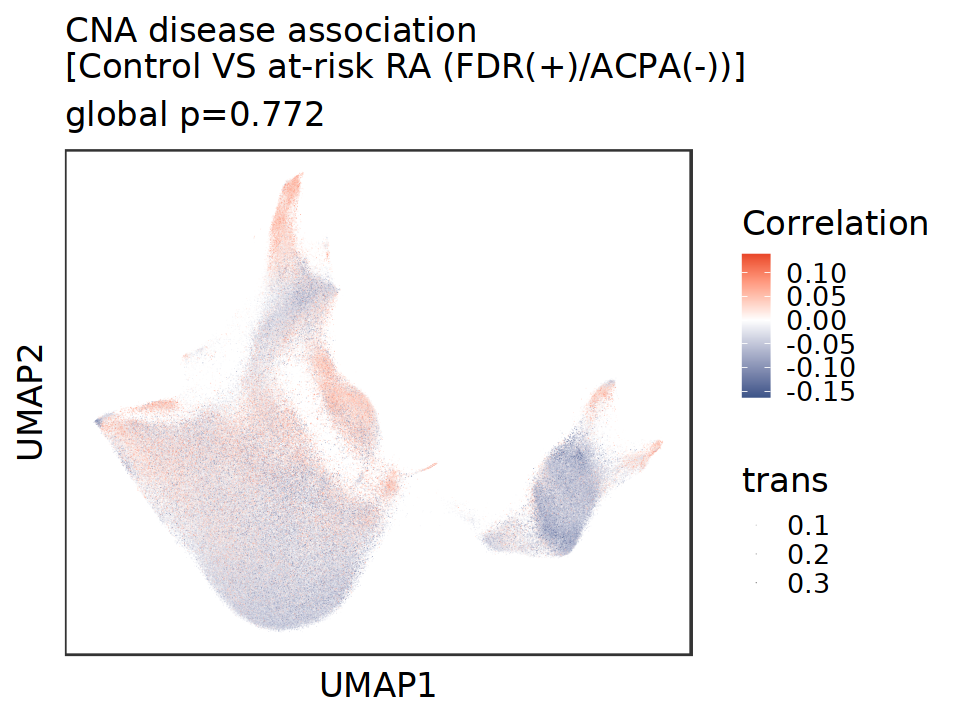

In [40]:
## At-risk RA subgroups vs Controls

options(repr.plot.height = 6, repr.plot.width = 8)
for(i in c("FDR(+)/ACPA(+)","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)")){
    
    # print(i)
    logi = (obj$condition == "Control" | obj$AtRisk == i)
    obj_sub = readRDS(paste0("/pl/active/fanzhanglab/jinamo/cytof/data/B_cells/SeuratObj_",gsub("/","",paste0("Control_",i)),"_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))

    # positive correlation means association with at-risk RA
    
    plot(
        cbind(umap_res[logi,],obj_sub@meta.data) %>%
        dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
        dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
        ggplot(aes(x = UMAP1, y = UMAP2)) +
           geom_point(
             aes(color = cna_ncorrs, alpha = trans),
               size = 0.001, stroke = 0, shape = 16
           ) +
           scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab" ) +
           labs(
             x = "UMAP1",
             y = "UMAP2",
             title = paste0('CNA disease association\n[Control VS at-risk RA (',i,')]'), 
             color = 'Correlation',
             subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
           ) +
           theme_bw(base_size = 20) +
           theme(
             legend.position = "right",
             axis.text = element_blank(),
             axis.ticks = element_blank(),
             panel.grid = element_blank(),
             plot.title = element_text(color="black", size=20)
           )
    )

}

Warning message:
“Groups with fewer than two data points have been dropped.”


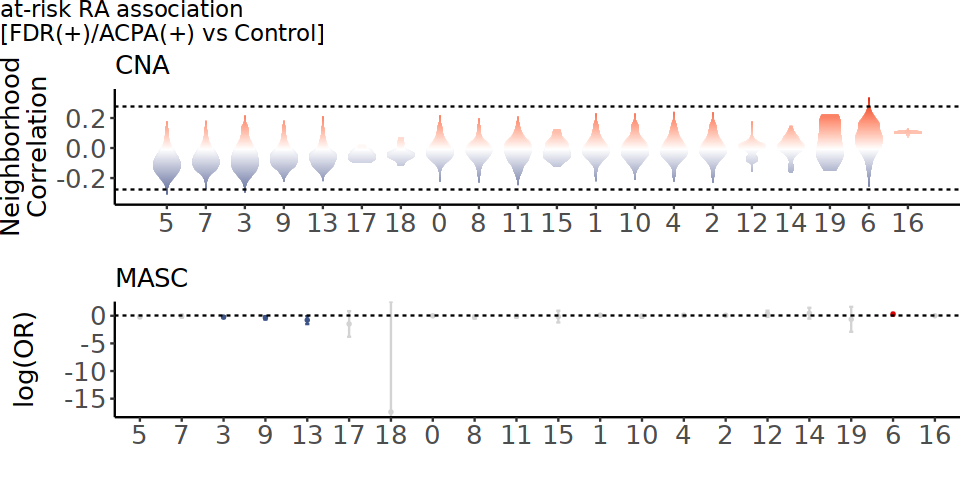

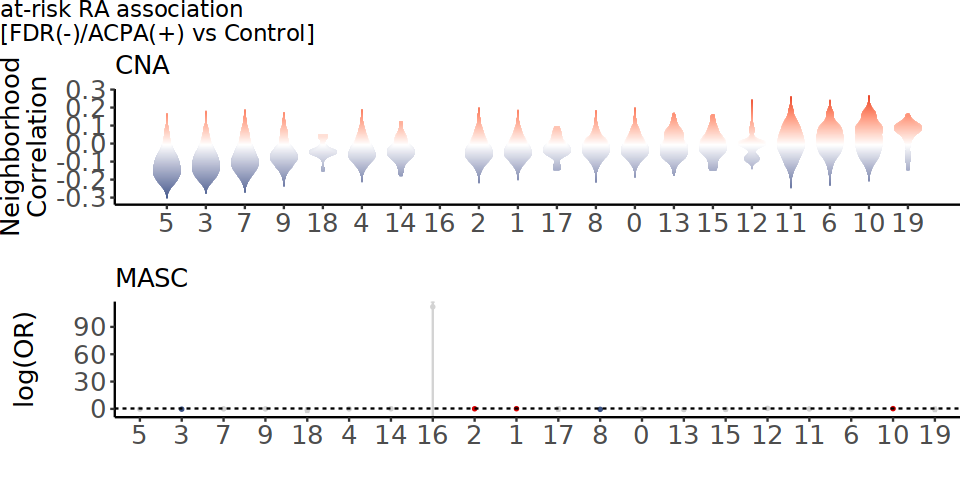

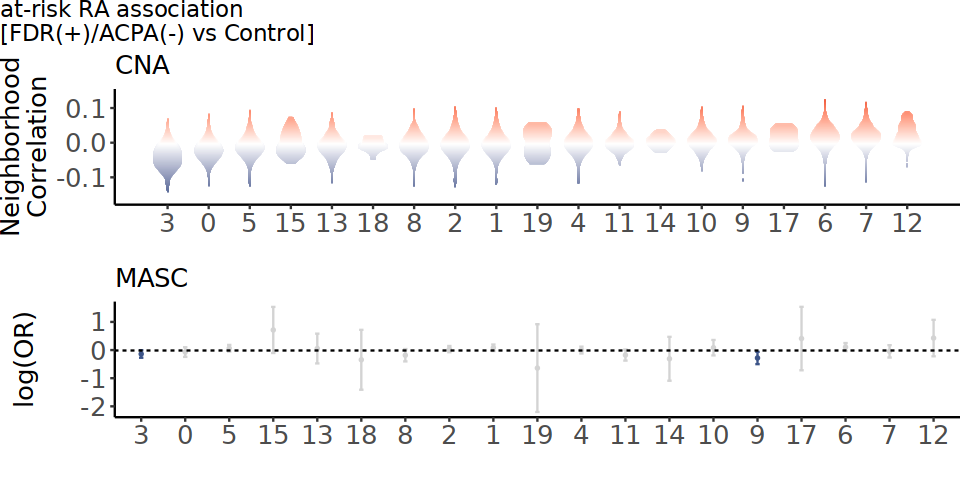

In [41]:
options(repr.plot.height = 4, repr.plot.width = 8)
for(i in c("FDR(+)/ACPA(+)","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)")){
  # print(i)
  
  logi = (obj$condition == "Control" | obj$AtRisk == i)
  obj_sub = readRDS(paste0("/pl/active/fanzhanglab/jinamo/cytof/data/B_cells/SeuratObj_",gsub("/","",paste0("Control_",i)),"_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))

  # positive correlation means association with at-risk RA
  
  cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
  cor_pos = cor_pos[cor_pos > 0]
  # summary(cor_pos)
  cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
  cor_neg = cor_neg[cor_neg < 0]
  # summary(cor_neg)
  
  ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

  p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width") 
    
  mywidth <- .35 # bit of trial and error
  # This is all you need for the fill: 
  vl_fill <- data.frame(ggplot_build(p)$data) %>%
    mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 
  
  # Bit convoluted for the outline, need to be rearranged: the order matters
  vl_poly <- 
    vl_fill %>% 
    select(xnew, xend, y, group) %>%
    pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
    arrange(y) %>%
    split(., .$oldx) %>%
    map(., function(x) {
      if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
      x
    }) %>%
    bind_rows()

  if (length(cor_pos)!=0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
        theme_classic() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "CNA",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)!=0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
        theme_classic() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "CNA",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
        theme_classic() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "CNA",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        theme_classic() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "CNA",
             x = "",
             y = "Neighborhood\nCorrelation") 
  }
  
  # MASC: Mixed-effects association testing for single cells
  ## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.
  
  # print(i)
  masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/B_cells/MASC_",gsub("/","",paste0("Control_",i)),"_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
    # print(head(masc))
  # positive correlation means association with at-risk RA
  
  g2 = masc %>%
    magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
    dplyr::mutate(cluster = gsub("cluster","",cluster),
                  cluster = factor(cluster,levels=ord)) %>%
    ggplot(., aes(y=cluster, x=log(OR), colour=col)) + 
    geom_point(position=position_dodge(width=0.3), size=0.5) +
    geom_errorbarh(aes(xmin=log(CIlower), xmax=log(CIupper)), position = position_dodge(0.3), height=0.1) +
    scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
    geom_vline(xintercept=0, linetype='dashed', color='black') +
    theme_classic() +
    coord_flip() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "MASC",
         y = "",
         x = "log(OR)")
  
  plot((g1/guide_area()/g2) + 
         plot_layout(heights = c(3,0,3),guides = "collect") +
         plot_annotation(title = paste0("at-risk RA association\n[",i," vs Control]"))& theme(plot.margin = unit(c(0,0,0,0), "cm")))
  
}